# 1. Business Understanding

This study aims to explore predictive analytics as a tool to improve early detection, reduce healthcare burden, and enhance patient outcomes. 
diseases, Alzheimer’s disease as a case study. The objectives of this research:

1. Develop Predictive Models: Use machine learning techniques to identify the early stages of neurological diseases by analysing clinical datasets.

2. Evaluate Disease Progression: Assess the effectiveness of the developed models in forecasting disease progression, with the goal of providing timely interventions and improving patient prognosis.

3. Resource Optimisation: Leverage predictive analytics to identify risk factors influencing disease prognosis, potentially reducing the burden on the healthcare system.

4. Integration into Clinical Practice: Provide recommendations on integrating predictive analytics into everyday clinical practices for improved decision-making.


# 2. Data Understanding

The goal is to explore this data if it is viable for our project and it meets the research purposes. 
The  data is an ADNI dataset of study participants with different diagnosis, there are important variables related to this business case that are necessary to fulfil the objectives of this business case. 
To understand the data, more exploration is needed and necessary to understand our data more. 




In [1]:
#Importing the Datasets and necessary libraries.

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import tensorflow
import lime
import shap

Adni = pd.read_csv('https://www.dropbox.com/scl/fi/yiosv8drav89calcgdzwg/ADNIMERGE_26May2025.csv?rlkey=j9s1tncd4tepfxhja1skre3x4&st=2504dahf&raw=1')
Adni.head()

C:\Users\home\AppData\Local\Temp\ipykernel_20068\3103146359.py:12: DtypeWarning: Columns (19,20,21,50,51,104,105,106) have mixed types. Specify dtype option on import or set low_memory=False.
  Adni = pd.read_csv('https://www.dropbox.com/scl/fi/yiosv8drav89calcgdzwg/ADNIMERGE_26May2025.csv?rlkey=j9s1tncd4tepfxhja1skre3x4&st=2504dahf&raw=1')


,RID,COLPROT,ORIGPROT,PTID,SITE,VISCODE,EXAMDATE,DX_bl,AGE,PTGENDER,...,PTAU_bl,FDG_bl,PIB_bl,AV45_bl,FBB_bl,Years_bl,Month_bl,Month,M,update_stamp
0,2,ADNI1,ADNI1,011_S_0002,11,bl,2005-09-08,CN,74.3,Male,...,NaN,1.33615,NaN,NaN,NaN,0.000000,0.00000,0,0,2023-07-07 04:59:40.0
1,3,ADNI1,ADNI1,011_S_0003,11,bl,2005-09-12,AD,81.3,Male,...,22.83,1.10860,NaN,NaN,NaN,0.000000,0.00000,0,0,2023-07-07 04:59:40.0
2,3,ADNI1,ADNI1,011_S_0003,11,m06,2006-03-13,AD,81.3,Male,...,22.83,1.10860,NaN,NaN,NaN,0.498289,5.96721,6,6,2023-07-07 04:59:40.0
3,3,ADNI1,ADNI1,011_S_0003,11,m12,2006-09-12,AD,81.3,Male,...,22.83,1.10860,NaN,NaN,NaN,0.999316,11.96720,12,12,2023-07-07 04:59:40.0
4,3,ADNI1,ADNI1,011_S_0003,11,m24,2007-09-12,AD,81.3,Male,...,22.83,1.10860,NaN,NaN,NaN,1.998630,23.93440,24,24,2023-07-07 04:59:40.0


In [2]:
#the number of observations
Adni.shape

(16421, 116)

In [3]:
#Understanding the Data types
Adni.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16421 entries, 0 to 16420
Columns: 116 entries, RID to update_stamp
dtypes: float64(88), int64(5), object(23)
memory usage: 14.5+ MB


In [91]:
#Identifying the columns that are present in the data sets 
for i, col in enumerate(Adni.columns):
    print(f"{i}: '{col}'")

0: 'RID'
1: 'COLPROT'
2: 'ORIGPROT'
3: 'PTID'
4: 'SITE'
5: 'VISCODE'
6: 'EXAMDATE'
7: 'DX_bl'
8: 'AGE'
9: 'PTGENDER'
10: 'PTEDUCAT'
11: 'PTETHCAT'
12: 'PTRACCAT'
13: 'PTMARRY'
14: 'APOE4'
15: 'FDG'
16: 'PIB'
17: 'AV45'
18: 'FBB'
19: 'ABETA'
20: 'TAU'
21: 'PTAU'
22: 'CDRSB'
23: 'ADAS11'
24: 'ADAS13'
25: 'ADASQ4'
26: 'MMSE'
27: 'RAVLT_immediate'
28: 'RAVLT_learning'
29: 'RAVLT_forgetting'
30: 'RAVLT_perc_forgetting'
31: 'LDELTOTAL'
32: 'DIGITSCOR'
33: 'TRABSCOR'
34: 'FAQ'
35: 'MOCA'
36: 'EcogPtMem'
37: 'EcogPtLang'
38: 'EcogPtVisspat'
39: 'EcogPtPlan'
40: 'EcogPtOrgan'
41: 'EcogPtDivatt'
42: 'EcogPtTotal'
43: 'EcogSPMem'
44: 'EcogSPLang'
45: 'EcogSPVisspat'
46: 'EcogSPPlan'
47: 'EcogSPOrgan'
48: 'EcogSPDivatt'
49: 'EcogSPTotal'
50: 'FLDSTRENG'
51: 'FSVERSION'
52: 'IMAGEUID'
53: 'Ventricles'
54: 'Hippocampus'
55: 'WholeBrain'
56: 'Entorhinal'
57: 'Fusiform'
58: 'MidTemp'
59: 'ICV'
60: 'DX'
61: 'mPACCdigit'
62: 'mPACCtrailsB'
63: 'EXAMDATE_bl'
64: 'CDRSB_bl'
65: 'ADAS11_bl'
66: 'ADAS13_bl'

In [92]:
Adni.dtypes

RID               int64
COLPROT          object
ORIGPROT         object
PTID             object
SITE              int64
                 ...   
Years_bl        float64
Month_bl        float64
Month             int64
M                 int64
update_stamp     object
Length: 116, dtype: object

In [94]:
#Processing for data that are essential to this case study. 
baseline_Adni = Adni[Adni['VISCODE'] == 'bl']
print(baseline_Adni['DX'].value_counts())

DX
MCI         1101
CN           895
Dementia     413
Name: count, dtype: int64


In [3]:
#Keeping relevant columns limited to our focus
columns_to_keep = [
    # Demographics & Genetic
    'RID', 'PTGENDER', 'AGE', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4',

    # Diagnosis 
    'DX_bl', 'DX', 'VISCODE', 'Month_bl', 'Month',

    # Cognitive test Scores
    'MMSE', 'MMSE_bl', 'CDRSB', 'CDRSB_bl', 'ADAS11', 'ADAS11_bl',
    'ADAS13', 'ADAS13_bl', 'FAQ', 'FAQ_bl', 'MOCA', 'MOCA_bl',
    'RAVLT_immediate', 'RAVLT_immediate_bl', 'RAVLT_forgetting', 'RAVLT_forgetting_bl',
    'RAVLT_perc_forgetting', 'RAVLT_perc_forgetting_bl', 'LDELTOTAL', 'LDELTOTAL_bl',
    'DIGITSCOR', 'DIGITSCOR_bl', 'TRABSCOR', 'TRABSCOR_bl',
    'mPACCdigit', 'mPACCdigit_bl', 'mPACCtrailsB', 'mPACCtrailsB_bl',

    #CSF biomarkers
    'ABETA', 'ABETA_bl', 'TAU', 'TAU_bl', 'PTAU', 'PTAU_bl'
]

# Step 3: Keep only columns that actually exist in the DataFrame
filtered_columns = [col for col in columns_to_keep if col in Adni.columns]
Adni_filtered = Adni[filtered_columns]

In [4]:
#Saving the new datasets 
Adni_filtered = Adni_filtered.to_csv('Adni_filtered.csv', index=False)

In [5]:
#This code will read our csv and the ID will be the index
Adni_filtered = pd.read_csv('Adni_filtered.csv', index_col=0)
Adni_filtered.head(30)

C:\Users\home\AppData\Local\Temp\ipykernel_20068\595979373.py:2: DtypeWarning: Columns (40,42,43,44,45) have mixed types. Specify dtype option on import or set low_memory=False.
  Adni_filtered = pd.read_csv('Adni_filtered.csv', index_col=0)


,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX_bl,DX,VISCODE,...,mPACCdigit,mPACCdigit_bl,mPACCtrailsB,mPACCtrailsB_bl,ABETA,ABETA_bl,TAU,TAU_bl,PTAU,PTAU_bl
RID,,,,,,,,,,,,,,,,,,,,,
2,Male,74.3,16,Not Hisp/Latino,White,Married,0.0,CN,CN,bl,...,-4.310280,-4.31028,-4.114430,-4.11443,NaN,NaN,NaN,NaN,NaN,NaN
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,bl,...,-16.244900,-16.24490,-15.829900,-15.82990,741.5,741.5,239.7,239.7,22.83,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m06,...,-14.769000,-16.24490,-13.139500,-15.82990,NaN,741.5,NaN,239.7,NaN,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m12,...,-20.969100,-16.24490,-19.779000,-15.82990,601.4,741.5,251.7,239.7,24.18,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m24,...,-19.713600,-16.24490,-19.894200,-15.82990,NaN,741.5,NaN,239.7,NaN,22.83
4,Male,67.5,10,Hisp/Latino,White,Married,0.0,LMCI,MCI,bl,...,-8.421500,-8.42150,-9.449350,-9.44935,1501.0,1501.0,153.1,153.1,13.29,13.29
4,Male,67.5,10,Hisp/Latino,White,Married,0.0,LMCI,MCI,m06,...,-7.232670,-8.42150,-6.394750,-9.44935,NaN,1501.0,NaN,153.1,NaN,13.29
4,Male,67.5,10,Hisp/Latino,White,Married,0.0,LMCI,MCI,m12,...,-9.061240,-8.42150,-10.289100,-9.44935,1176.0,1501.0,159.7,153.1,13.3,13.29
4,Male,67.5,10,Hisp/Latino,White,Married,0.0,LMCI,MCI,m18,...,-7.873660,-8.42150,-7.625370,-9.44935,NaN,1501.0,NaN,153.1,NaN,13.29


The above data set contains 45 columns but each row as observed, contains varying observations with the same primary key. 
This shows that the data is a long data and each time a patient visits, a new entry is inputted at the time of visit. 

In [7]:
#Identifying the new columns for better understanding.
for i, col in enumerate(Adni_filtered.columns):
    print(f"{i}: '{col}'")

0: 'PTGENDER'
1: 'AGE'
2: 'PTEDUCAT'
3: 'PTETHCAT'
4: 'PTRACCAT'
5: 'PTMARRY'
6: 'APOE4'
7: 'DX_bl'
8: 'DX'
9: 'VISCODE'
10: 'Month_bl'
11: 'Month'
12: 'MMSE'
13: 'MMSE_bl'
14: 'CDRSB'
15: 'CDRSB_bl'
16: 'ADAS11'
17: 'ADAS11_bl'
18: 'ADAS13'
19: 'ADAS13_bl'
20: 'FAQ'
21: 'FAQ_bl'
22: 'MOCA'
23: 'MOCA_bl'
24: 'RAVLT_immediate'
25: 'RAVLT_immediate_bl'
26: 'RAVLT_forgetting'
27: 'RAVLT_forgetting_bl'
28: 'RAVLT_perc_forgetting'
29: 'RAVLT_perc_forgetting_bl'
30: 'LDELTOTAL'
31: 'DIGITSCOR'
32: 'DIGITSCOR_bl'
33: 'TRABSCOR'
34: 'TRABSCOR_bl'
35: 'mPACCdigit'
36: 'mPACCdigit_bl'
37: 'mPACCtrailsB'
38: 'mPACCtrailsB_bl'
39: 'ABETA'
40: 'ABETA_bl'
41: 'TAU'
42: 'TAU_bl'
43: 'PTAU'
44: 'PTAU_bl'


# 2.1 Data Dictionary 

It is important to have a data dictionary for the columns we filtered for in the datasets. This makes data exploration easy for whoever reads this code. 

| Variable   | Description                                                                 |
| ---------- | --------------------------------------------------------------------------- |
| `RID`      | **Participant ID** — unique subject identifier                              |
| `PTGENDER` | **Gender** — Male or Female                                                 |
| `AGE`      | **Age** — participant's age at visit                                        |
| `PTEDUCAT` | **Education** — years of formal education completed                         |
| `PTETHCAT` | **Ethnicity** — e.g., Hispanic, Not Hispanic                                |
| `PTRACCAT` | **Race** — e.g., White, Black, Asian                                        |
| `PTMARRY`  | **Marital status** — e.g., Married, Widowed, Single                         |
| `APOE4`    | **APOE ε4 allele count** — genetic risk for Alzheimer’s (0, 1, or 2 copies) |
| **Diagnosis and Visit Tracking** |
| `DX_BL`    | **Baseline diagnosis** — diagnosis at first visit: NL (Normal), MCI, or AD |
| `DX`       | **Diagnosis at this visit** — updated diagnosis at current timepoint       |
| `VISCODE`  | **Visit code** — e.g., `bl` (baseline), `m12` (12 months), `m24`, etc.     |
| `MONTH_BL` | **Baseline month** — set to 0 (first visit)                                |
| `MONTH`    | **Months since baseline** — how long since the first visit                 |
| **Cognitive Scores** |
| `MMSE`, `MMSE_BL`     | **Mini-Mental State Exam (0–30)** — higher = better cognition                     |
| `CDRSB`, `CDRSB_BL`   | **Clinical Dementia Rating - Sum of Boxes (0–18)** — higher = more impairment     |
| `ADAS11`, `ADAS11_BL` | **ADAS-Cog 11 (0–70)** — Alzheimer’s Disease Assessment Scale, higher = worse     |
| `ADAS13`, `ADAS13_BL` | **ADAS-Cog 13 (0–85)** — extended version, higher = worse                         |
| `FAQ`, `FAQ_BL`       | **Functional Activities Questionnaire (0–30)** — higher = more functional decline |
| `MOCA`, `MOCA_BL`     | **Montreal Cognitive Assessment (0–30)** — higher = better cognition              |
| **Memory Test (RAVLT & Logical Memory)** |
| `RAVLT_IMMEDIATE`, `_BL`       | **RAVLT Immediate Recall (sum of 5 trials, 0–75)** — higher = better memory |
| `RAVLT_FORGETTING`, `_BL`      | **RAVLT Forgetting (Trial 5 – Delay)** — higher = more memory loss          |
| `RAVLT_PERC_FORGETTING`, `_BL` | **Percent Forgetting** — 100% = completely forgot                           |
| `LDELTOTAL`, `_BL`             | **Logical Memory II — Delayed Recall (0–25)** — higher = better             |
| **Executive & Processing Speed** |
| `DIGITSCOR`, `_BL`    | **Digit Symbol Substitution (0–133)** — higher = better speed/attention     |
| `TRABSCOR`, `_BL`     | **Trail Making Test B (seconds, lower = better)** — executive function test |
| `MPACCDIGIT`, `_BL`   | **Composite score using Digit Symbol (PACC-Digit)** — higher = better       |
| `MPACCTRAILSB`, `_BL` | **Composite score using Trails B (PACC-TrailsB)** — higher = better         |
| **CSF Biomarkers (Biological Inidicators of AD)** |
| `ABETA`, `ABETA_BL` | **Amyloid-beta 42 (pg/mL)** — **lower = more amyloid plaques** (bad)  |
| `TAU`, `TAU_BL`     | **Total Tau protein (pg/mL)** — **higher = more neuronal damage**     |
| `PTAU`, `PTAU_BL`   | **Phosphorylated Tau (pg/mL)** — **higher = Alzheimer’s progression** |



# 2.2 Initial Exploration

In [6]:
# 2.2 Describing the data sets. 
Adni_filtered.describe().T

,count,mean,std,min,25%,50%,75%,max
AGE,16412.0,73.214173,7.028099,50.4000,68.500000,73.20000,78.100000,91.40000
PTEDUCAT,16421.0,16.105779,2.762672,4.0000,14.000000,16.00000,18.000000,20.00000
APOE4,16056.0,0.516193,0.646953,0.0000,0.000000,0.00000,1.000000,2.00000
Month_bl,16421.0,32.792027,35.203809,0.0000,6.065570,23.47540,48.032800,203.11500
Month,16421.0,32.712259,35.193789,0.0000,6.000000,24.00000,48.000000,204.00000
MMSE,11469.0,26.787340,3.882297,0.0000,25.000000,28.00000,29.000000,30.00000
MMSE_bl,16419.0,27.756928,2.351043,16.0000,26.000000,29.00000,30.000000,30.00000
CDRSB,11747.0,2.047927,2.866563,0.0000,0.000000,1.00000,3.000000,18.00000
CDRSB_bl,16421.0,1.214938,1.521129,0.0000,0.000000,0.50000,2.000000,10.00000
ADAS11,11431.0,10.889419,8.391425,0.0000,5.000000,8.67000,14.000000,70.00000


The above description shows an overview of numeric values we have in our table. The min and max represents ranges of the values and most importantly the standard deviation and other measures of frequency that paints the picture of our data.

NOTE: the flunctuating count in our datasets, which gives an idea of missing values.  

<Axes: title={'center': 'Missing Data % by Column'}>

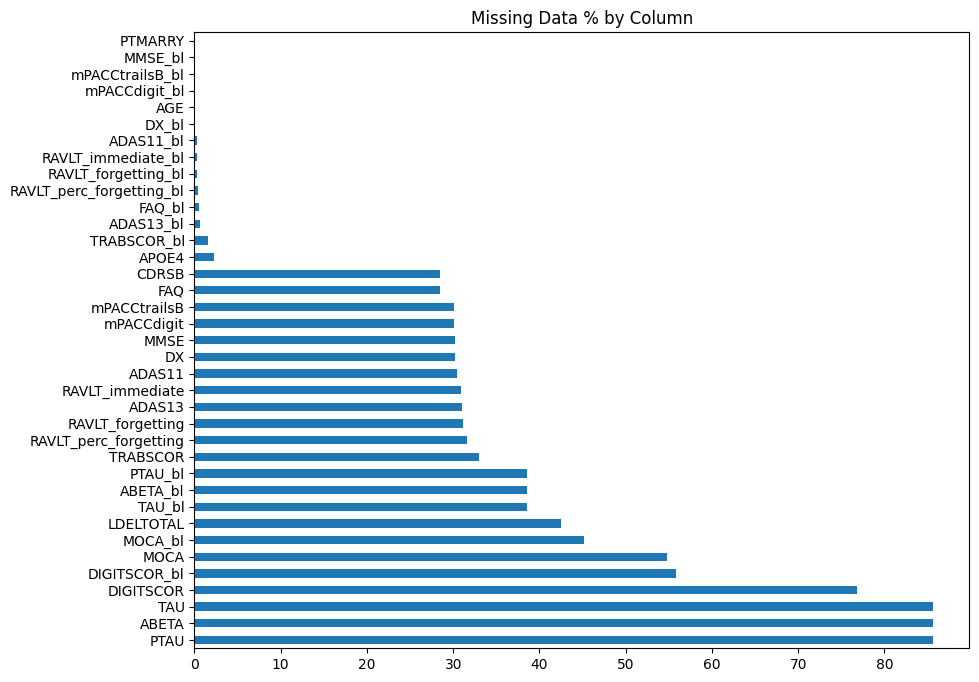

In [100]:
# Percent of missing values per column
missing = Adni_filtered.isnull().mean().sort_values(ascending=False) * 100
missing[missing > 0].plot(kind='barh', figsize=(10, 8), title="Missing Data % by Column")


<Axes: title={'center': 'Class Distribution (DX)'}, xlabel='DX'>

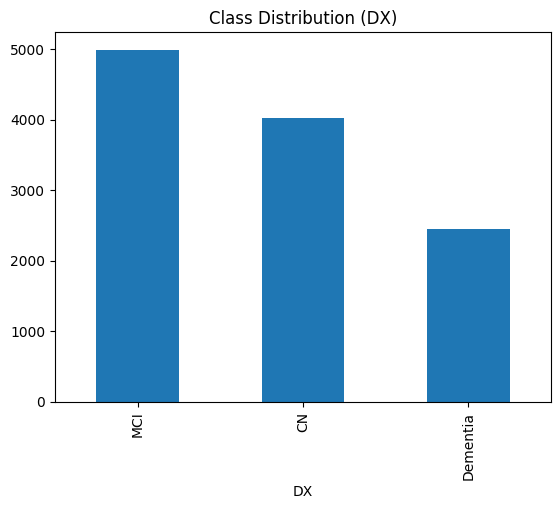

In [101]:
#Visualisation for distribution of diagnosis class of our datasets. 
Adni_filtered['DX'].value_counts().plot(kind='bar', title="Class Distribution (DX)")


<Axes: title={'center': 'Class Distribution (Baseline)'}, xlabel='DX_bl'>

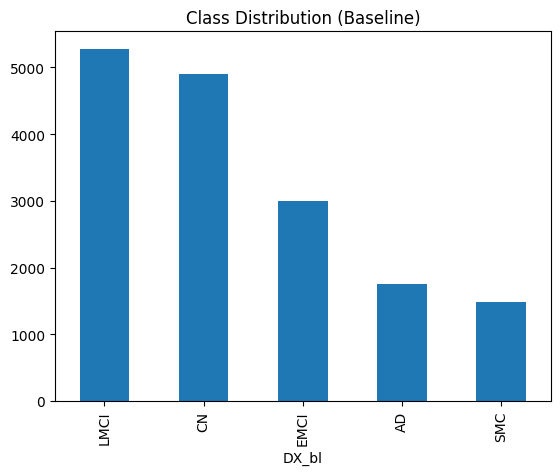

In [102]:
#Visualisation for distribution of diagnosis class of our datasets. 
Adni_filtered['DX_bl'].value_counts().plot(kind='bar', title="Class Distribution (Baseline)")

This visualisation might be deemed early, but it is important to understand the class of data we have and bare in mind how to tackle class imbalance later.

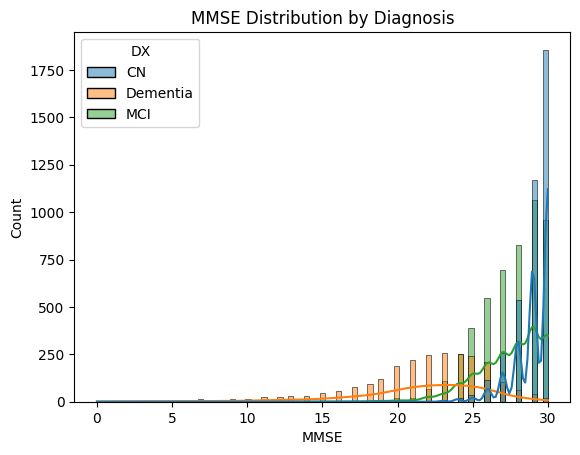

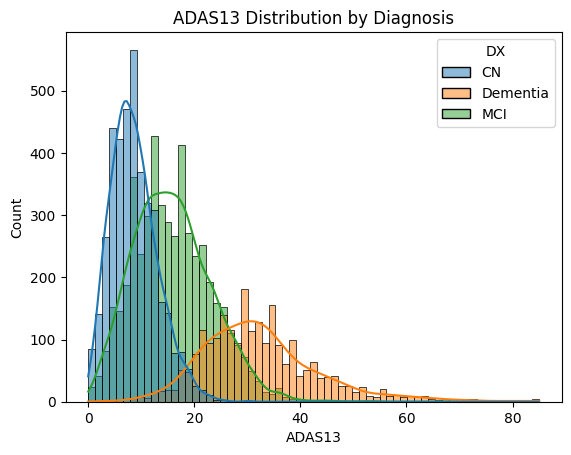

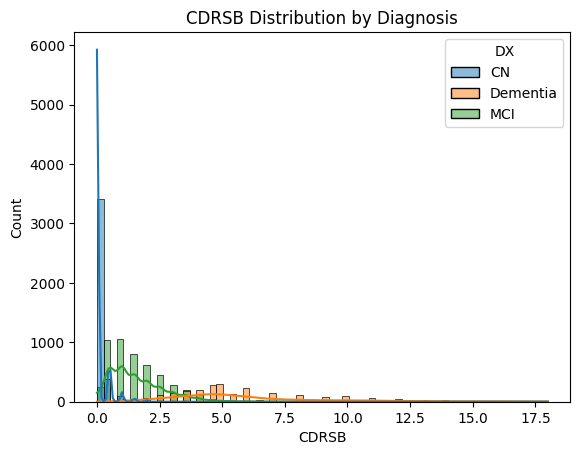

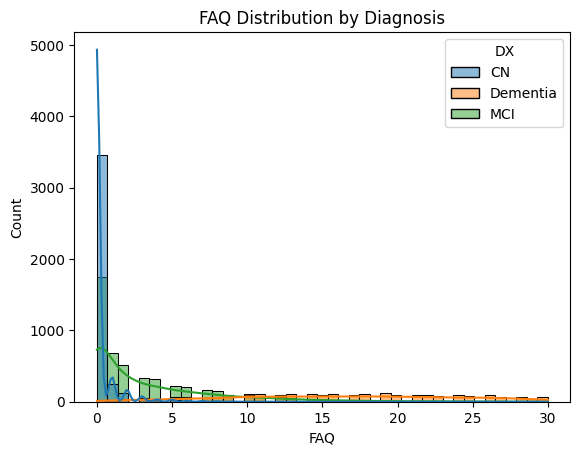

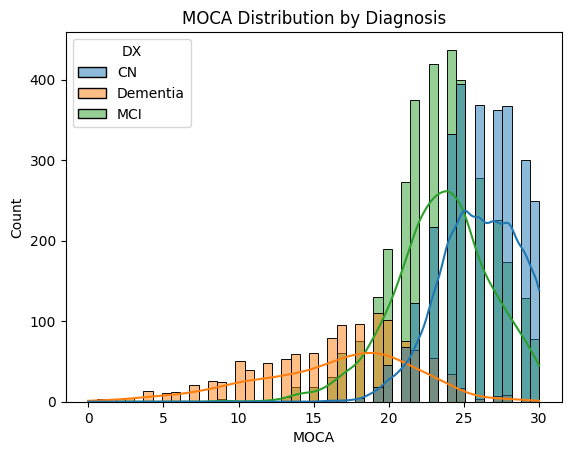

In [103]:
score_columns = ['MMSE', 'ADAS13', 'CDRSB', 'FAQ', 'MOCA']

for col in score_columns:
    sns.histplot(data=Adni, x=col, hue='DX', kde=True)
    plt.title(f"{col} Distribution by Diagnosis")
    plt.show()

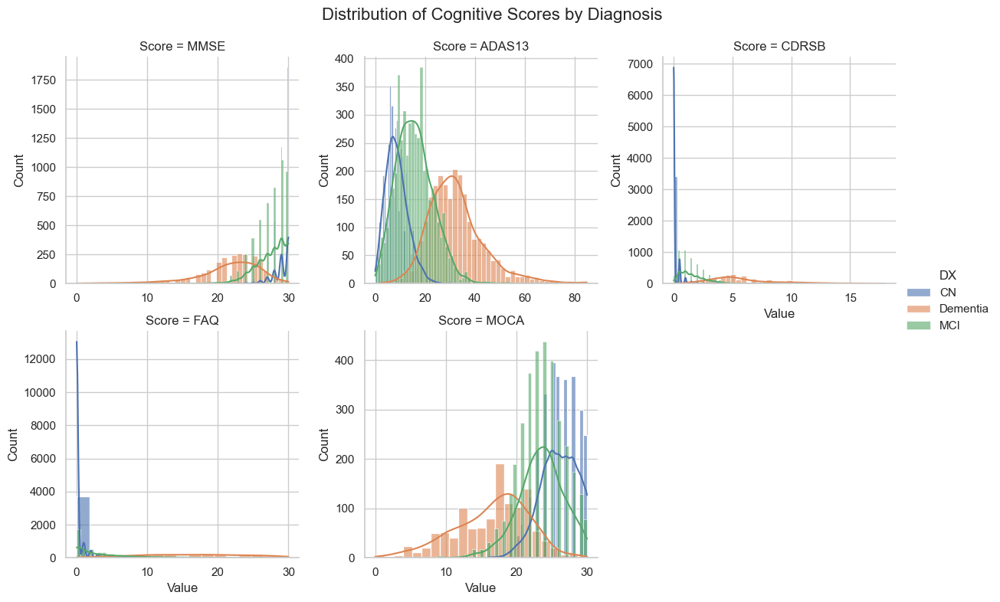

In [36]:
# Select columns
score_columns = ['MMSE', 'ADAS13', 'CDRSB', 'FAQ', 'MOCA']

# Melt the DataFrame for FacetGrid
df_melted = Adni.melt(id_vars='DX', value_vars=score_columns, var_name='Score', value_name='Value')

# Create the FacetGrid
g = sns.FacetGrid(df_melted, col='Score', col_wrap=3, height=4, hue='DX', sharex=False, sharey=False)
g.map(sns.histplot, 'Value', kde=True, alpha=0.6).add_legend()

# Add titles and layout
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Distribution of Cognitive Scores by Diagnosis', fontsize=16)
plt.show()

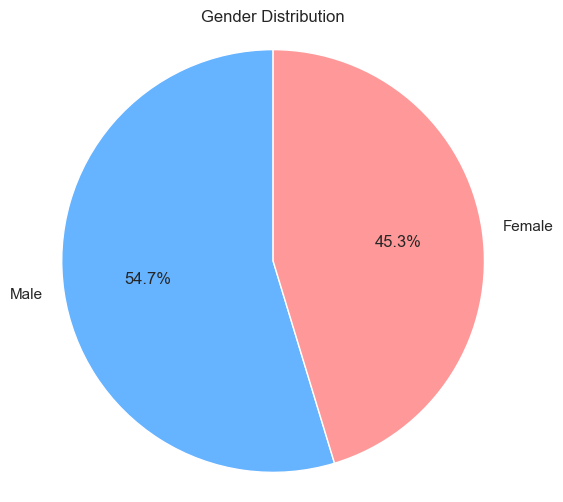

In [11]:
#Gender distribution
gender_counts = Adni_filtered['PTGENDER'].value_counts()

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff9999'])
plt.title('Gender Distribution')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular
plt.show()

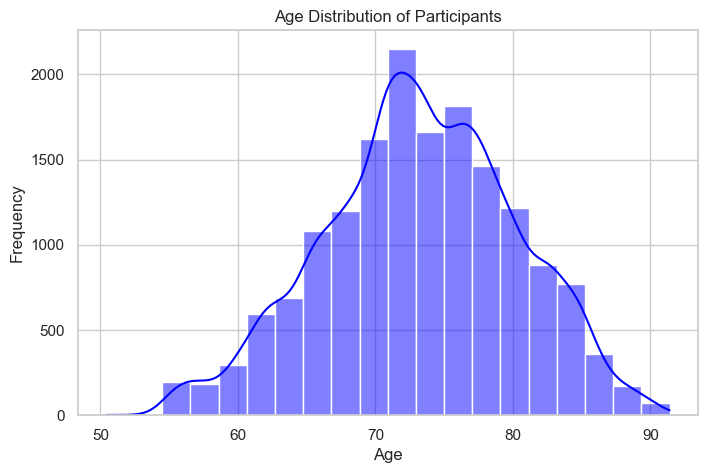

In [29]:
# Age histogram
plt.figure(figsize=(8, 5))
sns.histplot(Adni_filtered['AGE'], bins=20, kde=True, color='blue')
plt.title('Age Distribution of Participants')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


C:\Users\home\AppData\Local\Temp\ipykernel_15076\2651585565.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=Adni_filtered, x='PTRACCAT', palette='pastel')


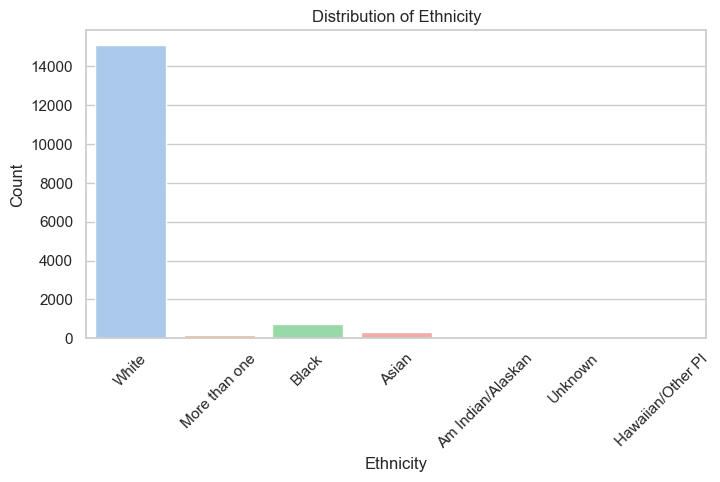

In [15]:
# Ethnicity countplot
plt.figure(figsize=(8, 4))
sns.countplot(data=Adni_filtered, x='PTRACCAT', palette='pastel')
plt.title('Distribution of Ethnicity')
plt.xlabel('Ethnicity')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

C:\Users\home\AppData\Local\Temp\ipykernel_15076\1592204918.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=Adni, x='DX', y='AGE', palette='Set2')


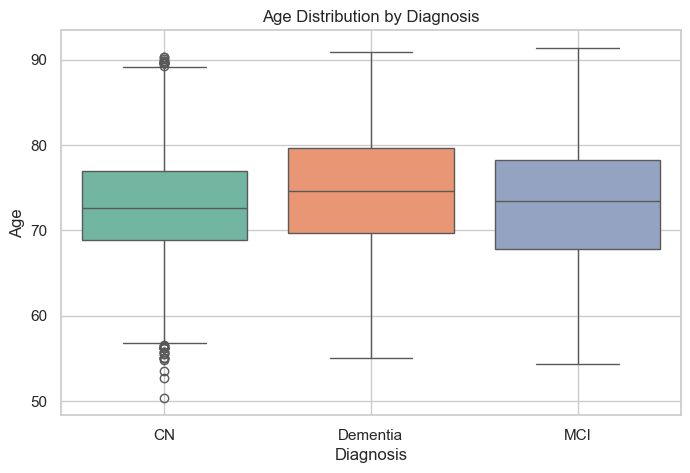

In [26]:
# Age vs Diagnosis (Boxplot)
plt.figure(figsize=(8, 5))
sns.boxplot(data=Adni, x='DX', y='AGE', palette='Set2')
plt.title('Age Distribution by Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Age')
plt.grid(True)
plt.show()

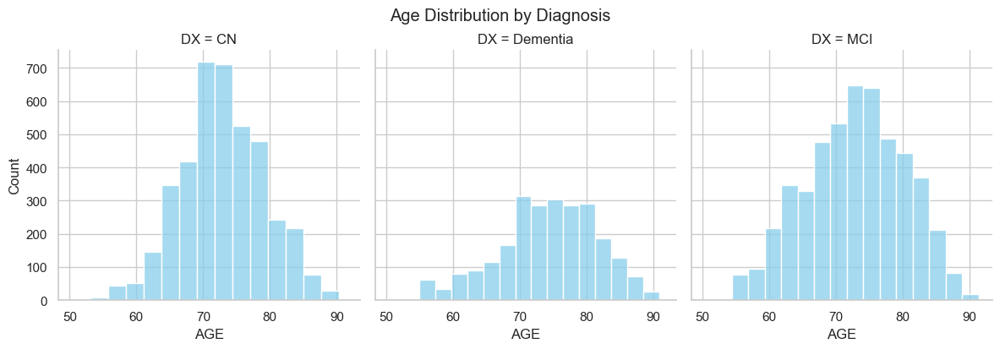

In [27]:
g = sns.FacetGrid(Adni, col='DX', col_wrap=3, height=4, sharex=True)
g.map(sns.histplot, 'AGE', bins=15, color='skyblue')
g.fig.suptitle('Age Distribution by Diagnosis', y=1.03)
plt.show()


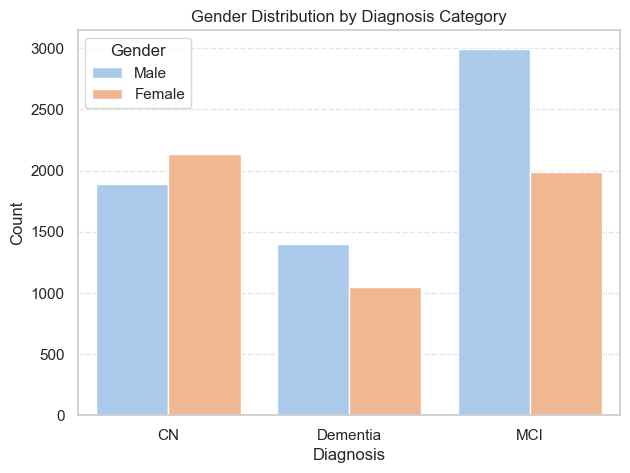

In [30]:
plt.figure(figsize=(7, 5))
sns.countplot(data=Adni, x='DX', hue='PTGENDER', palette='pastel')
plt.title('Gender Distribution by Diagnosis Category')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()


In [28]:
Adni_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16421 entries, 2 to 5214
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PTGENDER                  16421 non-null  object 
 1   AGE                       16412 non-null  float64
 2   PTEDUCAT                  16421 non-null  int64  
 3   PTETHCAT                  16421 non-null  object 
 4   PTRACCAT                  16421 non-null  object 
 5   PTMARRY                   16420 non-null  object 
 6   APOE4                     16056 non-null  float64
 7   DX_bl                     16410 non-null  object 
 8   DX                        11458 non-null  object 
 9   VISCODE                   16421 non-null  object 
 10  Month_bl                  16421 non-null  float64
 11  Month                     16421 non-null  int64  
 12  MMSE                      11469 non-null  float64
 13  MMSE_bl                   16419 non-null  float64
 14  CDRSB       

# 2.3 Correlation Analysis: Upper Triangle Heatmap 

This allows easier interpretation of strong relationships between variables and helps identify multicollinearity without it being overwhelming. 

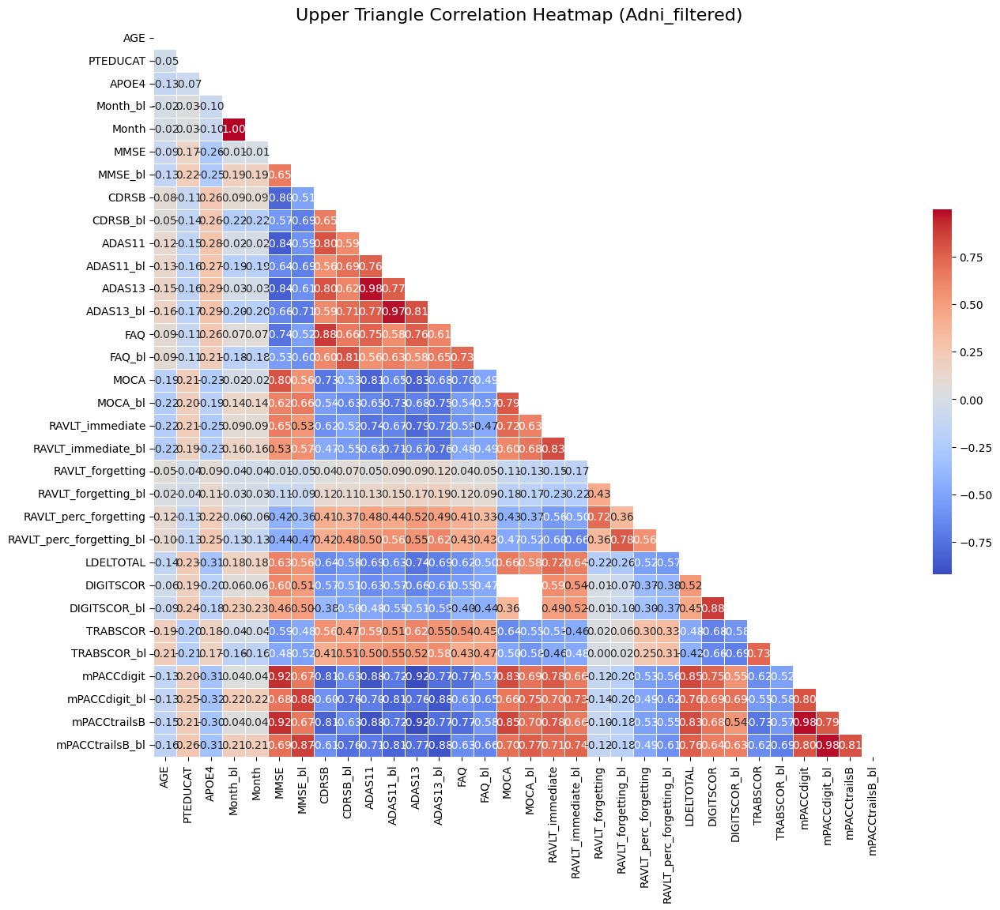

In [104]:
#showing Potential multicollinearity risks
numeric_df = Adni_filtered.select_dtypes(include=[np.number])

#Compute correlation matrix
corr = numeric_df.corr()

#Generate a mask for the lower triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

#Set up the plot
plt.figure(figsize=(16, 12))
sns.heatmap(
    corr, 
    mask=mask, 
    cmap='coolwarm', 
    annot=True, 
    fmt=".2f", 
    square=True, 
    linewidths=0.5, 
    cbar_kws={"shrink": 0.5}
)
plt.title('Upper Triangle Correlation Heatmap (Adni_filtered)', fontsize=16)
plt.show()

The heatmap below shows the pairwise **Pearson correlation coefficients** between numerical features in the `Adni_filtered` dataset. 
Red indicates positive correlation; blue indicates negative. Values range from **-1 (perfect negative)** to **+1 (perfect positive)**.

- Notable Observations

Strong Positive Correlations (Red Hot Zones)
- **`MMSE` vs `MOCA`** ≈ **+0.73**  
  → Both are general cognitive assessments. High scores in one usually predict high scores in the other.

- **`ADAS11` and `ADAS13`**: **> +0.80**  
  → These two versions of the Alzheimer’s Disease Assessment Scale are closely related.

- **`CDRSB` vs `FAQ`** ≈ **+0.77**  
  → Functional impairment (FAQ) increases with severity of dementia (CDR-Sum of Boxes).

- **`MPACCTRAILSB` vs `DIGITSCOR`, `MOCA`, `MMSE`**: **+0.70–0.80**  
  → The composite cognitive score is strongly aligned with memory and processing tasks.

Strong Negative Correlations (Blue Zones)
- **`MMSE` vs `CDRSB`**: **-0.77**  
  → As dementia severity increases (`CDRSB`), general cognitive score (`MMSE`) declines.

- **`ADAS13` vs `MMSE`**: **-0.79**  
  → Higher ADAS = worse cognitive function; higher MMSE = better. So this inverse relationship is expected.

- **`MOCA` vs `CDRSB`**: **-0.70+**  
  → Again, higher dementia scores are associated with lower MOCA scores.

- **`RAVLT Percent Forgetting` vs `MOCA`, `MMSE`, `DIGITSCOR`**: ~**-0.4 to -0.5**  
  → Higher forgetting is linked to lower cognitive performance.

Mild or Weak Correlations
- `AGE`, `EDUCATION`, and `APOE4` show **low-to-moderate correlation** with most scores (|r| < 0.2)
  - Suggests that while important, these features don’t directly track with cognitive test scores.
  



In [105]:
Adni_filtered.shape

(16421, 45)

In [106]:
Adni_filtered.dtypes

PTGENDER                     object
AGE                         float64
PTEDUCAT                      int64
PTETHCAT                     object
PTRACCAT                     object
PTMARRY                      object
APOE4                       float64
DX_bl                        object
DX                           object
VISCODE                      object
Month_bl                    float64
Month                         int64
MMSE                        float64
MMSE_bl                     float64
CDRSB                       float64
CDRSB_bl                    float64
ADAS11                      float64
ADAS11_bl                   float64
ADAS13                      float64
ADAS13_bl                   float64
FAQ                         float64
FAQ_bl                      float64
MOCA                        float64
MOCA_bl                     float64
RAVLT_immediate             float64
RAVLT_immediate_bl          float64
RAVLT_forgetting            float64
RAVLT_forgetting_bl         

# 3.0 Data Preparation

This step involves cleaning and formating the data. The following Data preparation steps where adopted. 

- Filter with baseline why? There are lots of duplicates in the data sets as it is a long data and each rows contains different records for patients with same RID
- Dropping columns
- Rounding and Type Normalisation
- Handling Negative Values
- Data mapping of observations relevant to the business case for proper representation.
- Converting Data types.
- Renaming columns headers



# 3.1 Filtering the Dataset with Baseline.

The Dataset intitally had 111 columns but has been trimmed down to 45 columns. During the data exploration, it was discovered that the data is a long data (new records for each patients visit with thesame primary key).

We therefore have to filter using the baseline. why? This will trim down the datasets and leave us with values that were taken at the first visit. 

In [5]:
#Filtering the datasets using VISCODE and baseline as the criteria. 
Adni_baseline = Adni_filtered = Adni_filtered[Adni_filtered['VISCODE'].str.lower() == 'bl']
Adni_baseline

,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX_bl,DX,VISCODE,...,mPACCdigit,mPACCdigit_bl,mPACCtrailsB,mPACCtrailsB_bl,ABETA,ABETA_bl,TAU,TAU_bl,PTAU,PTAU_bl
RID,,,,,,,,,,,,,,,,,,,,,
2,Male,74.3,16,Not Hisp/Latino,White,Married,0.0,CN,CN,bl,...,-4.310280,-4.310280,-4.114430,-4.114430,NaN,NaN,NaN,NaN,NaN,NaN
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,bl,...,-16.244900,-16.244900,-15.829900,-15.829900,741.5,741.5,239.7,239.7,22.83,22.83
4,Male,67.5,10,Hisp/Latino,White,Married,0.0,LMCI,MCI,bl,...,-8.421500,-8.421500,-9.449350,-9.449350,1501.0,1501.0,153.1,153.1,13.29,13.29
5,Male,73.7,16,Not Hisp/Latino,White,Married,0.0,CN,CN,bl,...,-1.888680,-1.888680,-1.565830,-1.565830,547.3,547.3,337.0,337.0,33.43,33.43
6,Female,80.4,13,Not Hisp/Latino,White,Married,0.0,LMCI,MCI,bl,...,-10.141700,-10.141700,-10.910900,-10.910900,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Male,61.4,12,Not Hisp/Latino,White,Married,NaN,LMCI,MCI,bl,...,-10.780300,-10.780300,-11.308700,-11.308700,NaN,NaN,NaN,NaN,NaN,NaN
7049,Female,64.6,12,Hisp/Latino,Unknown,Widowed,NaN,LMCI,MCI,bl,...,-9.659400,-9.659400,-7.517550,-7.517550,NaN,NaN,NaN,NaN,NaN,NaN
7117,Female,68.9,18,Not Hisp/Latino,Black,Never married,NaN,EMCI,MCI,bl,...,2.742450,2.742450,2.540260,2.540260,NaN,NaN,NaN,NaN,NaN,NaN


# 3.2 Dropping Columns

In [6]:
#Since the Data was filtered with baseline, The Adni_baseline data will contain multiple inputs of the variables.
#It is important to keep only one of variables as we cant use both. 
# Proceeding to drop baseline duplicates. 
Adni_baseline = Adni_baseline.drop(columns=['DX_bl','Month_bl', 'MMSE_bl', 'MOCA_bl', 'CDRSB_bl',
                                            'ADAS11_bl','ADAS13_bl','FAQ_bl','RAVLT_immediate_bl',
                                            'RAVLT_forgetting_bl','RAVLT_perc_forgetting_bl','DIGITSCOR_bl','TRABSCOR_bl',
                                            'mPACCdigit_bl','mPACCtrailsB_bl','ABETA_bl','TAU_bl','PTAU_bl'
                                            ]) 	


# 3.3 Rounding & Type Normalisation

In [7]:
#Rounding up the age to whole number. Age should not be expressed in decimal points. 

# Round up using NumPy's ceil
Adni_baseline['AGE'] = np.ceil(Adni_baseline['AGE'])

Adni_baseline

,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX,VISCODE,Month,...,RAVLT_forgetting,RAVLT_perc_forgetting,LDELTOTAL,DIGITSCOR,TRABSCOR,mPACCdigit,mPACCtrailsB,ABETA,TAU,PTAU
RID,,,,,,,,,,,,,,,,,,,,,
2,Male,75.0,16,Not Hisp/Latino,White,Married,0.0,CN,bl,0,...,6.0,54.5455,10.0,34.0,112.0,-4.310280,-4.114430,NaN,NaN,NaN
3,Male,82.0,18,Not Hisp/Latino,White,Married,1.0,Dementia,bl,0,...,4.0,100.0000,2.0,25.0,148.0,-16.244900,-15.829900,741.5,239.7,22.83
4,Male,68.0,10,Hisp/Latino,White,Married,0.0,MCI,bl,0,...,4.0,36.3636,4.0,25.0,271.0,-8.421500,-9.449350,1501.0,153.1,13.29
5,Male,74.0,16,Not Hisp/Latino,White,Married,0.0,CN,bl,0,...,4.0,44.4444,12.0,38.0,90.0,-1.888680,-1.565830,547.3,337.0,33.43
6,Female,81.0,13,Not Hisp/Latino,White,Married,0.0,MCI,bl,0,...,5.0,83.3333,3.0,34.0,168.0,-10.141700,-10.910900,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Male,62.0,12,Not Hisp/Latino,White,Married,NaN,MCI,bl,0,...,6.0,85.7143,1.0,NaN,290.0,-10.780300,-11.308700,NaN,NaN,NaN
7049,Female,65.0,12,Hisp/Latino,Unknown,Widowed,NaN,MCI,bl,0,...,6.0,75.0000,3.0,NaN,84.0,-9.659400,-7.517550,NaN,NaN,NaN
7117,Female,69.0,18,Not Hisp/Latino,Black,Never married,NaN,MCI,bl,0,...,5.0,38.4615,16.0,NaN,61.0,2.742450,2.540260,NaN,NaN,NaN


In [8]:
#Most of our numeric datasets are floats and it is advicable to round up to 2 decimal points
Adni_baseline = Adni_baseline.round(2)

# 3.4 Handling Negative Values

In [9]:
Adni_baseline.iloc[:, -15:]

,ADAS11,ADAS13,FAQ,MOCA,RAVLT_immediate,RAVLT_forgetting,RAVLT_perc_forgetting,LDELTOTAL,DIGITSCOR,TRABSCOR,mPACCdigit,mPACCtrailsB,ABETA,TAU,PTAU
RID,,,,,,,,,,,,,,,
2,10.67,18.67,0.0,NaN,44.0,6.0,54.55,10.0,34.0,112.0,-4.31,-4.11,NaN,NaN,NaN
3,22.00,31.00,10.0,NaN,22.0,4.0,100.00,2.0,25.0,148.0,-16.24,-15.83,741.5,239.7,22.83
4,14.33,21.33,0.0,NaN,37.0,4.0,36.36,4.0,25.0,271.0,-8.42,-9.45,1501.0,153.1,13.29
5,8.67,14.67,0.0,NaN,37.0,4.0,44.44,12.0,38.0,90.0,-1.89,-1.57,547.3,337.0,33.43
6,18.67,25.67,0.0,NaN,30.0,5.0,83.33,3.0,34.0,168.0,-10.14,-10.91,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,20.33,31.33,15.0,19.0,22.0,6.0,85.71,1.0,NaN,290.0,-10.78,-11.31,NaN,NaN,NaN
7049,16.33,23.33,0.0,23.0,31.0,6.0,75.00,3.0,NaN,84.0,-9.66,-7.52,NaN,NaN,NaN
7117,5.00,7.00,0.0,26.0,45.0,5.0,38.46,16.0,NaN,61.0,2.74,2.54,NaN,NaN,NaN


In [10]:
#Data Auditting; To confirm if more columns have negative values. 
(Adni_baseline.select_dtypes(include='number') < 0).any()

AGE                      False
PTEDUCAT                 False
APOE4                    False
Month                    False
MMSE                     False
CDRSB                    False
ADAS11                   False
ADAS13                   False
FAQ                      False
MOCA                     False
RAVLT_immediate          False
RAVLT_forgetting          True
RAVLT_perc_forgetting     True
LDELTOTAL                False
DIGITSCOR                False
TRABSCOR                 False
mPACCdigit                True
mPACCtrailsB              True
dtype: bool

It was observed that 4 columns has negative values. When it comes to clinical data which is very sensitive, assumptions cannot be made as to why a column has negative values. 
- RAVLT_forgetting & RAVLT_perc_forgetting:- Rey's Auditory Verbal Learning Test (RAVLT) (Rey, 1964) is a powerful neuropsychological tool that is used for assessing episodic memory by providing scores for evaluating different aspects of memory.
These metrics represent the amount or percentage of forgetting between immediate recall and delayed recall.
Negative values are not clinically valid, as they suggest the participant recalled more words after a delay than during the learning phase. This is a rare or biologically inconsistent event.
As the root cause is unknown and assumptions cannot be made in clinical contexts, these values were treated conservatively.

- mPACCdigit & mPACCtrailsB:- These are standardized composite cognitive scores, expressed in z-score format.
Negative values are expected and valid, indicating below-average cognitive performance relative to a normative group.

- (Source: https://www.sciencedirect.com/science/article/pii/S2213158216302480?via%3Dihub)
- (Source: https://jamanetwork.com/journals/jamaneurology/fullarticle/1875831)


In [11]:
# Filter rows where either RAVLT_FORGETTING or RAVLT_PERC_FORGETTING is negative
ravlt_negatives = Adni_baseline[
    (Adni_baseline['RAVLT_forgetting'] < 0) |
    (Adni_baseline['RAVLT_perc_forgetting'] < 0)
]

# Showing columns of interest
columns_to_show = ['DX','RAVLT_forgetting','RAVLT_perc_forgetting']
display(ravlt_negatives[columns_to_show])

,DX,RAVLT_forgetting,RAVLT_perc_forgetting
RID,,,
97,CN,-1.0,-7.14
120,CN,-5.0,-100.00
123,CN,-2.0,-20.00
284,MCI,-1.0,NaN
319,CN,-2.0,-20.00
352,CN,-1.0,-7.69
393,MCI,-2.0,-25.00
522,CN,-1.0,-7.14
717,CN,-2.0,-18.18


In [12]:
# Changing negative values in the columns to None 
Adni_baseline.loc[Adni_baseline['RAVLT_forgetting'] < 0, 'RAVLT_forgetting'] = None
Adni_baseline.loc[Adni_baseline['RAVLT_perc_forgetting'] < 0, 'RAVLT_perc_forgetting'] = None

In [13]:
# Count of NaNs in the cleaned columns
Adni_baseline[['RAVLT_forgetting','RAVLT_perc_forgetting']].isna().sum()

RAVLT_forgetting         62
RAVLT_perc_forgetting    66
dtype: int64

In [14]:
#Verifying if it worked
Adni_baseline[
    Adni_baseline[['RAVLT_forgetting','RAVLT_perc_forgetting']].isna().any(axis=1)
][['DX','RAVLT_forgetting','RAVLT_perc_forgetting']].head()

,DX,RAVLT_forgetting,RAVLT_perc_forgetting
RID,,,
97,CN,NaN,NaN
120,CN,NaN,NaN
123,CN,NaN,NaN
284,MCI,NaN,NaN
319,CN,NaN,NaN


# 3.5 Data Mapping

In [19]:
#Understanding the Gender class
Adni_baseline['PTGENDER'].value_counts()

PTGENDER
Male      1273
Female    1157
Name: count, dtype: int64

In [20]:
#Showing the values of the Education. 
Adni_baseline['PTEDUCAT'].value_counts()

#With the Education the number highlights the years of Education of each patients with maximum being 20 and minimum 4.

PTEDUCAT
16    597
18    475
20    319
12    283
14    271
17    110
19    109
15     99
13     97
10     23
11     17
8      12
9       7
7       6
6       3
4       2
Name: count, dtype: int64

In [21]:
#Showing the distriubution of Ethnicity
Adni_baseline['PTETHCAT'].value_counts()

PTETHCAT
Not Hisp/Latino    2302
Hisp/Latino         116
Unknown              12
Name: count, dtype: int64

In [22]:
#Showing the distribution of race
Adni_baseline['PTRACCAT'].value_counts()

PTRACCAT
White                2143
Black                 179
Asian                  58
More than one          31
Unknown                12
Am Indian/Alaskan       5
Hawaiian/Other PI       2
Name: count, dtype: int64

In [23]:
#Showing the marital status of patients
Adni_baseline['PTMARRY'].value_counts()

PTMARRY
Married          1824
Widowed           269
Divorced          228
Never married      99
Unknown             9
Name: count, dtype: int64

Mapping helps us to replace this informations with readable characters for easier understanding.

- The ethnicity has three groups, as shown above. Majority of the groups are Not Hisp/Latino and Hisp/Latino and the last group unknown. 
The unknown will be replaced with the mode of the distribution. 
- The Race column has 7 groups and will be renamed appropriately.  
- The marry status of patients, it is also important to use acceptable names. 

In [15]:
#Renaming the observations appropriately 
Adni_baseline['PTETHCAT'] = Adni_baseline['PTETHCAT'].replace({'Not Hisp/Latino': 'Not Hispanic','Hisp/Latino': 'Hispanic'})
Adni_baseline['PTRACCAT'] = Adni_baseline['PTRACCAT'].replace({'More than one': 'Multiracial','Am Indian/Alaskan': 'Indian','Hawaiian/Other PI': 'Hawaiian'})
Adni_baseline['PTMARRY'] = Adni_baseline['PTMARRY'].replace({'Never married': 'Single'})
Adni_baseline['DX'] = Adni_baseline['DX'].replace('Dementia', 'AD')

#NOTE: Used .replace because .map can turn every unmapped values into missing values.

In [16]:
#Replacing the Unknowns in PTETHCAT of the columns with mode
mode_value = Adni_baseline.loc[Adni_baseline['PTETHCAT'] != 'Unknown', 'PTETHCAT'].mode()[0]
Adni_baseline['PTETHCAT'] = Adni_baseline['PTETHCAT'].replace('Unknown', mode_value)

In [17]:
#Replacing the Unknowns in PTRACCAT of the columns with mode
mode_value = Adni_baseline.loc[Adni_baseline['PTRACCAT'] != 'Unknown', 'PTRACCAT'].mode()[0]
Adni_baseline['PTRACCAT'] = Adni_baseline['PTRACCAT'].replace('Unknown', mode_value)

In [18]:
#Replacing the Unknowns in PTMARRY of the columns with mode
mode_value = Adni_baseline.loc[Adni_baseline['PTMARRY'] != 'Unknown', 'PTMARRY'].mode()[0]
Adni_baseline['PTMARRY'] = Adni_baseline['PTMARRY'].replace('Unknown', mode_value)

# 3.6 Converting Data Types

In [28]:
Adni_baseline.dtypes

PTGENDER                  object
AGE                      float64
PTEDUCAT                   int64
PTETHCAT                  object
PTRACCAT                  object
PTMARRY                   object
APOE4                    float64
DX                        object
VISCODE                   object
Month                      int64
MMSE                     float64
CDRSB                    float64
ADAS11                   float64
ADAS13                   float64
FAQ                      float64
MOCA                     float64
RAVLT_immediate          float64
RAVLT_forgetting         float64
RAVLT_perc_forgetting    float64
LDELTOTAL                float64
DIGITSCOR                float64
TRABSCOR                 float64
mPACCdigit               float64
mPACCtrailsB             float64
ABETA                     object
TAU                       object
PTAU                      object
dtype: object

- It is noticeable that most of the data types are in the right format. However, it is incorrect for our CSF biomarker group to be an object type when ABETA, TAU, and PTAU are numeric variables. 
While trying to convert ABETA to float data type, we get a (ValueError: could not convert string to float: '>1700').
- Which could be as a result of error in data input or during data merging. Leaving this input in our model can cause issues for the model.
- We proceed to fix these numbers by replacing with the nearest cut-off instead of dropping them and losing good values.

In [19]:
# Observing the object type but numeric columns
biomarker_cols = ['ABETA', 'TAU', 'PTAU']

# Loop through each and find values recorded as strings with '>' or '<'
for col in biomarker_cols:
    if col in Adni_baseline.columns:
        mask = Adni_baseline[col].astype(str).str.contains(r'[<>]')
        flagged = Adni_baseline[mask]
        print(f"Values in '{col}' recorded with '>' or '<':")
        display(flagged[['DX', col]].head())
    else:
        print(f"Column '{col}' not found in the DataFrame.")

Values in 'ABETA' recorded with '>' or '<':


,DX,ABETA
RID,,
8,CN,>1700
19,CN,>1700
22,CN,>1700
31,CN,>1700
95,CN,>1700


Values in 'TAU' recorded with '>' or '<':


,DX,TAU
RID,,
590,MCI,>1300
691,AD,<80
692,CN,<80
876,CN,<80
1276,CN,<80


Values in 'PTAU' recorded with '>' or '<':


,DX,PTAU
RID,,
590,MCI,>120
691,AD,<8
692,CN,<8
876,CN,<8
1276,CN,<8


In [20]:
#Replacing the string values with numbers above the <> threshold. 
anomaly_map= {
    'ABETA': {'<200': 199, '>1700': 1701},
    'TAU':   {'<80': 79, '>1300': 1301},
    'PTAU':  {'<8': 7, '>120': 121}
}

for col, replacements in anomaly_map.items():
    if col in Adni_baseline.columns:
        for original, new_val in replacements.items():
            Adni_baseline.loc[Adni_baseline[col] == original, col] = new_val

In [21]:
#Converting the object datatype to float
# Convert each column to float
for col in biomarker_cols:
    if col in Adni_baseline.columns:
        Adni_baseline[col] = pd.to_numeric(Adni_baseline[col], errors='coerce')

Adni_baseline[biomarker_cols].dtypes

ABETA    float64
TAU      float64
PTAU     float64
dtype: object

# 3.7 Renaming Columns

In [22]:
#Renaming some of the columns properly
#Renaming columns properly
Adni_baseline.rename(columns={'DX': 'Diagnosis',
    'PTGENDER': 'Gender',
    'AGE': 'Age',
    'PTEDUCAT': 'Education_Years',
    'PTETHCAT': 'Ethnicity',
    'PTRACCAT': 'Race',
    'PTMARRY': 'Marital_Status',
    'VISCODE': 'Visit_Code',
    'MONTH': 'Month_baseline',
    'APOE4': 'Apoe4_Count',

    # Cognitive tests
    'MMSE': 'Mmse',
    'MOCA': 'Moca',
    'CDRSB': 'Cdr_Sum_Boxes',
    'ADAS11': 'Adas_11',
    'ADAS13': 'Adas_13',
    'FAQ': 'Faq',
    'RAVLT_immediate': 'Ravlt_Immediate',
    'RAVLT_forgetting': 'Ravlt_Forgetting',
    'RAVLT_perc_forgetting': 'Ravlt_Percent_Forgetting',
                

    # Memory/Attention
    'LDELTOTAL': 'Logical_Memory_Total',
    'DIGITSCOR': 'Digit_Symbol_Substitution',
    'TRABSCOR': 'Trails_B',

    # Composite scores
    'mPACCdigit': 'Mpacc_Digit',
    'mPACCtrailsB': 'Mpacc_TrailsB',

    # CSF biomarkers
    'ABETA': 'Abeta_pg_ml',
    'TAU': 'Tau_pg_ml',
    'PTAU': 'Ptau_pg_ml',
     }, inplace=True)

In [23]:
#Renaming the RID index. 
Adni_baseline.index.name = 'Participant_ID'

# 3.8 Missing Values

In [24]:
#Checking missing values
Adni_baseline.isnull().sum()

Gender                          0
Age                             4
Education_Years                 0
Ethnicity                       0
Race                            0
Marital_Status                  1
Apoe4_Count                   217
Diagnosis                      21
Visit_Code                      0
Month                           0
Mmse                            1
Cdr_Sum_Boxes                   0
Adas_11                        13
Adas_13                        25
Faq                            31
Moca                          857
Ravlt_Immediate                11
Ravlt_Forgetting               62
Ravlt_Percent_Forgetting       66
Logical_Memory_Total            4
Digit_Symbol_Substitution    1616
Trails_B                       61
Mpacc_Digit                     3
Mpacc_TrailsB                   3
Abeta_pg_ml                  1215
Tau_pg_ml                    1215
Ptau_pg_ml                   1215
dtype: int64

In [25]:
# We have minor missing values, Moderate missing values and major missing values 
#Inputting minor missing values. 
Adni_baseline['Age'].fillna(Adni_baseline['Age'].median(), inplace=True)
Adni_baseline['Marital_Status'].fillna(Adni_baseline['Marital_Status'].mode()[0], inplace=True)
Adni_baseline['Mmse'].fillna(Adni_baseline['Mmse'].mean(), inplace=True)
Adni_baseline['Faq'].fillna(Adni_baseline['Faq'].mean(), inplace=True)
Adni_baseline['Adas_11'].fillna(Adni_baseline['Adas_11'].mean(), inplace=True)
Adni_baseline['Adas_13'].fillna(Adni_baseline['Adas_13'].mean(), inplace=True)
Adni_baseline['Ravlt_Immediate'].fillna(Adni_baseline['Ravlt_Immediate'].mean(), inplace=True)
Adni_baseline['Logical_Memory_Total'].fillna(Adni_baseline['Logical_Memory_Total'].mean(), inplace=True)
Adni_baseline['Trails_B'].fillna(Adni_baseline['Trails_B'].mean(), inplace=True)


C:\Users\home\AppData\Local\Temp\ipykernel_4260\3769705872.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Adni_baseline['Age'].fillna(Adni_baseline['Age'].median(), inplace=True)
C:\Users\home\AppData\Local\Temp\ipykernel_4260\3769705872.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves

In [26]:
#We have derived columns, it is not safe to just input them with KNN or mean. 
#Inputting haphazardly can cause issues for our models and we end up with a biased model. 
#Columns like mpacc_digit and mpacc_trailsB cannot 
mask = Adni_baseline['Ravlt_Immediate'].notnull() & Adni_baseline['Ravlt_Forgetting'].notnull()
Adni_baseline.loc[mask, 'Ravlt_Percent_Forgetting'] = (
    Adni_baseline.loc[mask, 'Ravlt_Forgetting'] / Adni_baseline.loc[mask, 'Ravlt_Immediate']
) * 100

In [47]:
#Remember we left values in RAVLT forgetting and percentage as None.
#This are derived values and since its can be calculated, we ignore. 

In [27]:
#Impute with mode (most common allele count). It is very important.
Adni_baseline['Apoe4_Count'] = Adni_baseline['Apoe4_Count'].fillna(Adni_baseline['Apoe4_Count'].mode()[0])

#add a missing flag for transparency
Adni_baseline['Apoe4_missing'] = Adni_baseline['Apoe4_Count'].isnull().astype(int)


In [28]:
#Thou moca and mmse has 0.8 multicollinearity, moca is quite important in early detection.
#857 values cannot be dropped. 
#Impute MOCA with group-wise median
Adni_baseline['Moca'] = Adni_baseline.groupby('Diagnosis')['Moca'].transform(
    lambda x: x.fillna(x.median())
)

#Track imputed values
Adni_baseline['Moca_missing'] = Adni_baseline['Moca'].isnull().astype(int)

In [29]:
#Dropping digit symbol subsititution as over 50% of data is missing. 
Adni_baseline.drop(columns=['Digit_Symbol_Substitution'], inplace=True)

In [30]:
# Add missing flags for the biomarkers. 
Adni_baseline['Abeta_missing'] = Adni_baseline['Abeta_pg_ml'].isnull().astype(int)
Adni_baseline['Tau_missing'] = Adni_baseline['Tau_pg_ml'].isnull().astype(int)
Adni_baseline['Ptau_missing'] = Adni_baseline['Ptau_pg_ml'].isnull().astype(int)

#NOTE: Keep them as-is (NaN), or drop them in baseline model and test them later in extended model

In [31]:
#dropping moderate rows that are missing... 
Adni_baseline = Adni_baseline.dropna(subset=['Diagnosis', 'Moca', 'Mpacc_Digit','Mpacc_TrailsB',
                                             'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting'])

In [32]:
Adni_baseline.isnull().sum()

Gender                         0
Age                            0
Education_Years                0
Ethnicity                      0
Race                           0
Marital_Status                 0
Apoe4_Count                    0
Diagnosis                      0
Visit_Code                     0
Month                          0
Mmse                           0
Cdr_Sum_Boxes                  0
Adas_11                        0
Adas_13                        0
Faq                            0
Moca                           0
Ravlt_Immediate                0
Ravlt_Forgetting               0
Ravlt_Percent_Forgetting       0
Logical_Memory_Total           0
Trails_B                       0
Mpacc_Digit                    0
Mpacc_TrailsB                  0
Abeta_pg_ml                 1166
Tau_pg_ml                   1166
Ptau_pg_ml                  1166
Apoe4_missing                  0
Moca_missing                   0
Abeta_missing                  0
Tau_missing                    0
Ptau_missi

In [141]:
Adni_baseline.shape

(2352, 31)

In [55]:
#Visualisation
#for flag in missing_flags:
    #plt.figure(figsize=(6, 4))
    #sns.countplot(data=Adni_baseline, x='Diagnosis', hue=flag)
    #plt.title(f"{flag} Distribution by Diagnosis")
    #plt.ylabel('Count')
    #plt.xlabel('Diagnosis')
    #plt.legend(title='Missing')
    #plt.tight_layout()
    #plt.show()

In [33]:
#Saving the datasets 
Adni_cleaned = Adni_baseline.to_csv('Adni_cleaned.csv', index=True)

 Handling Key Missing Data

- **APOE4 Count (genetic)**: Imputed using mode; low missingness. Safe to use.
- **MOCA (cognitive)**: Critical variable. Imputed with diagnosis-specific medians.
- **CSF Biomarkers (ABETA, TAU, PTAU)**: Left as `NaN`. Tracked with missing flags for optional model usage.
- **Core cognitive variables** (e.g., MMSE, FAQ, ADAS) were imputed using mean.
- **Derived scores** like `RAVLT_Percent_Forgetting` were recalculated when their components were available but was later dropped because recalculation didnt work.
- **Optional or highly-missing columns** were flagged using binary indicators (e.g., `Moca_missing`) or dropped if not critical.


# 4.0 Data Modelling

In [34]:
#Loading the cleaned dataset
Adni_cleaned = pd.read_csv('Adni_cleaned.csv', index_col=0)
Adni_cleaned.head()

,Gender,Age,Education_Years,Ethnicity,Race,Marital_Status,Apoe4_Count,Diagnosis,Visit_Code,Month,...,Mpacc_Digit,Mpacc_TrailsB,Abeta_pg_ml,Tau_pg_ml,Ptau_pg_ml,Apoe4_missing,Moca_missing,Abeta_missing,Tau_missing,Ptau_missing
Participant_ID,,,,,,,,,,,,,,,,,,,,,
2,Male,75.0,16,Not Hispanic,White,Married,0.0,CN,bl,0,...,-4.31,-4.11,NaN,NaN,NaN,0,0,1,1,1
3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,bl,0,...,-16.24,-15.83,741.5,239.7,22.83,0,0,0,0,0
4,Male,68.0,10,Hispanic,White,Married,0.0,MCI,bl,0,...,-8.42,-9.45,1501.0,153.1,13.29,0,0,0,0,0
5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,bl,0,...,-1.89,-1.57,547.3,337.0,33.43,0,0,0,0,0
6,Female,81.0,13,Not Hispanic,White,Married,0.0,MCI,bl,0,...,-10.14,-10.91,NaN,NaN,NaN,0,0,1,1,1


<Axes: title={'center': 'Class Distribution (%)'}, xlabel='Diagnosis'>

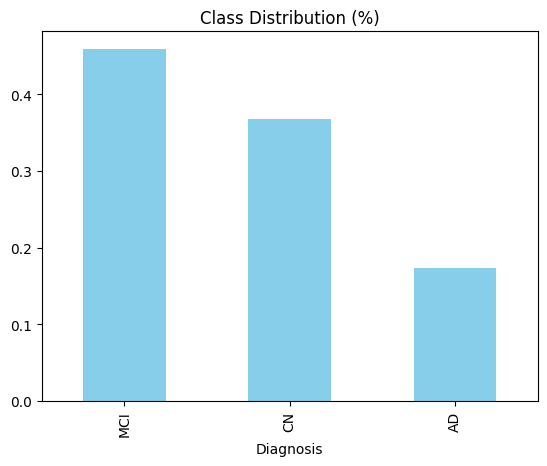

In [35]:
#Checking for class imbalance.
Adni_cleaned['Diagnosis'].value_counts(normalize=True).plot(kind='bar', color='skyblue', title='Class Distribution (%)')

# 4.1 Feature Engineering 

In [36]:
#Feature Engineering
#Encoding categorical variables
categoricals = ['Gender', 'Ethnicity', 'Race', 'Marital_Status']
Adni_cleaned = pd.get_dummies(Adni_cleaned, columns=categoricals, drop_first=True)

In [37]:
#Dropping visitcode as it is  not important 
Adni_cleaned.drop(columns=['Visit_Code'], inplace=True)

In [38]:
#Filling all the NaNs with 0 to avoid errors
Adni_cleaned = Adni_cleaned.fillna(0)

In [39]:
Adni_cleaned[['Gender_Male','Ethnicity_Not Hispanic', 'Race_Black', 'Marital_Status_Married']].head(20)

,Gender_Male,Ethnicity_Not Hispanic,Race_Black,Marital_Status_Married
Participant_ID,,,,
2,True,True,False,True
3,True,True,False,True
4,True,False,False,True
5,True,True,False,True
6,False,True,False,True
7,True,False,False,True
10,False,True,False,True
14,False,False,False,False
15,True,True,False,True


In [40]:
from sklearn.preprocessing import LabelEncoder

# Encode target
le = LabelEncoder()
Adni_cleaned['Diagnosis_encoded'] = le.fit_transform(Adni_cleaned['Diagnosis'])

# Saving label mapping for interpretation
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label Mapping:", label_mapping) 

Label Mapping: {'AD': np.int64(0), 'CN': np.int64(1), 'MCI': np.int64(2)}


In [41]:
#Splitting the datasets
from sklearn.model_selection import train_test_split

X = Adni_cleaned.drop(columns=['Diagnosis', 'Diagnosis_encoded'])
y = Adni_cleaned['Diagnosis_encoded']

#80-20 Train and Test.
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [65]:
#This contains all the libraries will need, realized smote and sckitlearn new version were incompatible
#!pip install imbalanced-learn

In [42]:
#Addressing class imbalance
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [12]:
import sklearn
print(sklearn.__version__)

1.6.1


In [67]:
#Installing the first Model- Lightgbm
#!pip install lightgbm

# 4.2 Light GBM - Model 1

In [46]:
#Running LGBM.
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, recall_score, f1_score, roc_auc_score, confusion_matrix,classification_report
from sklearn.preprocessing import label_binarize


model = LGBMClassifier()
model.fit(X_train_resampled, y_train_resampled)

#Predict class labels and probabilities
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)

#Evaluation Metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='macro')  
f1 = f1_score(y_test, y_pred, average='macro')            

#Binarize for multiclass ROC AUC, necessary because our label has two classes. 
y_test_bin = label_binarize(y_test, classes=model.classes_)
roc_auc = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

# Output
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR): {roc_auc:.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names = ['AD', 'CN', 'MCI']))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4606
[LightGBM] [Info] Number of data points in the train set: 2592, number of used features: 30
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Accuracy: 0.9448
Recall (macro): 0.9351
F1 Score (macro): 0.9398
ROC-AUC (OvR): 0.9944

Classification Report:
              precision    recall  f1-score   support

          AD       0.93      0.90      0.91        82
          CN       1.00      0.93      0.96       173
         MCI       0.91      0.97      0.94   

In [79]:

# Get the full classification report as a dictionary
report_dict = classification_report(y_test, y_pred, target_names= ['AD', 'CN', 'MCI'], output_dict=True)

# Convert to DataFrame
report_df = pd.DataFrame(report_dict).T

# Drop precision column
report_df = report_df.drop(columns='precision')

# Round the results
report_df = report_df.round(2)

# Display
print("Classification Report:\n")
print(report_df[['recall', 'f1-score', 'support']])

Classification Report:

              recall  f1-score  support
AD              0.90      0.91    82.00
CN              0.93      0.96   173.00
MCI             0.97      0.94   216.00
accuracy        0.94      0.94     0.94
macro avg       0.94      0.94   471.00
weighted avg    0.94      0.95   471.00


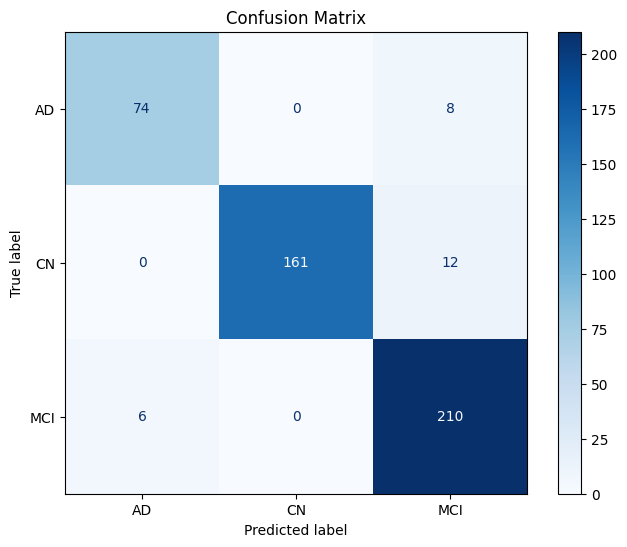

In [80]:
#Display confusion matrixs
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


# Predict class labels
y_pred = model.predict(X_test)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['AD', 'CN', 'MCI']  # class labels in correct order

# Plot it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap="Blues", values_format='d')  # or use 'g' for normalized values
plt.title("Confusion Matrix")
plt.show()

# 4.2.1 Cross Validating the Light GBM

In [52]:
# Detect the keys in the classification report (e.g., '0', '1', '2' instead of 'AD', 'CN', 'MCI')
report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)
report_df = pd.DataFrame(report).T

# Dynamically figure out the correct label names (keys that are not 'accuracy', 'macro avg', etc.)
label_keys = [key for key in report_df.index if key not in ['accuracy', 'macro avg', 'weighted avg']]

# Filter just those and add fold info
df = report_df.loc[label_keys, ['precision', 'recall', 'f1-score']]
df['fold'] = fold + 1
class_reports.append(df)


In [53]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
import numpy as np
import pandas as pd


#Using label mapping 
classes = np.unique(y)  # E.g., [0, 1, 2]
label_map = {0: 'AD', 1: 'CN', 2: 'MCI'}  # Optional: map numeric to strings

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

#Evaluation metrics
metrics = {
    'accuracy': [],
    'recall_macro': [],
    'f1_macro': [],
    'precision_macro': [],
    'roc_auc_macro': []
}

class_reports = []  # To store per-class report per fold


# Cross-validation loop
for fold, (train_idx, test_idx) in enumerate(cv.split(X, y)):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # SMOTE only on training data
    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),
        ('clf', LGBMClassifier(objective='multiclass', random_state=42))
    ])

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test)

    # ROC AUC handling
    try:
        y_test_bin = label_binarize(y_test, classes=classes)
        auc = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')
    except ValueError:
        auc = np.nan  # Handle missing class in fold

    # Overall metrics
    metrics['accuracy'].append(accuracy_score(y_test, y_pred))
    metrics['recall_macro'].append(recall_score(y_test, y_pred, average='macro'))
    metrics['f1_macro'].append(f1_score(y_test, y_pred, average='macro'))
    metrics['precision_macro'].append(precision_score(y_test, y_pred, average='macro'))
    metrics['roc_auc_macro'].append(auc)

    # Per-class classification report
    report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)
    report_df = pd.DataFrame(report).T
    label_rows = [lbl for lbl in report_df.index if lbl not in ['accuracy', 'macro avg', 'weighted avg']]
    df = report_df.loc[label_rows, ['precision', 'recall', 'f1-score']]
    df['fold'] = fold + 1
    class_reports.append(df)


# Summary of overall metrics
print("\nCross-Validation Summary:")
for m in metrics:
    vals = np.array(metrics[m])
    print(f"{m}: {np.nanmean(vals):.4f} ± {np.nanstd(vals):.4f}")


# Per-class performance across all folds
results_df = pd.concat(class_reports).reset_index().rename(columns={'index': 'class'})
results_df['class'] = results_df['class'].astype(int).map(label_map)  # Optional
print("\nPer-Class Classification Report Across Folds:")
print(results_df)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4609
[LightGBM] [Info] Number of data points in the train set: 2592, number of used features: 30
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4611
[LightGBM] [Info] Number of data points in t

In [54]:
from sklearn.metrics import confusion_matrix

# Add this before the loop
conf_matrices = []

# Inside the loop (just after y_pred)
cm = confusion_matrix(y_test, y_pred, labels=classes)
conf_matrices.append(cm)

# After the loop: average confusion matrix
mean_cm = np.mean(conf_matrices, axis=0).astype(int)

print("\nMean Confusion Matrix Across Folds:")
print(pd.DataFrame(mean_cm, index=[f"True {label_map[c]}" for c in classes],
                             columns=[f"Pred {label_map[c]}" for c in classes]))



Mean Confusion Matrix Across Folds:
          Pred AD  Pred CN  Pred MCI
True AD        75        0         7
True CN         0      168         4
True MCI        6        9       201


In [ ]:
Label Mapping: {'AD': np.int64(0), 'CN': np.int64(1), 'MCI': np.int64(2)}

# 4.2.2 Using Explainable AI for Light GBM

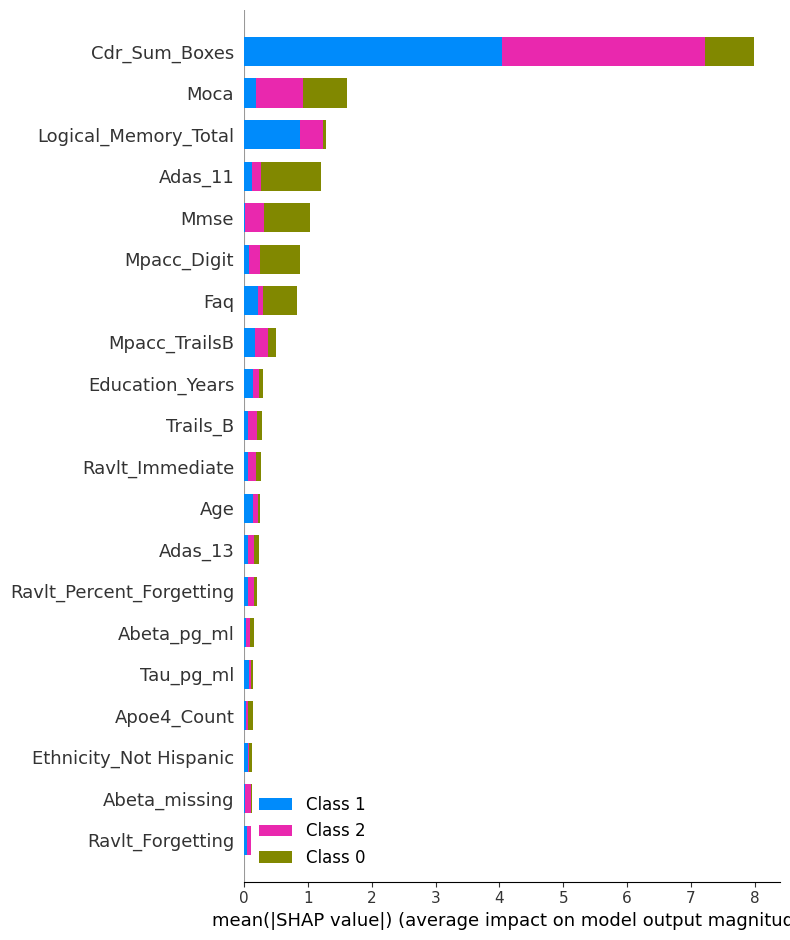

In [16]:
import shap
shap.initjs()
# 1. Load explainer
explainer = shap.TreeExplainer(model)

# 2. Compute SHAP values for the data (use the same features you trained on)
shap_values = explainer.shap_values(X_test)
shap_values = explainer(X_test)


# 3. Visualize global feature importance
shap.summary_plot(shap_values, X_test)

- Feature Results for Alzhiemer's Disease

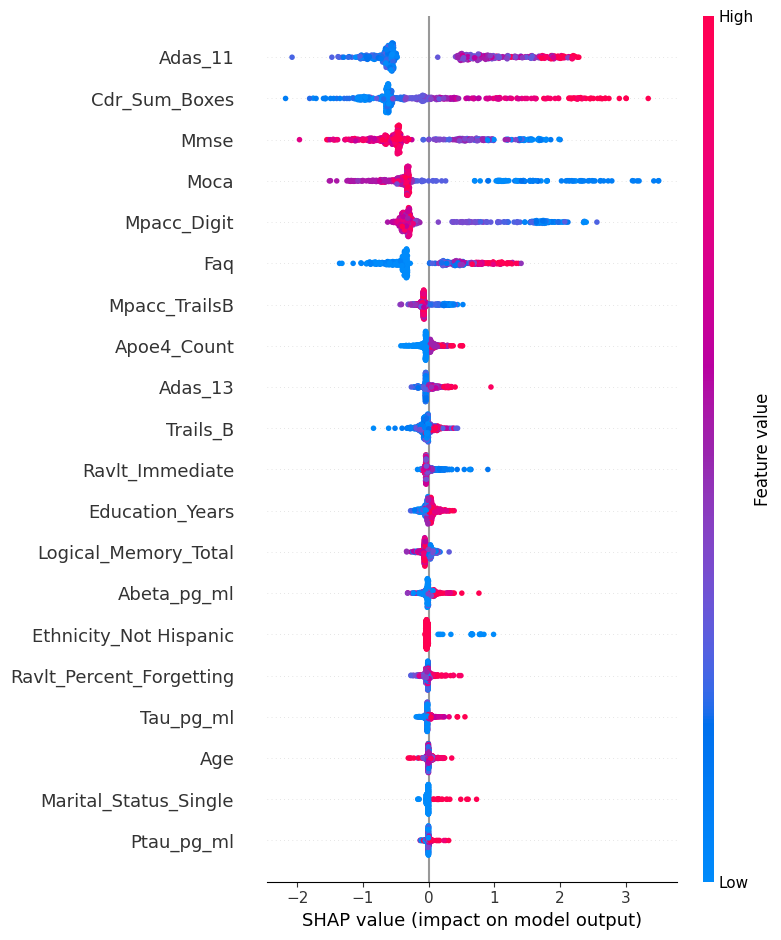

In [20]:
shap.summary_plot(shap_values[:, :, 0], X_test)  # class 0 is AD

In [166]:
shap.force_plot(shap_values[:, :, 0], X_test)  # class 0 is AD

- Feature Result for Cognitve Normal

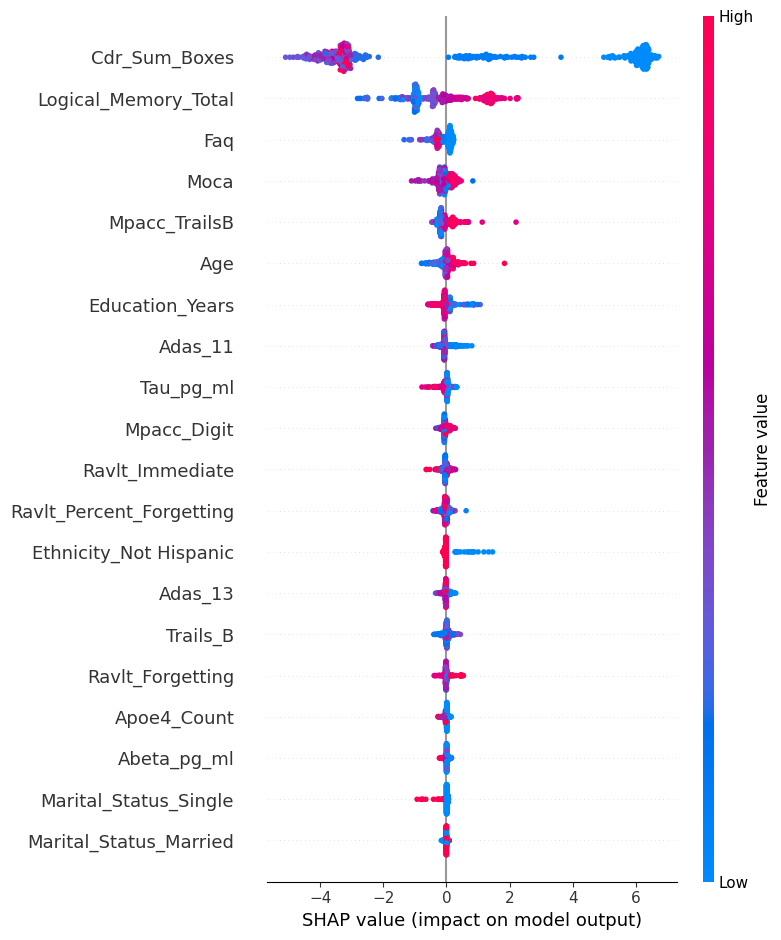

In [168]:
shap.summary_plot(shap_values[:, :, 1], X_test)  # class 1 is Cognitive Normal

In [170]:
shap.force_plot(shap_values[:, :, 1], X_test)  # class 1 is Cognitive Normal

- Feature Result for Mild Cognitive Impairment 

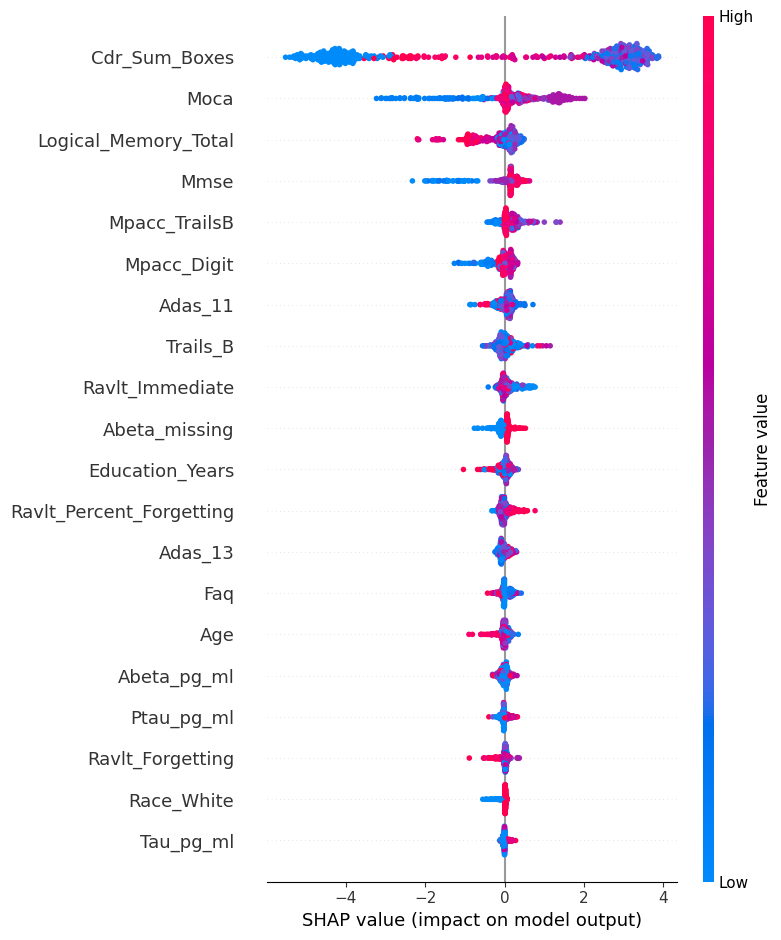

In [171]:
shap.summary_plot(shap_values[:, :, 2], X_test)  # class 2 is Mild Cognitve Impairment  

In [172]:
shap.force_plot(shap_values[:, :, 2], X_test)  # class 2 is Mild Cognitive Impairment  

# 4.3 XG Boost - Model 2

In [62]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize

model_xgb = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,                    
    eval_metric='mlogloss',
    random_state=42
)

model_xgb.fit(X_train_resampled, y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None, num_class=3, ...)

In [82]:
# Predictions
y_pred = model_xgb.predict(X_test)
y_proba = model_xgb.predict_proba(X_test)

# Binarize true labels for AUC (one-vs-rest)
y_test_bin = label_binarize(y_test, classes=model_xgb.classes_)

# Metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')
roc_auc = roc_auc_score(y_test_bin, y_proba, average='macro', multi_class='ovr')

# Report
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC AUC (macro, OvR): {roc_auc:.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred,target_names= ['AD', 'CN', 'MCI']))


Accuracy: 0.9512
Precision (macro): 0.9506
Recall (macro): 0.9452
F1 Score (macro): 0.9474
ROC AUC (macro, OvR): 0.9934

Classification Report:
              precision    recall  f1-score   support

          AD       0.93      0.93      0.93        82
          CN       1.00      0.94      0.97       173
         MCI       0.93      0.97      0.95       216

    accuracy                           0.95       471
   macro avg       0.95      0.95      0.95       471
weighted avg       0.95      0.95      0.95       471



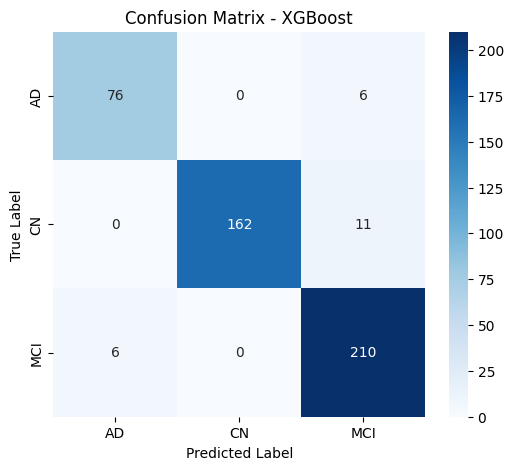

In [83]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['AD', 'CN', 'MCI']
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix - XGBoost')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# 4.3.1 Using Explainable AI for the XG Boost Model

In [96]:
# had to Convert boolean columns to int due to error in using XAI
for col in X_train_clean.select_dtypes(include='bool').columns:
    X_train_clean[col] = X_train_clean[col].astype(int)
    X_test_clean[col] = X_test_clean[col].astype(int)


 98%|===================| 1385/1413 [00:23<00:00]        

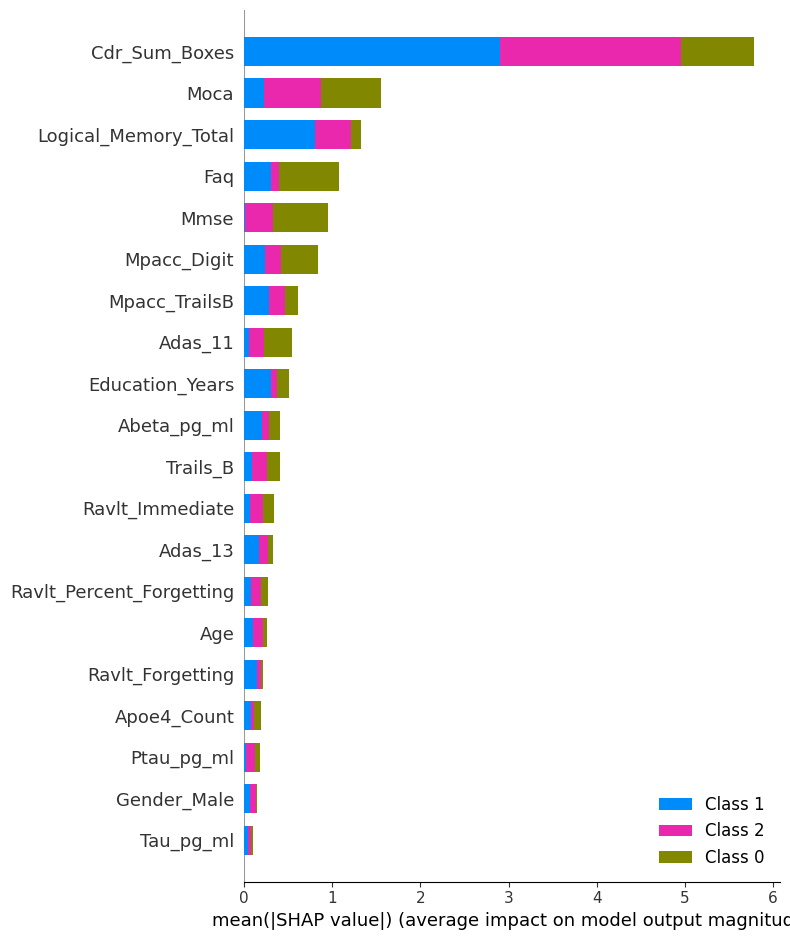

In [98]:
import shap
shap.initjs()

explainer = shap.Explainer(model_xgb, X_train_clean)
shap_values = explainer(X_test_clean)

shap.summary_plot(shap_values, X_test_clean)

In [106]:
print(le.classes_)

# To see mapping from label:
label_to_encoded = {label: idx for idx, label in enumerate(le.classes_)}
print(label_to_encoded)

['AD' 'CN' 'MCI']
{'AD': 0, 'CN': 1, 'MCI': 2}


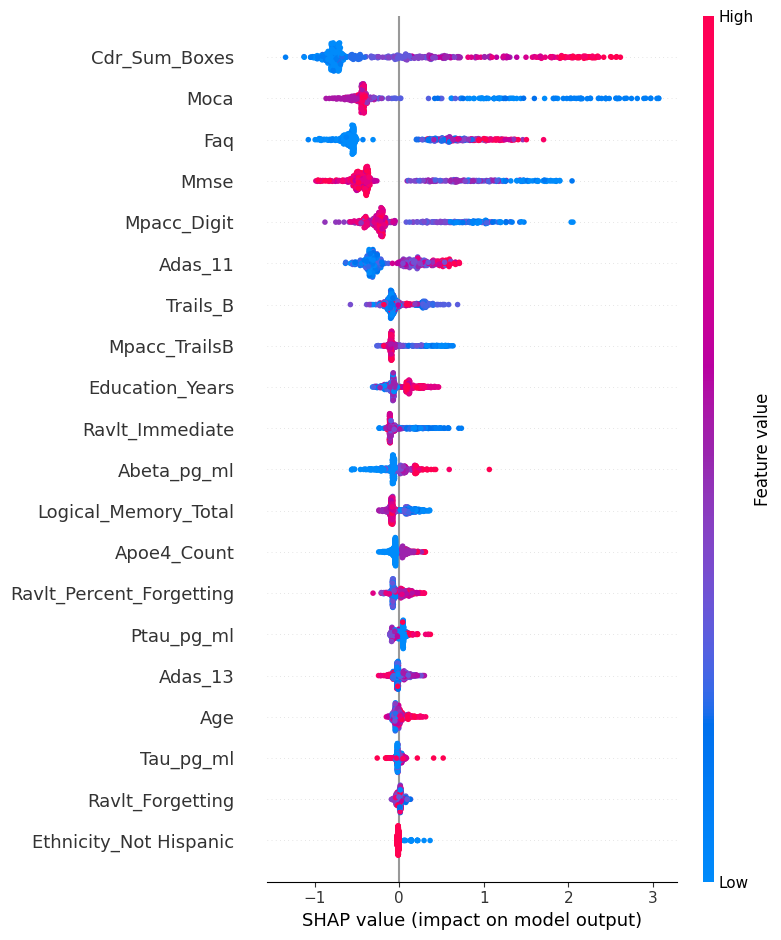

In [99]:
shap.summary_plot(shap_values[:, :, 0], X_test_clean) 

In [102]:
shap.force_plot(shap_values[:, :, 0], X_test_clean)

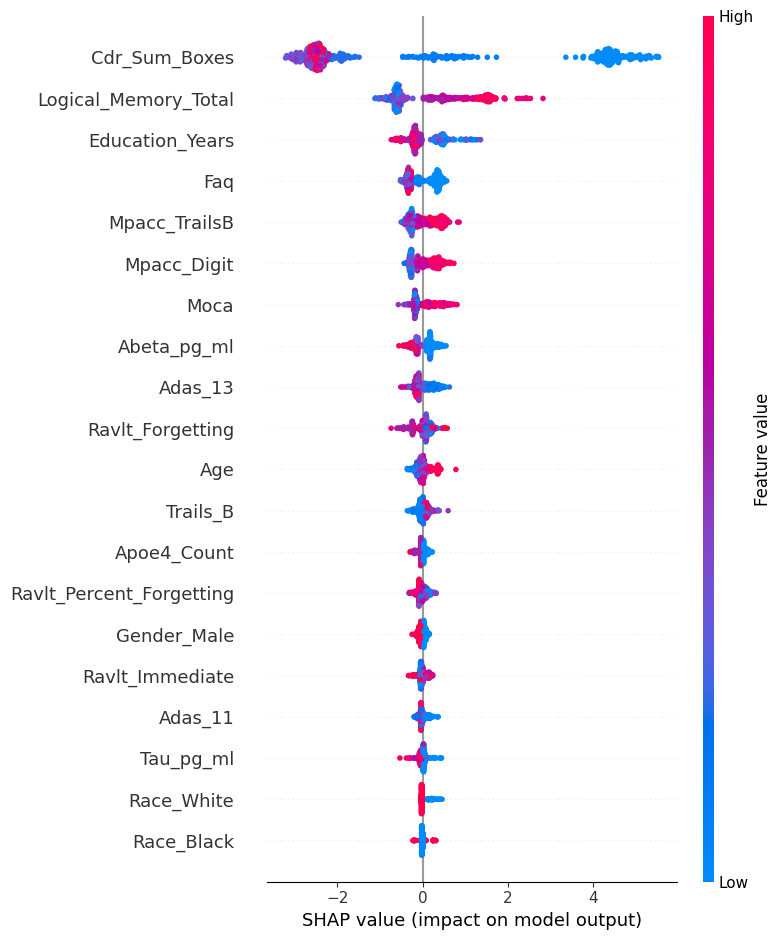

In [100]:
shap.summary_plot(shap_values[:, :, 1], X_test_clean) 

In [103]:
shap.force_plot(shap_values[:, :, 1], X_test_clean)

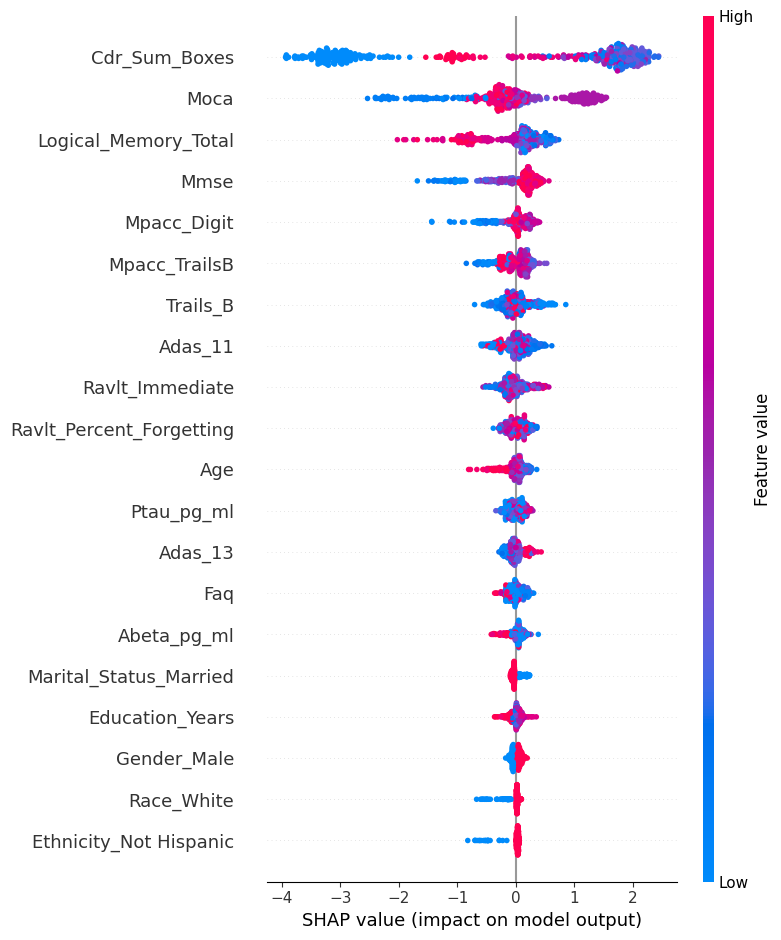

In [101]:
shap.summary_plot(shap_values[:, :, 2], X_test_clean) 

In [104]:
shap.force_plot(shap_values[:, :, 2], X_test_clean)

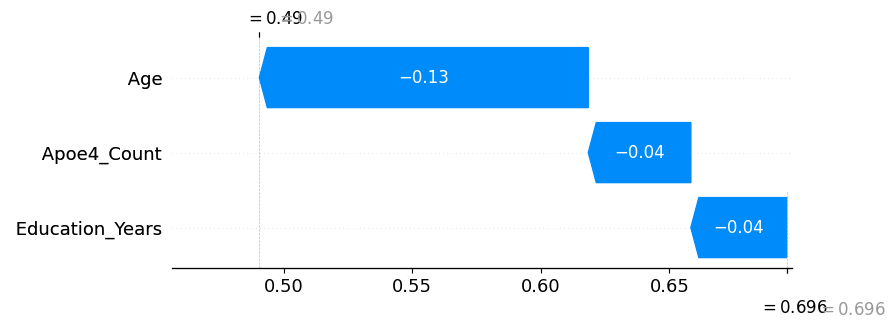

In [86]:
index = 10
shap.plots._waterfall.waterfall_legacy(
    explainer.expected_value[1],  # For class 'MCI'
    shap_values[1][index],
    X_test.iloc[index]
)


# 4.4 Support Vector Machine

In [84]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

#Scale the resampled training data
scaler = StandardScaler()
X_train_res_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)  # Use original X_test!

#Train SVM on SMOTE-balanced data
svm = SVC(kernel='rbf', C=1, gamma='scale', decision_function_shape='ovo', random_state=42)
svm.fit(X_train_res_scaled, y_train_resampled)

#Predict on original test set (no resampling)
y_pred = svm.predict(X_test_scaled)

#Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names= ['AD', 'CN', 'MCI']))


Classification Report:
              precision    recall  f1-score   support

          AD       0.89      0.88      0.88        82
          CN       0.92      0.97      0.94       173
         MCI       0.92      0.89      0.91       216

    accuracy                           0.92       471
   macro avg       0.91      0.91      0.91       471
weighted avg       0.92      0.92      0.92       471



In [85]:
# Get the full classification report as a dictionary
report_dict = classification_report(y_test, y_pred, target_names= ['AD', 'CN', 'MCI'], output_dict=True)

# Convert to DataFrame
report_df = pd.DataFrame(report_dict).T

# Drop precision column
report_df = report_df.drop(columns='precision')

# Round the results
report_df = report_df.round(2)

# Display
print("Classification Report:\n")
print(report_df[['recall', 'f1-score', 'support']])

Classification Report:

              recall  f1-score  support
AD              0.88      0.88    82.00
CN              0.97      0.94   173.00
MCI             0.89      0.91   216.00
accuracy        0.92      0.92     0.92
macro avg       0.91      0.91   471.00
weighted avg    0.92      0.92   471.00


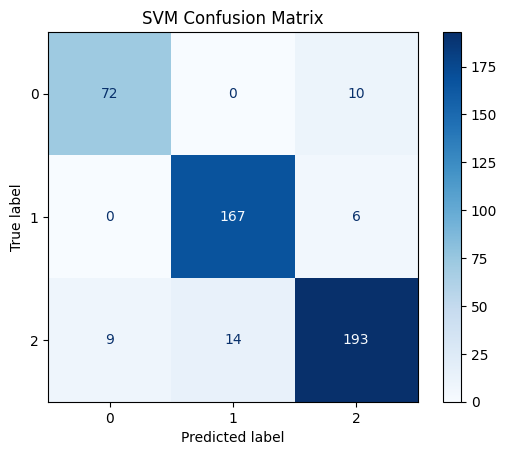

Accuracy: 0.9172
Recall (macro): 0.9123
F1 Score (macro): 0.9117
ROC-AUC (OvR, macro): 0.9340


In [74]:
from sklearn.metrics import (
    accuracy_score, recall_score, f1_score,
    roc_auc_score, classification_report,
    confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

#Confusion matrix (visual)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm.classes_)
disp.plot(cmap='Blues')
plt.title("SVM Confusion Matrix")
plt.show()

#Accuracy
accuracy = accuracy_score(y_test, y_pred)

#Recall
recall = recall_score(y_test, y_pred, average='macro')

#f1Score
f1 = f1_score(y_test, y_pred, average='macro')

#Roc_auc
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])
roc_auc = roc_auc_score(y_test_bin, y_pred_bin, average='macro', multi_class='ovr')

#Print the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR, macro): {roc_auc:.4f}")

In [ ]:
# Use the correct feature names from your preprocessed data
#feature_names = X_train.columns  # Or X_train_resampled.columns if that's what was used

# Now build the DataFrame with correct number of columns
#X_sample = pd.DataFrame(X_test_scaled[:100], columns=feature_names)

# SHAP Explainer
#explainer = shap.KernelExplainer(svm.predict_proba, X_sample)
#shap_values = explainer.shap_values(X_sample)

# SHAP Summary Plot
#shap.summary_plot(shap_values, X_sample, plot_type="bar")

# SHAP Force Plot (for first prediction)
#shap.initjs()
#shap.force_plot(explainer.expected_value[0], shap_values[0][0], X_sample.iloc[0], matplotlib=True)


# 4..4.1 Using Explainable AI for SVM 

In [175]:
# SHAP expects a model with a .predict_proba() method — wrap SVM with probability
svm_prob = SVC(kernel='rbf', C=1, gamma='scale', probability=True, random_state=42)
svm_prob.fit(X_train_res_scaled, y_train_resampled)

# Create SHAP explainer
explainer = shap.KernelExplainer(svm_prob.predict_proba, shap.sample(X_train_res_scaled, 100))

# Choose some test instances to explain
shap_values = explainer.shap_values(X_test_scaled[:10])

  0%|          | 0/10 [00:00<?, ?it/s]

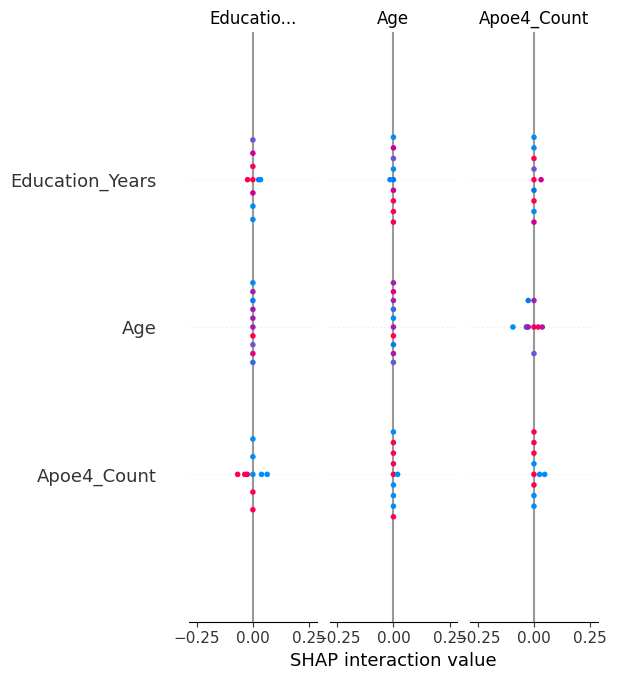

In [176]:
shap.summary_plot(shap_values, X_test_scaled[:10], feature_names=X.columns)

# 4.5 Random Forest

In [86]:
#RANDOM FOREST 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_resampled, y_train_resampled)

# Predict on original test set
y_pred = rf.predict(X_test)

# Report performance
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names= ['AD', 'CN', 'MCI']))

#Print the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR, macro): {roc_auc:.4f}")


Classification Report:
              precision    recall  f1-score   support

          AD       0.93      0.91      0.92        82
          CN       1.00      0.94      0.97       173
         MCI       0.93      0.97      0.95       216

    accuracy                           0.95       471
   macro avg       0.95      0.94      0.95       471
weighted avg       0.95      0.95      0.95       471

Accuracy: 0.9512
Recall (macro): 0.9452
F1 Score (macro): 0.9474
ROC-AUC (OvR, macro): 0.9934


In [87]:
# Get the full classification report as a dictionary
report_dict = classification_report(y_test, y_pred,target_names= ['AD', 'CN', 'MCI'], output_dict=True)

# Convert to DataFrame
report_df = pd.DataFrame(report_dict).T

# Drop precision column
report_df = report_df.drop(columns='precision')

# Round the results
report_df = report_df.round(2)

# Display
print("Classification Report:\n")
print(report_df[['recall', 'f1-score', 'support']])

Classification Report:

              recall  f1-score  support
AD              0.91      0.92    82.00
CN              0.94      0.97   173.00
MCI             0.97      0.95   216.00
accuracy        0.95      0.95     0.95
macro avg       0.94      0.95   471.00
weighted avg    0.95      0.95   471.00


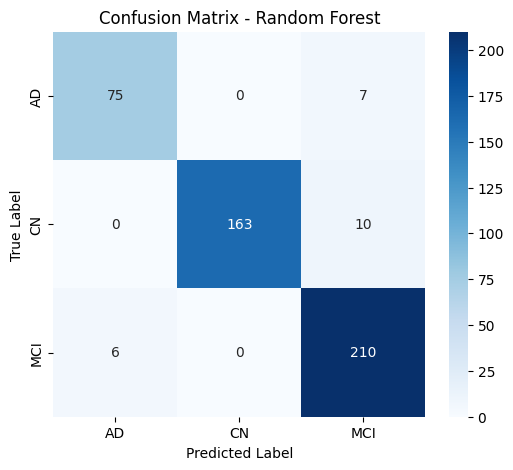

Accuracy: 0.9512
Recall (macro): 0.9452
F1 Score (macro): 0.9474
ROC-AUC (OvR, macro): 0.9934


In [88]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['AD', 'CN', 'MCI']
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix - Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

#Print the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR, macro): {roc_auc:.4f}")

# 4.5.1 Cross Validating the Random Forest

In [55]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (accuracy_score, recall_score, f1_score,
                             precision_score, roc_auc_score,
                             classification_report, confusion_matrix)
from sklearn.preprocessing import label_binarize
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import pandas as pd

# X, y already defined (original, NOT SMOTEd)
# classes already defined; label_map optional for prettier output
classes    = np.unique(y)
label_map  = {0: 'AD', 1: 'CN', 2: 'MCI'}   # adjust if needed
cv         = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

metrics        = {m: [] for m in
                 ['accuracy','recall_macro','f1_macro','precision_macro','roc_auc_macro']}
class_reports  = []
conf_matrices  = []

for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), start=1):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),
        ('clf',   RandomForestClassifier(
                     n_estimators=400,
                     max_depth=None,
                     random_state=42,
                     n_jobs=-1
                 ))
    ])

    pipeline.fit(X_train, y_train)
    y_pred  = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test)

    # ---- overall metrics
    metrics['accuracy'].append(accuracy_score(y_test, y_pred))
    metrics['recall_macro'].append(recall_score(y_test, y_pred, average='macro'))
    metrics['f1_macro'].append(f1_score(y_test, y_pred, average='macro'))
    metrics['precision_macro'].append(precision_score(y_test, y_pred, average='macro'))

    try:
        y_bin = label_binarize(y_test, classes=classes)
        auc   = roc_auc_score(y_bin, y_proba, average='macro', multi_class='ovr')
    except ValueError:
        auc = np.nan
    metrics['roc_auc_macro'].append(auc)

    # ---- per‑class report
    rpt_df = pd.DataFrame(classification_report(
                    y_test, y_pred, output_dict=True, zero_division=0)).T
    rpt_df = rpt_df.loc[[c for c in rpt_df.index
                        if c not in ['accuracy','macro avg','weighted avg']],
                        ['precision','recall','f1-score']]
    rpt_df['fold'] = fold
    class_reports.append(rpt_df)

    # ---- confusion matrix
    conf_matrices.append(confusion_matrix(y_test, y_pred, labels=classes))

# Print overall CV metrics
print("\nRandom‑Forest Cross‑Validation Summary:")
for m, vals in metrics.items():
    print(f"{m}: {np.nanmean(vals):.4f} ± {np.nanstd(vals):.4f}")


# Per‑class performance
per_class = (pd.concat(class_reports).reset_index()
             .rename(columns={'index':'class'})
             .astype({'class':int})
             .replace({'class':label_map}))
print("\nPer‑Class Report Across Folds:")
print(per_class)

# Mean confusion matrix across folds
mean_cm = np.mean(conf_matrices, axis=0).astype(int)
cm_df   = pd.DataFrame(mean_cm,
           index=[f"True {label_map[c]}" for c in classes],
           columns=[f"Pred {label_map[c]}" for c in classes])
print("\nMean Confusion Matrix Across Folds:")
print(cm_df)


Random‑Forest Cross‑Validation Summary:
accuracy: 0.9422 ± 0.0056
recall_macro: 0.9359 ± 0.0096
f1_macro: 0.9350 ± 0.0064
precision_macro: 0.9351 ± 0.0056
roc_auc_macro: 0.9900 ± 0.0011

Per‑Class Report Across Folds:
   class  precision    recall  f1-score  fold
0     AD   0.844444  0.926829  0.883721     1
1     CN   0.994118  0.976879  0.985423     1
2    MCI   0.952607  0.930556  0.941452     1
3     AD   0.888889  0.878049  0.883436     2
4     CN   0.993827  0.930636  0.961194     2
5    MCI   0.903509  0.953704  0.927928     2
6     AD   0.922078  0.876543  0.898734     3
7     CN   0.970760  0.959538  0.965116     3
8    MCI   0.923423  0.949074  0.936073     3
9     AD   0.915663  0.938272  0.926829     4
10    CN   0.987805  0.936416  0.961424     4
11   MCI   0.928251  0.958333  0.943052     4
12    AD   0.882353  0.914634  0.898204     5
13    CN   0.965714  0.982558  0.974063     5
14   MCI   0.952381  0.925926  0.938967     5

Mean Confusion Matrix Across Folds:
        

In [76]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
Adni_cleaned['Diagnosis_encoded'] = le.fit_transform(Adni_cleaned['Diagnosis'])
print(dict(zip(le.classes_, le.transform(le.classes_))))


{'AD': np.int64(0), 'CN': np.int64(1), 'MCI': np.int64(2)}


In [77]:
print("Model classes:", model.classes_)


Model classes: [0 1 2]


# 4.5.2 Using Explainable AI on Random Forest

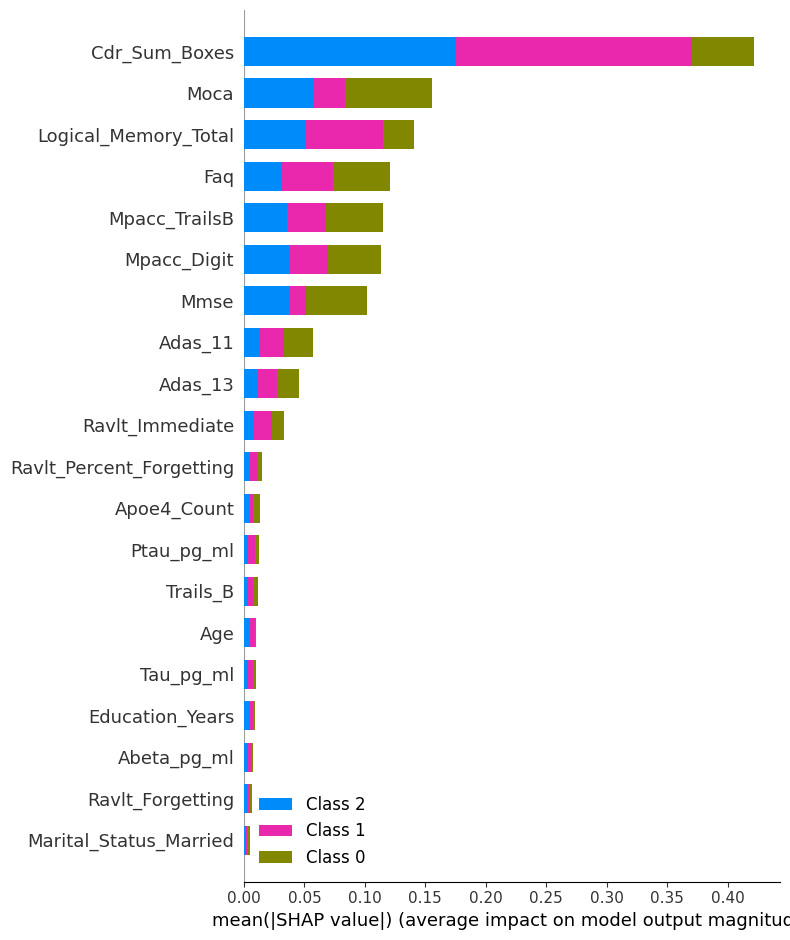

In [90]:
#Apply SHAP TreeExplainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

#SHAP Summary Plot (Global Importance)
shap.summary_plot(shap_values, X_test, plot_type="bar")

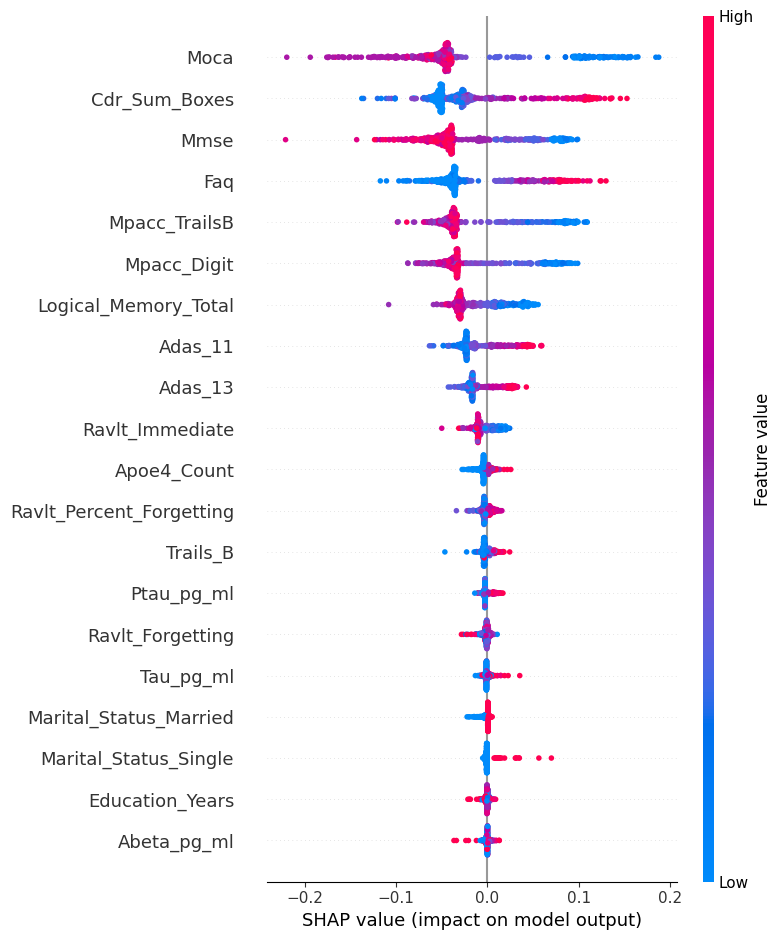

In [92]:
shap.summary_plot(shap_values[:, :, 0], X_test)

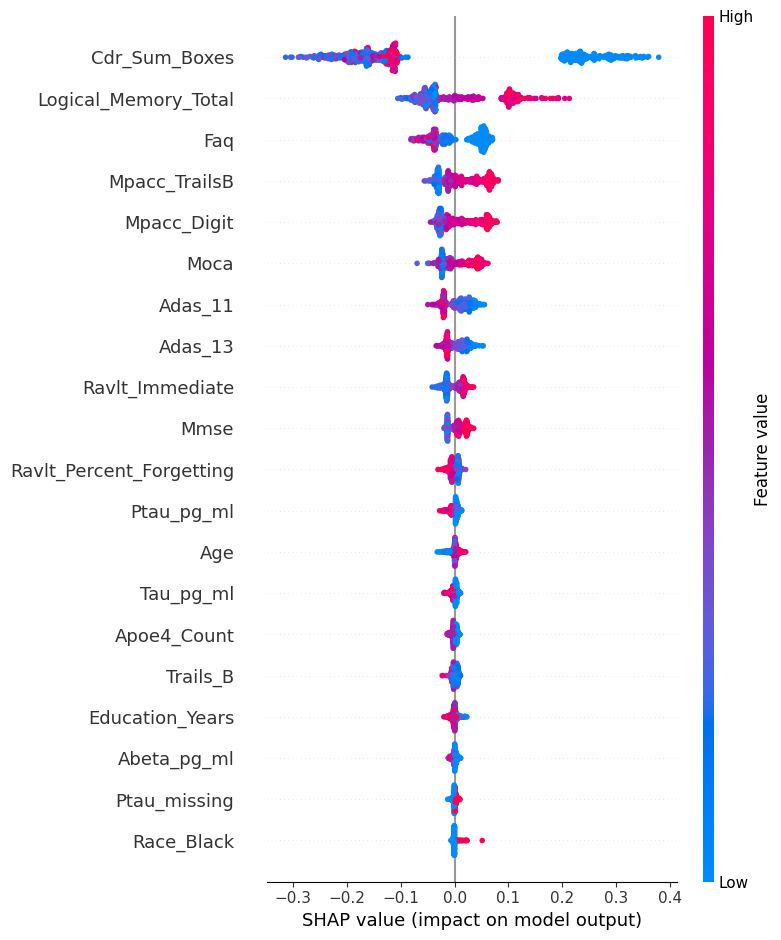

In [97]:
#Show SHAP summary for class 1 (CN)
shap.summary_plot(shap_values[:, :, 1], X_test)

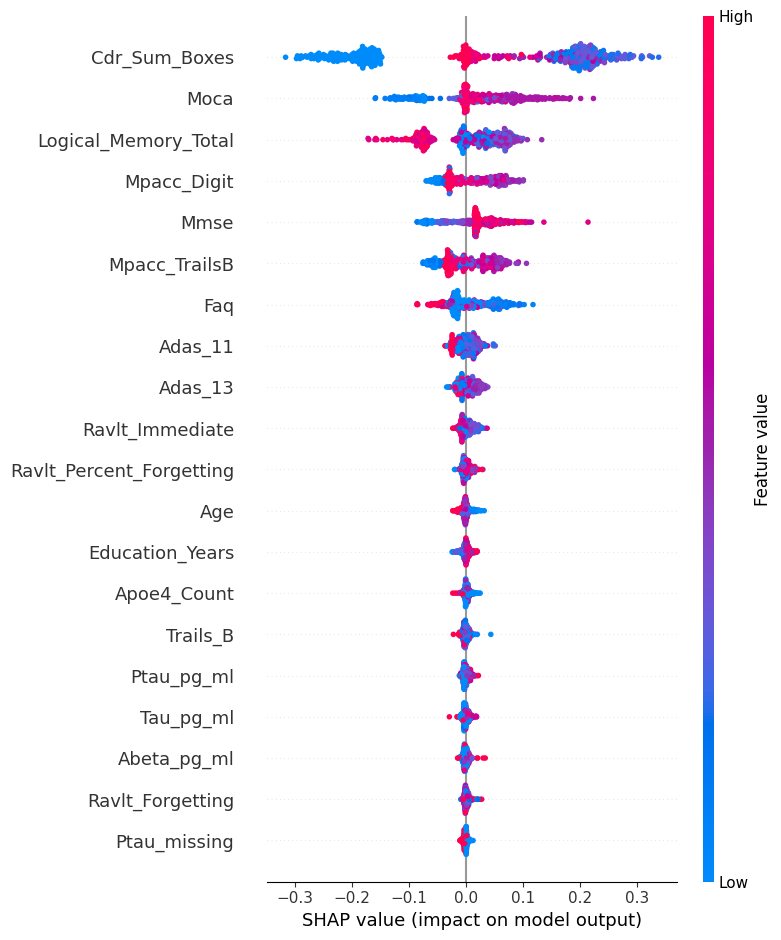

In [96]:
# Show SHAP summary for class 2 (MCI) only
shap.summary_plot(shap_values[:, :, 2], X_test)

# 4.6 Pipeline Processing for RNN and LSTM

It is good to recall that one of the goals of this research is to evaluate disease progression. We have already trained our model using baseline data. However, to move on to the next phase, it is important to repurpose the data for longitudinal analysis. 
Thesame cleaning pipeline will be applied to restructure the data.

In [6]:
#Appling thesame cleaning to Adni_filtered instead. 
Adni_filtered

,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX_bl,DX,VISCODE,...,mPACCdigit,mPACCdigit_bl,mPACCtrailsB,mPACCtrailsB_bl,ABETA,ABETA_bl,TAU,TAU_bl,PTAU,PTAU_bl
RID,,,,,,,,,,,,,,,,,,,,,
2,Male,74.3,16,Not Hisp/Latino,White,Married,0.0,CN,CN,bl,...,-4.31028,-4.31028,-4.11443,-4.114430,NaN,NaN,NaN,NaN,NaN,NaN
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,bl,...,-16.24490,-16.24490,-15.82990,-15.829900,741.5,741.5,239.7,239.7,22.83,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m06,...,-14.76900,-16.24490,-13.13950,-15.829900,NaN,741.5,NaN,239.7,NaN,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m12,...,-20.96910,-16.24490,-19.77900,-15.829900,601.4,741.5,251.7,239.7,24.18,22.83
3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,m24,...,-19.71360,-16.24490,-19.89420,-15.829900,NaN,741.5,NaN,239.7,NaN,22.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4349,Female,71.4,16,Not Hisp/Latino,White,Divorced,0.0,CN,NaN,m138,...,NaN,-2.64810,NaN,-0.838596,NaN,995.8,NaN,174.4,NaN,17.82
6801,Female,61.0,12,Not Hisp/Latino,Black,Divorced,1.0,SMC,NaN,m42,...,NaN,-3.19788,NaN,-2.614330,NaN,NaN,NaN,NaN,NaN,NaN
5097,Male,67.5,16,Not Hisp/Latino,White,Married,0.0,SMC,NaN,m126,...,NaN,-6.51788,NaN,-5.478020,NaN,1328,NaN,204.5,NaN,16.48


# - Filtering the Datasets with timepoints based on visits

In [7]:
#Defining valid timepoints (baseline + up to 24 months)
viscode_2yr = ['bl', 'm06', 'm12', 'm18', 'm24']

# Filter your cleaned ADNI data for these visits
Adni_long = Adni_filtered[Adni_filtered['VISCODE'].str.lower().isin(viscode_2yr)].copy()

Adni_long.shape

(8934, 45)

In [8]:
#Filtering with the viscode above, it is important with longtitudinal models that the 5 visits is complete. 
#We will be filtering for 5 complete sequence. 
#With clinical data, it is not okay to make assumptions. 

Adni_long = Adni_long.reset_index()  #ensures RID is a column

# Count visits per patient
visit_counts = Adni_long.groupby('RID')['VISCODE'].nunique()

# Keep only patients with exactly 5 visits
valid_rids = visit_counts[visit_counts == 5].index

# Filter dataset
Adni_seq = Adni_long[Adni_long['RID'].isin(valid_rids)].copy()

print("Patients with all 5 visits:", len(valid_rids))

Patients with all 5 visits: 1140


In [9]:
#Describing the shape of the sequential data. 
Adni_seq.shape

(5700, 46)

In [10]:
Adni_seq.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5700 entries, 1 to 7465
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   RID                       5700 non-null   int64  
 1   PTGENDER                  5700 non-null   object 
 2   AGE                       5700 non-null   float64
 3   PTEDUCAT                  5700 non-null   int64  
 4   PTETHCAT                  5700 non-null   object 
 5   PTRACCAT                  5700 non-null   object 
 6   PTMARRY                   5700 non-null   object 
 7   APOE4                     5700 non-null   float64
 8   DX_bl                     5700 non-null   object 
 9   DX                        4829 non-null   object 
 10  VISCODE                   5700 non-null   object 
 11  Month_bl                  5700 non-null   float64
 12  Month                     5700 non-null   int64  
 13  MMSE                      4823 non-null   float64
 14  MMSE_bl      

In [11]:
Adni_seq.head(50)

,RID,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX_bl,DX,...,mPACCdigit,mPACCdigit_bl,mPACCtrailsB,mPACCtrailsB_bl,ABETA,ABETA_bl,TAU,TAU_bl,PTAU,PTAU_bl
1,3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,...,-16.244900,-16.244900,-15.829900,-15.829900,741.5,741.5,239.7,239.7,22.83,22.83
2,3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,...,-14.769000,-16.244900,-13.139500,-15.829900,NaN,741.5,NaN,239.7,NaN,22.83
3,3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,...,-20.969100,-16.244900,-19.779000,-15.829900,601.4,741.5,251.7,239.7,24.18,22.83
4,3,Male,81.3,18,Not Hisp/Latino,White,Married,1.0,AD,Dementia,...,-19.713600,-16.244900,-19.894200,-15.829900,NaN,741.5,NaN,239.7,NaN,22.83
9,5,Male,73.7,16,Not Hisp/Latino,White,Married,0.0,CN,CN,...,-1.888680,-1.888680,-1.565830,-1.565830,547.3,547.3,337.0,337.0,33.43,33.43
10,5,Male,73.7,16,Not Hisp/Latino,White,Married,0.0,CN,CN,...,-0.746104,-1.888680,-1.641790,-1.565830,NaN,547.3,NaN,337.0,NaN,33.43
11,5,Male,73.7,16,Not Hisp/Latino,White,Married,0.0,CN,CN,...,1.028840,-1.888680,0.955429,-1.565830,472.8,547.3,334.1,337.0,34.04,33.43
12,5,Male,73.7,16,Not Hisp/Latino,White,Married,0.0,CN,CN,...,-0.639802,-1.888680,-0.045560,-1.565830,NaN,547.3,NaN,337.0,NaN,33.43
13,6,Female,80.4,13,Not Hisp/Latino,White,Married,0.0,LMCI,MCI,...,-10.141700,-10.141700,-10.910900,-10.910900,NaN,NaN,NaN,NaN,NaN,NaN
14,6,Female,80.4,13,Not Hisp/Latino,White,Married,0.0,LMCI,MCI,...,-14.333600,-10.141700,-14.630100,-10.910900,NaN,NaN,NaN,NaN,NaN,NaN


# - Dropping Columns

In [13]:
#Dropping Baseline columns
#Now we can proceed to use the pipeline for the data.  
# Proceeding to drop baseline duplicates. 
Adni_seq = Adni_seq.drop(columns=['DX_bl','Month_bl', 'MMSE_bl', 'MOCA_bl', 'CDRSB_bl',
                                            'ADAS11_bl','ADAS13_bl','FAQ_bl','RAVLT_immediate_bl',
                                            'RAVLT_forgetting_bl','RAVLT_perc_forgetting_bl','DIGITSCOR_bl','TRABSCOR_bl',
                                            'mPACCdigit_bl','mPACCtrailsB_bl','ABETA_bl','TAU_bl','PTAU_bl'
                                            ])

# - Rounding & Type Normalisation

In [14]:
#Rounding up and type Normalization
Adni_seq['AGE'] = np.ceil(Adni_seq['AGE'])

Adni_seq

,RID,PTGENDER,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX,VISCODE,...,RAVLT_forgetting,RAVLT_perc_forgetting,LDELTOTAL,DIGITSCOR,TRABSCOR,mPACCdigit,mPACCtrailsB,ABETA,TAU,PTAU
1,3,Male,82.0,18,Not Hisp/Latino,White,Married,1.0,Dementia,bl,...,4.0,100.0000,2.0,25.0,148.0,-16.24490,-15.82990,741.5,239.7,22.83
2,3,Male,82.0,18,Not Hisp/Latino,White,Married,1.0,Dementia,m06,...,6.0,100.0000,NaN,19.0,135.0,-14.76900,-13.13950,NaN,NaN,NaN
3,3,Male,82.0,18,Not Hisp/Latino,White,Married,1.0,Dementia,m12,...,7.0,100.0000,0.0,21.0,126.0,-20.96910,-19.77900,601.4,251.7,24.18
4,3,Male,82.0,18,Not Hisp/Latino,White,Married,1.0,Dementia,m24,...,5.0,100.0000,0.0,16.0,275.0,-19.71360,-19.89420,NaN,NaN,NaN
9,5,Male,74.0,16,Not Hisp/Latino,White,Married,0.0,CN,bl,...,4.0,44.4444,12.0,38.0,90.0,-1.88868,-1.56583,547.3,337.0,33.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7461,4021,Male,67.0,20,Not Hisp/Latino,Black,Married,0.0,CN,m06,...,11.0,84.6154,NaN,NaN,35.0,4.70250,5.51727,NaN,NaN,NaN
7462,4021,Male,67.0,20,Not Hisp/Latino,Black,Married,0.0,CN,m12,...,3.0,23.0769,13.0,NaN,41.0,2.28550,3.13126,NaN,NaN,NaN
7463,4021,Male,67.0,20,Not Hisp/Latino,Black,Married,0.0,NaN,m18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7464,4021,Male,67.0,20,Not Hisp/Latino,Black,Married,0.0,CN,m24,...,7.0,63.6364,13.0,NaN,37.0,1.12171,2.49836,708.3,80.16,<8


In [15]:
#Rounding up the floats to 2 whole numbers
Adni_seq = Adni_seq.round(2)

In [16]:
Adni_seq.iloc[:, -15:]

,ADAS11,ADAS13,FAQ,MOCA,RAVLT_immediate,RAVLT_forgetting,RAVLT_perc_forgetting,LDELTOTAL,DIGITSCOR,TRABSCOR,mPACCdigit,mPACCtrailsB,ABETA,TAU,PTAU
1,22.00,31.00,10.0,NaN,22.0,4.0,100.00,2.0,25.0,148.0,-16.24,-15.83,741.5,239.7,22.83
2,19.00,30.00,12.0,NaN,19.0,6.0,100.00,NaN,19.0,135.0,-14.77,-13.14,NaN,NaN,NaN
3,24.00,35.00,17.0,NaN,31.0,7.0,100.00,0.0,21.0,126.0,-20.97,-19.78,601.4,251.7,24.18
4,25.67,37.67,14.0,NaN,23.0,5.0,100.00,0.0,16.0,275.0,-19.71,-19.89,NaN,NaN,NaN
9,8.67,14.67,0.0,NaN,37.0,4.0,44.44,12.0,38.0,90.0,-1.89,-1.57,547.3,337.0,33.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7461,1.00,1.00,0.0,29.0,56.0,11.0,84.62,NaN,NaN,35.0,4.70,5.52,NaN,NaN,NaN
7462,3.00,4.00,0.0,29.0,51.0,3.0,23.08,13.0,NaN,41.0,2.29,3.13,NaN,NaN,NaN
7463,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7464,4.00,5.00,2.0,28.0,43.0,7.0,63.64,13.0,NaN,37.0,1.12,2.50,708.3,80.16,<8


# - Handling Negative Values 

In [17]:
#Handling negative values. 
(Adni_seq.select_dtypes(include='number') < 0).any()

RID                      False
AGE                      False
PTEDUCAT                 False
APOE4                    False
Month                    False
MMSE                     False
CDRSB                    False
ADAS11                   False
ADAS13                   False
FAQ                      False
MOCA                     False
RAVLT_immediate          False
RAVLT_forgetting          True
RAVLT_perc_forgetting     True
LDELTOTAL                False
DIGITSCOR                False
TRABSCOR                 False
mPACCdigit                True
mPACCtrailsB              True
dtype: bool

In [18]:
#Filter rows where either RAVLT_FORGETTING or RAVLT_PERC_FORGETTING is negative 
ravlt_negatives = Adni_seq[
    (Adni_seq['RAVLT_forgetting'] < 0) |
    (Adni_seq['RAVLT_perc_forgetting'] < 0)
]

# Showing columns of interest
columns_to_show = ['DX','RAVLT_forgetting','RAVLT_perc_forgetting']
display(ravlt_negatives[columns_to_show])

,DX,RAVLT_forgetting,RAVLT_perc_forgetting
31,CN,-2.0,-28.57
32,CN,-1.0,-14.29
198,CN,-1.0,-7.14
199,CN,-2.0,-15.38
240,MCI,-1.0,-7.69
...,...,...,...
7167,CN,-1.0,-7.69
7237,CN,-1.0,-9.09
7258,CN,-1.0,-7.14
7328,CN,-2.0,-18.18


In [19]:
# Changing negative values in the columns to None 
Adni_seq.loc[Adni_seq['RAVLT_forgetting'] < 0, 'RAVLT_forgetting'] = None
Adni_seq.loc[Adni_seq['RAVLT_perc_forgetting'] < 0, 'RAVLT_perc_forgetting'] = None

In [20]:
# Count of NaNs in the cleaned columns
Adni_seq[['RAVLT_forgetting','RAVLT_perc_forgetting']].isna().sum()

RAVLT_forgetting         1004
RAVLT_perc_forgetting    1035
dtype: int64

In [21]:
Adni_seq[
    Adni_seq[['RAVLT_forgetting','RAVLT_perc_forgetting']].isna().any(axis=1)
][['DX','RAVLT_forgetting','RAVLT_perc_forgetting']].head()

,DX,RAVLT_forgetting,RAVLT_perc_forgetting
31,CN,NaN,NaN
32,CN,NaN,NaN
44,Dementia,0.0,NaN
45,Dementia,0.0,NaN
148,Dementia,NaN,NaN


# - Data Mapping

In [22]:
#Understanding the Gender class
Adni_seq['PTGENDER'].value_counts()

PTGENDER
Male      3240
Female    2460
Name: count, dtype: int64

In [23]:
#Showing the values of the Education. 
Adni_seq['PTEDUCAT'].value_counts()
#With the Education the number highlights the years of Education of each patients with maximum being 20 and minimum 4.

PTEDUCAT
16    1365
18    1000
20     820
12     690
14     615
13     290
19     265
17     255
15     205
10      60
8       50
9       25
11      25
7       20
6       15
Name: count, dtype: int64

In [24]:
#Showing the distriubution of Ethnicity
Adni_seq['PTETHCAT'].value_counts()

PTETHCAT
Not Hisp/Latino    5545
Hisp/Latino         125
Unknown              30
Name: count, dtype: int64

In [25]:
#Showing the distribution of race
Adni_seq['PTRACCAT'].value_counts()

PTRACCAT
White                5345
Black                 200
Asian                  80
More than one          55
Am Indian/Alaskan      10
Unknown                 5
Hawaiian/Other PI       5
Name: count, dtype: int64

In [26]:
#Showing the marital status of patients
Adni_seq['PTMARRY'].value_counts()

PTMARRY
Married          4350
Widowed           690
Divorced          470
Never married     170
Unknown            20
Name: count, dtype: int64

In [27]:
#Renaming the observations appropriately 
Adni_seq['PTETHCAT'] = Adni_seq['PTETHCAT'].replace({'Not Hisp/Latino': 'Not Hispanic','Hisp/Latino': 'Hispanic'})
Adni_seq['PTRACCAT'] = Adni_seq['PTRACCAT'].replace({'More than one': 'Multiracial','Am Indian/Alaskan': 'Indian','Hawaiian/Other PI': 'Hawaiian'})
Adni_seq['PTMARRY'] = Adni_seq['PTMARRY'].replace({'Never married': 'Single'})
Adni_seq['DX'] = Adni_seq['DX'].replace({'Dementia': 'AD'})

#NOTE: Used .replace because .map can turn every unmapped values into missing values.

In [28]:
#Replacing the Unknowns in PTETHCAT of the columns with mode
mode_value = Adni_seq.loc[Adni_seq['PTETHCAT'] != 'Unknown', 'PTETHCAT'].mode()[0]
Adni_seq['PTETHCAT'] = Adni_seq['PTETHCAT'].replace('Unknown', mode_value)

In [30]:
#Replacing the Unknowns in PTRACCAT of the columns with mode
mode_value = Adni_seq.loc[Adni_seq['PTRACCAT'] != 'Unknown', 'PTRACCAT'].mode()[0]
Adni_seq['PTRACCAT'] = Adni_seq['PTRACCAT'].replace('Unknown', mode_value)

In [31]:
#Replacing the Unknowns in PTMARRY of the columns with mode
mode_value = Adni_seq.loc[Adni_seq['PTMARRY'] != 'Unknown', 'PTMARRY'].mode()[0]
Adni_seq['PTMARRY'] = Adni_seq['PTMARRY'].replace('Unknown', mode_value)

In [32]:
#Showing the distriubution of Ethnicity
Adni_seq['PTETHCAT'].value_counts()

PTETHCAT
Not Hispanic    5575
Hispanic         125
Name: count, dtype: int64

In [33]:
#Showing the distribution of race
Adni_seq['PTRACCAT'].value_counts()

PTRACCAT
White          5350
Black           200
Asian            80
Multiracial      55
Indian           10
Hawaiian          5
Name: count, dtype: int64

In [34]:
#Showing the marital status of patients
Adni_seq['PTMARRY'].value_counts()

PTMARRY
Married     4370
Widowed      690
Divorced     470
Single       170
Name: count, dtype: int64

# - Converting Datatypes

In [35]:
#Converting data types 
Adni_seq.dtypes

RID                        int64
PTGENDER                  object
AGE                      float64
PTEDUCAT                   int64
PTETHCAT                  object
PTRACCAT                  object
PTMARRY                   object
APOE4                    float64
DX                        object
VISCODE                   object
Month                      int64
MMSE                     float64
CDRSB                    float64
ADAS11                   float64
ADAS13                   float64
FAQ                      float64
MOCA                     float64
RAVLT_immediate          float64
RAVLT_forgetting         float64
RAVLT_perc_forgetting    float64
LDELTOTAL                float64
DIGITSCOR                float64
TRABSCOR                 float64
mPACCdigit               float64
mPACCtrailsB             float64
ABETA                     object
TAU                       object
PTAU                      object
dtype: object

In [36]:
# Observing the object type but numeric columns
biomarker_cols = ['ABETA', 'TAU', 'PTAU']

# Loop through each and find values recorded as strings with '>' or '<'
for col in biomarker_cols:
    if col in Adni_seq.columns:
        mask = Adni_seq[col].astype(str).str.contains(r'[<>]')
        flagged = Adni_seq[mask]
        print(f"Values in '{col}' recorded with '>' or '<':")
        display(flagged[['DX', col]].head(10))
    else:
        print(f"Column '{col}' not found in the DataFrame.")

Values in 'ABETA' recorded with '>' or '<':


,DX,ABETA
6584,CN,>1700
6586,CN,>1700
6589,CN,>1700
6591,CN,>1700
6594,CN,>1700
6595,CN,>1700
6600,CN,>1700
6602,CN,>1700
6605,MCI,>1700
6610,CN,>1700


Values in 'TAU' recorded with '>' or '<':


,DX,TAU
7449,CN,<80
7455,CN,<80
7457,CN,<80
7459,CN,<80


Values in 'PTAU' recorded with '>' or '<':


,DX,PTAU
7449,CN,<8
7455,CN,<8
7457,CN,<8
7459,CN,<8
7460,CN,<8
7464,CN,<8
7465,MCI,<8


In [37]:
anomaly_map= {
    'ABETA': {'<200': 199, '>1700': 1701},
    'TAU':   {'<80': 79, '>1300': 1301},
    'PTAU':  {'<8': 7, '>120': 121}
}

for col, replacements in anomaly_map.items():
    if col in Adni_seq.columns:
        for original, new_val in replacements.items():
            Adni_seq.loc[Adni_seq[col] == original, col] = new_val

In [38]:
#Converting the object datatype to float
# Convert each column to float
for col in biomarker_cols:
    if col in Adni_seq.columns:
        Adni_seq[col] = pd.to_numeric(Adni_seq[col], errors='coerce')

Adni_seq[biomarker_cols].dtypes

ABETA    float64
TAU      float64
PTAU     float64
dtype: object

# - Renaming Columns Appropriately

In [39]:
#Renaming some of the columns properly
#Renaming columns properly
Adni_seq.rename(columns={'RID':'Participant_ID',
    'DX': 'Diagnosis',
    'PTGENDER': 'Gender',
    'AGE': 'Age',
    'PTEDUCAT': 'Education_Years',
    'PTETHCAT': 'Ethnicity',
    'PTRACCAT': 'Race',
    'PTMARRY': 'Marital_Status',
    'VISCODE': 'Visit_Code',
    'MONTH': 'Month_baseline',
    'APOE4': 'Apoe4_Count',

    # Cognitive tests
    'MMSE': 'Mmse',
    'MOCA': 'Moca',
    'CDRSB': 'Cdr_Sum_Boxes',
    'ADAS11': 'Adas_11',
    'ADAS13': 'Adas_13',
    'FAQ': 'Faq',
    'RAVLT_immediate': 'Ravlt_Immediate',
    'RAVLT_forgetting': 'Ravlt_Forgetting',
    'RAVLT_perc_forgetting': 'Ravlt_Percent_Forgetting',
                

    # Memory/Attention
    'LDELTOTAL': 'Logical_Memory_Total',
    'DIGITSCOR': 'Digit_Symbol_Substitution',
    'TRABSCOR': 'Trails_B',

    # Composite scores
    'mPACCdigit': 'Mpacc_Digit',
    'mPACCtrailsB': 'Mpacc_TrailsB',

    # CSF biomarkers
    'ABETA': 'Abeta_pg_ml',
    'TAU': 'Tau_pg_ml',
    'PTAU': 'Ptau_pg_ml',
     }, inplace=True)

# - Missing Values

In [40]:
Adni_seq.isnull().sum()

Participant_ID                  0
Gender                          0
Age                             0
Education_Years                 0
Ethnicity                       0
Race                            0
Marital_Status                  0
Apoe4_Count                     0
Diagnosis                     871
Visit_Code                      0
Month                           0
Mmse                          877
Cdr_Sum_Boxes                 904
Adas_11                       889
Adas_13                       931
Faq                           892
Moca                         3675
Ravlt_Immediate               909
Ravlt_Forgetting             1004
Ravlt_Percent_Forgetting     1035
Logical_Memory_Total         2326
Digit_Symbol_Substitution    2955
Trails_B                     1018
Mpacc_Digit                   881
Mpacc_TrailsB                 881
Abeta_pg_ml                  4244
Tau_pg_ml                    4244
Ptau_pg_ml                   4244
dtype: int64

In [41]:
# List of key features to check for missing values
features_to_check = [
    'Mmse', 'Cdr_Sum_Boxes', 'Adas_11', 'Adas_13', 'Faq', 'Moca',
    'Ravlt_Immediate', 'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting',
    'Logical_Memory_Total', 'Digit_Symbol_Substitution', 'Trails_B',
    'Mpacc_Digit', 'Mpacc_TrailsB', 'Abeta_pg_ml', 'Tau_pg_ml', 'Ptau_pg_ml'
]

# Group by RID, and check for any missing data across any visit for each patient
def has_complete_data(group):
    return group[features_to_check].isnull().sum().sum() == 0

# Apply the function to each patient group
complete_data_mask = Adni_seq.groupby('Participant_ID').apply(has_complete_data)

# Count how many patients have complete data
num_complete_patients = complete_data_mask.sum()
total_patients = complete_data_mask.shape[0]

print(f" Patients with complete data: {num_complete_patients} / {total_patients}")

 Patients with complete data: 0 / 1140


C:\Users\home\AppData\Local\Temp\ipykernel_20068\2580401623.py:14: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  complete_data_mask = Adni_seq.groupby('Participant_ID').apply(has_complete_data)


Due to the nature of clinical studies like ADNI, no patient had fully complete data across all time steps and features. Rather than dropping all records, a hybrid imputation and flagging strategy was used to preserve patient sequences while maintaining transparency about data quality.
The same imputation strategy was adopted.

In [42]:
# We have minor missing values, Moderate missing values and major missing values 
#Inputting minor missing values. 
Adni_seq['Mmse'].fillna(Adni_seq['Mmse'].mean(), inplace=True)
Adni_seq['Faq'].fillna(Adni_seq['Faq'].mean(), inplace=True)
Adni_seq['Adas_11'].fillna(Adni_seq['Adas_11'].mean(), inplace=True)
Adni_seq['Adas_13'].fillna(Adni_seq['Adas_13'].mean(), inplace=True)
Adni_seq['Ravlt_Immediate'].fillna(Adni_seq['Ravlt_Immediate'].mean(), inplace=True)
Adni_seq['Logical_Memory_Total'].fillna(Adni_seq['Logical_Memory_Total'].mean(), inplace=True)
Adni_seq['Trails_B'].fillna(Adni_seq['Trails_B'].mean(), inplace=True)

C:\Users\home\AppData\Local\Temp\ipykernel_20068\2110741373.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Adni_seq['Mmse'].fillna(Adni_seq['Mmse'].mean(), inplace=True)
C:\Users\home\AppData\Local\Temp\ipykernel_20068\2110741373.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a co

In [43]:
#We have derived columns, it is not safe to just input them with KNN or mean. 
#Inputting haphazardly can cause issues for our models and we end up with a biased model. 
#Columns like mpacc_digit and mpacc_trailsB cannot 
mask = Adni_seq['Ravlt_Immediate'].notnull() & Adni_seq['Ravlt_Forgetting'].notnull()
Adni_seq.loc[mask, 'Ravlt_Percent_Forgetting'] = (
    Adni_seq.loc[mask, 'Ravlt_Forgetting'] / Adni_seq.loc[mask, 'Ravlt_Immediate']
) * 100

In [44]:
Adni_seq.isnull().sum()

Participant_ID                  0
Gender                          0
Age                             0
Education_Years                 0
Ethnicity                       0
Race                            0
Marital_Status                  0
Apoe4_Count                     0
Diagnosis                     871
Visit_Code                      0
Month                           0
Mmse                            0
Cdr_Sum_Boxes                 904
Adas_11                         0
Adas_13                         0
Faq                             0
Moca                         3675
Ravlt_Immediate                 0
Ravlt_Forgetting             1004
Ravlt_Percent_Forgetting     1012
Logical_Memory_Total            0
Digit_Symbol_Substitution    2955
Trails_B                        0
Mpacc_Digit                   881
Mpacc_TrailsB                 881
Abeta_pg_ml                  4244
Tau_pg_ml                    4244
Ptau_pg_ml                   4244
dtype: int64

In [45]:
# Make sure visits are ordered by RID and Month
Adni_seq = Adni_seq.sort_values(by=['Participant_ID', 'Month'])

# Fill diagnosis forward per patient
Adni_seq['Diagnosis'] = Adni_seq.groupby('Participant_ID')['Diagnosis'].ffill()

In [46]:
#Thou moca and mmse has 0.8 multicollinearity, moca is quite important in early detection.
#3675 values cannot be dropped. 
#Impute MOCA with group-wise median
Adni_seq['Moca'] = Adni_seq.groupby('Diagnosis')['Moca'].transform(
    lambda x: x.fillna(x.median())
)

#Track imputed values
Adni_seq['Moca_missing'] = Adni_seq['Moca'].isnull().astype(int)

In [47]:
#Dropping digit symbol subsititution as over 50% of data is missing. 
Adni_seq.drop(columns=['Digit_Symbol_Substitution'], inplace=True)

In [48]:
# Add missing flags for the biomarkers. 
Adni_seq['Abeta_missing'] = Adni_seq['Abeta_pg_ml'].isnull().astype(int)
Adni_seq['Tau_missing'] = Adni_seq['Tau_pg_ml'].isnull().astype(int)
Adni_seq['Ptau_missing'] = Adni_seq['Ptau_pg_ml'].isnull().astype(int)

#NOTE: Keep them as-is (NaN), or drop them in baseline model and test them later in extended model

In [49]:
# Median fill for remaining cognitive scores
cognitive_fill = ['Cdr_Sum_Boxes', 'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting', 'Mpacc_Digit', 'Mpacc_TrailsB']
for col in cognitive_fill:
    Adni_seq[col] = Adni_seq[col].fillna(Adni_seq[col].median())

Median imputation was chosen for missing values in cognitive scores due to its robustness against outliers and non-normal data distributions. Given the skew often present in clinical assessments, median provides a more representative central tendency for imputation than the mean.

In [50]:
#Filling all the NaNs with 0 to avoid errors
Adni_seq = Adni_seq.fillna(0)

<Axes: title={'center': 'Class Distribution (%)'}, xlabel='Diagnosis'>

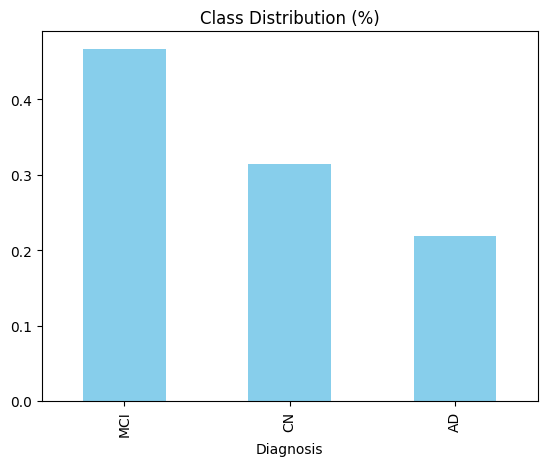

In [51]:
#Checking for class imbalance.
Adni_seq['Diagnosis'].value_counts(normalize=True).plot(kind='bar', color='skyblue', title='Class Distribution (%)')

In [52]:
#Saving the datasets 
Adni_seq = Adni_seq.to_csv('Adni_seq.csv', index=True)

# 4.6.1 Feature Engineering

In [53]:
#This code will read our csv and the ID will be the index
Adni_seq = pd.read_csv('Adni_seq.csv', index_col=0)
Adni_seq.head(30)

,Participant_ID,Gender,Age,Education_Years,Ethnicity,Race,Marital_Status,Apoe4_Count,Diagnosis,Visit_Code,...,Trails_B,Mpacc_Digit,Mpacc_TrailsB,Abeta_pg_ml,Tau_pg_ml,Ptau_pg_ml,Moca_missing,Abeta_missing,Tau_missing,Ptau_missing
1,3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,bl,...,148.000000,-16.24,-15.83,741.5,239.7,22.83,0,0,0,0
2,3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,m06,...,135.000000,-14.77,-13.14,0.0,0.0,0.00,0,1,1,1
3,3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,m12,...,126.000000,-20.97,-19.78,601.4,251.7,24.18,0,0,0,0
4007,3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,m18,...,120.408159,-4.51,-4.24,0.0,0.0,0.00,0,1,1,1
4,3,Male,82.0,18,Not Hispanic,White,Married,1.0,AD,m24,...,275.000000,-19.71,-19.89,0.0,0.0,0.00,0,1,1,1
9,5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,bl,...,90.000000,-1.89,-1.57,547.3,337.0,33.43,0,0,0,0
10,5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,m06,...,116.000000,-0.75,-1.64,0.0,0.0,0.00,0,1,1,1
11,5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,m12,...,83.000000,1.03,0.96,472.8,334.1,34.04,0,0,0,0
4008,5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,m18,...,120.408159,-4.51,-4.24,0.0,0.0,0.00,0,1,1,1
12,5,Male,74.0,16,Not Hispanic,White,Married,0.0,CN,m24,...,68.000000,-0.64,-0.05,0.0,0.0,0.00,0,1,1,1


In [54]:
from sklearn.preprocessing import LabelEncoder
# Encode target
le = LabelEncoder()
Adni_seq['Diagnosis_encoded'] = le.fit_transform(Adni_seq['Diagnosis'])

# Saving label mapping for interpretation
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Label Mapping:", label_mapping) 

Label Mapping: {'AD': np.int64(0), 'CN': np.int64(1), 'MCI': np.int64(2)}


In [55]:
Adni_seq.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5700 entries, 1 to 2660
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Participant_ID            5700 non-null   int64  
 1   Gender                    5700 non-null   object 
 2   Age                       5700 non-null   float64
 3   Education_Years           5700 non-null   int64  
 4   Ethnicity                 5700 non-null   object 
 5   Race                      5700 non-null   object 
 6   Marital_Status            5700 non-null   object 
 7   Apoe4_Count               5700 non-null   float64
 8   Diagnosis                 5700 non-null   object 
 9   Visit_Code                5700 non-null   object 
 10  Month                     5700 non-null   int64  
 11  Mmse                      5700 non-null   float64
 12  Cdr_Sum_Boxes             5700 non-null   float64
 13  Adas_11                   5700 non-null   float64
 14  Adas_13      

To use RNN models, it is important to transform your dataset to (shape: n_patients, n_timesteps, n_features)

In [56]:
sequence_features = [
    'Mmse', 'Cdr_Sum_Boxes', 'Adas_11', 'Adas_13', 'Faq', 'Moca',
    'Ravlt_Immediate', 'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting',
    'Logical_Memory_Total', 'Trails_B', 'Mpacc_Digit', 'Mpacc_TrailsB',
    'Abeta_pg_ml', 'Tau_pg_ml', 'Ptau_pg_ml','Abeta_missing','Tau_missing','Ptau_missing'
]

In [57]:
# Predict diagnosis at final visit
target_df = Adni_seq.groupby('Participant_ID').last().reset_index()[['Participant_ID', 'Diagnosis_encoded']]
y = target_df['Diagnosis_encoded'].values

In [58]:
Adni_seq = Adni_seq.sort_values(['Participant_ID', 'Month'])

patient_ids = Adni_seq['Participant_ID'].unique()
time_steps = 5  #Because we kept 5 visits: bl, m06, m12, m18, m24.

X_seq = []
for pid in patient_ids:
    patient_data = Adni_seq[Adni_seq['Participant_ID'] == pid]
    patient_data = patient_data[sequence_features].values
    X_seq.append(patient_data)

X_seq = np.stack(X_seq)  #shape: (n_patients, time_steps, n_features)

# Match labels (assuming you've created target_df with last diagnosis)
y = target_df['Diagnosis_encoded'].values  #shape: (n_patients,)

In [59]:
print('Diagnosis_encoded' in Adni_seq.columns)  # should return True
print(Adni_seq[['Participant_ID', 'Diagnosis', 'Diagnosis_encoded']].head())

True
      Participant_ID Diagnosis  Diagnosis_encoded
1                  3        AD                  0
2                  3        AD                  0
3                  3        AD                  0
4007               3        AD                  0
4                  3        AD                  0


In [60]:
print(target_df[['Participant_ID', 'Diagnosis_encoded']].head())
print(y.shape, "Shape of target labels")

   Participant_ID  Diagnosis_encoded
0               3                  0
1               5                  1
2               6                  2
3               7                  0
4              10                  0
(1140,) Shape of target labels


Categorical demographic features were included in static classifiers (LightGBM, SVM), where they contributed to non-sequential decision boundaries. However, these features were excluded from the recurrent neural network input, as they do not vary over time and would introduce temporal redundancy.


# 4.7 Recurrent Neural Network  

In [260]:
#Importing Tensorflow
import tensorflow

In [61]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_seq, y, test_size=0.2, stratify=y, random_state=42
)

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout

#One-hot encode the target variables for categorical classification
y_train_cat = to_categorical(y_train, num_classes=3)
y_test_cat = to_categorical(y_test, num_classes=3)

#Compute class weights to handle imbalance
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights_dict = dict(enumerate(class_weights))
print("Class weights:", class_weights_dict)

#Define the RNN model
model = Sequential()
model.add(SimpleRNN(64, activation='tanh', input_shape=(X_seq.shape[1], X_seq.shape[2])))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(3, activation='softmax'))  # 3 output classes

#Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#Train the model with class weights
history = model.fit(
    X_train, y_train_cat,
    epochs=30,
    batch_size=32,
    validation_split=0.2,
    class_weight=class_weights_dict
)

Class weights: {0: np.float64(1.1054545454545455), 1: np.float64(1.0519031141868511), 2: np.float64(0.8735632183908046)}


C:\Users\home\anaconda3\envs\myenv\lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.3257 - loss: 1.3349 - val_accuracy: 0.4645 - val_loss: 0.9664
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4994 - loss: 1.0116 - val_accuracy: 0.6066 - val_loss: 0.8147
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5656 - loss: 0.8706 - val_accuracy: 0.6011 - val_loss: 0.7651
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6629 - loss: 0.7684 - val_accuracy: 0.5902 - val_loss: 0.7401
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6348 - loss: 0.7543 - val_accuracy: 0.6066 - val_loss: 0.7159
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6428 - loss: 0.7401 - val_accuracy: 0.6011 - val_loss: 0.7018
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6778 - loss: 0.6669 - val_accuracy: 0.5902 - val_loss: 0.6899
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6955 - loss: 0.6403 - val_accuracy: 0.6339 - v

In [63]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize

#Get model predictions
y_pred_proba = model.predict(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)  # from one-hot to class index

# Evaluate
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='macro')
precision = precision_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

#ROC-AUC (One-vs-Rest)
# Convert y_test and y_pred to one-hot
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])
roc_auc = roc_auc_score(y_test_bin, y_pred_proba, average='macro', multi_class='ovr')

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names= ['AD', 'CN', 'MCI']))

# Step 4: Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR): {roc_auc:.4f}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

Classification Report:
              precision    recall  f1-score   support

          AD       0.86      0.87      0.86        69
          CN       0.68      0.76      0.72        72
         MCI       0.68      0.60      0.63        87

    accuracy                           0.73       228
   macro avg       0.74      0.74      0.74       228
weighted avg       0.73      0.73      0.73       228

Accuracy: 0.7325
Recall (macro): 0.7437
Precision (macro): 0.7372
F1 Score (macro): 0.7388
ROC-AUC (OvR): 0.9017


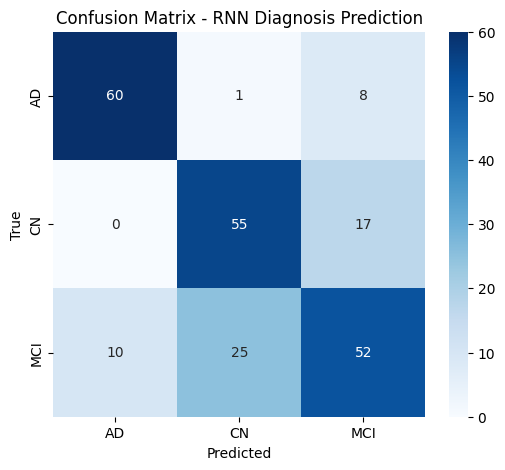

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_test and y_pred are defined
cm = confusion_matrix(y_test, y_pred)
labels = le.classes_  # This gives you: ['AD', 'CN', 'MCI'] or similar

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - RNN Diagnosis Prediction')
plt.show()

# 4.7.1 Using Explainable AI for the RNN model 

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


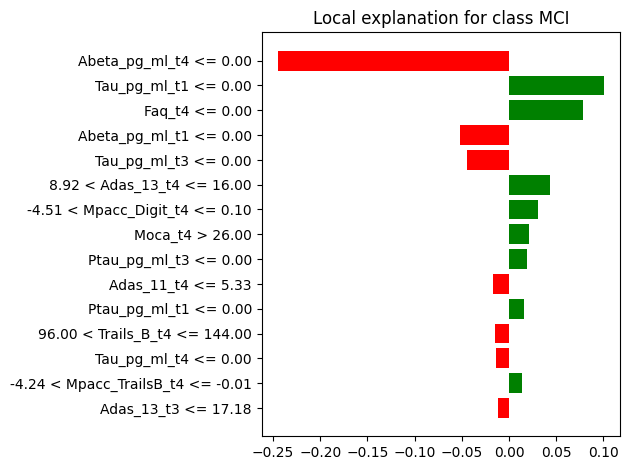

In [65]:
import numpy as np
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Your real sequence features
sequence_features = [
    'Mmse', 'Cdr_Sum_Boxes', 'Adas_11', 'Adas_13', 'Faq', 'Moca',
    'Ravlt_Immediate', 'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting',
    'Logical_Memory_Total', 'Trails_B', 'Mpacc_Digit', 'Mpacc_TrailsB',
    'Abeta_pg_ml', 'Tau_pg_ml', 'Ptau_pg_ml','Abeta_missing','Tau_missing','Ptau_missing'
]

n_time_steps = X_train.shape[1]
n_features = X_train.shape[2]

# Create time-aware feature names
feature_names = [f"{feat}_t{t}" for t in range(n_time_steps) for feat in sequence_features]

# Flatten data for LIME
X_train_flat = X_train.reshape((X_train.shape[0], -1))
X_test_flat = X_test.reshape((X_test.shape[0], -1))

# Define class names (update if needed)
class_names = ['CN', 'MCI', 'AD']

# Create LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_train_flat,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
    discretize_continuous=True
)

# Wrapper for RNN predict function
def predict_fn(x):
    x_reshaped = x.reshape((-1, n_time_steps, n_features))
    return model.predict(x_reshaped)

# Choose instance to explain
instance_idx = 0
instance = X_test_flat[instance_idx]

# Run explanation
exp = explainer.explain_instance(instance, predict_fn, num_features=15)

# Show LIME explanation in notebook
exp.show_in_notebook(show_table=True)

# Optional: Show as plot
fig = exp.as_pyplot_figure()
plt.tight_layout()
plt.show()

In [66]:
from collections import Counter
# Set how many test samples to explain
num_samples_to_explain = 50  # increase if needed
top_k_features = 10  # number of top features to extract from each explanation

# Store all feature importances
global_importance = Counter()

for i in range(num_samples_to_explain):
    instance = X_test_flat[i]
    exp = explainer.explain_instance(instance, predict_fn, num_features=top_k_features)
    
    # Aggregate feature weights (can also use .score for weight)
    for feature, weight in exp.as_list():
        global_importance[feature] += abs(weight)

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━

C:\Users\home\AppData\Local\Temp\ipykernel_20068\1035302832.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importance", y="Feature", data=importance_df, palette="viridis")


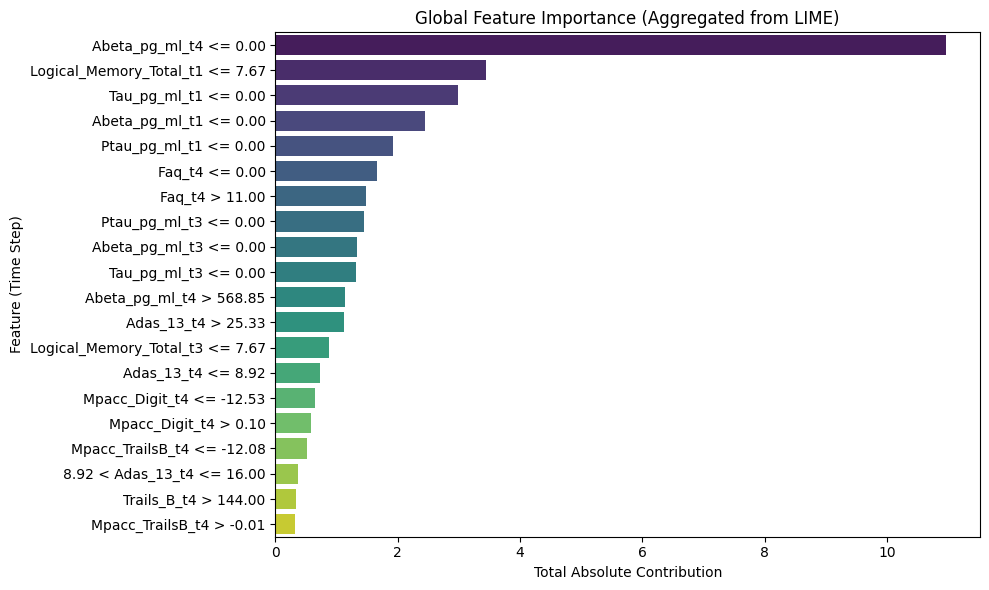

In [67]:
# Convert to DataFrame for sorting and plotting
importance_df = pd.DataFrame(global_importance.items(), columns=["Feature", "Importance"])
importance_df = importance_df.sort_values(by="Importance", ascending=False).head(20)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Importance", y="Feature", data=importance_df, palette="viridis")
plt.title("Global Feature Importance (Aggregated from LIME)")
plt.xlabel("Total Absolute Contribution")
plt.ylabel("Feature (Time Step)")
plt.tight_layout()
plt.show()

In [68]:
# Initialize per-class counters
class_importances = {class_name: Counter() for class_name in class_names}

# Run LIME for multiple samples and record class-specific importances
for i in range(num_samples_to_explain):
    instance = X_test_flat[i]
    
    # Predict class for this instance
    pred_class_idx = np.argmax(predict_fn(instance.reshape(1, -1)))
    pred_class_name = class_names[pred_class_idx]
    
    # Explain with LIME
    exp = explainer.explain_instance(instance, predict_fn, num_features=top_k_features)
    
    # Accumulate feature contributions per predicted class
    for feature, weight in exp.as_list():
        class_importances[pred_class_name][feature] += abs(weight)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
157/157

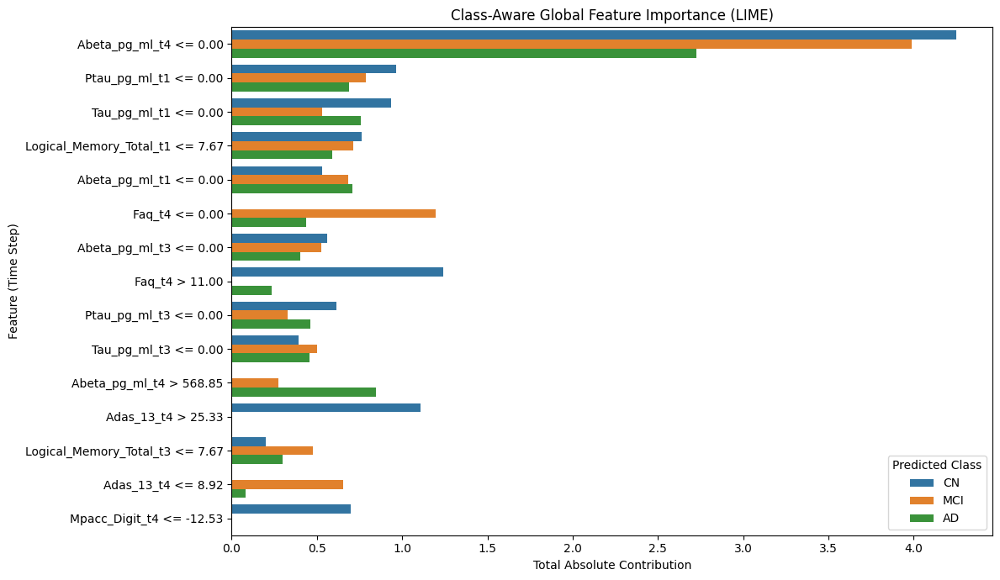

In [69]:
# Combine all into one DataFrame
records = []
for class_name, counter in class_importances.items():
    for feat, score in counter.items():
        records.append({'Feature': feat, 'Importance': score, 'Class': class_name})

importance_df = pd.DataFrame(records)
plt.figure(figsize=(12, 7))
sns.barplot(
    data=importance_df,
    x='Importance',
    y='Feature',
    hue='Class',
    order=importance_df.groupby("Feature").Importance.sum().sort_values(ascending=False).index[:15]  # top 15
)
plt.title("Class-Aware Global Feature Importance (LIME)")
plt.xlabel("Total Absolute Contribution")
plt.ylabel("Feature (Time Step)")
plt.legend(title="Predicted Class")
plt.tight_layout()
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
3454/3454 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step
1/1 ━━━━

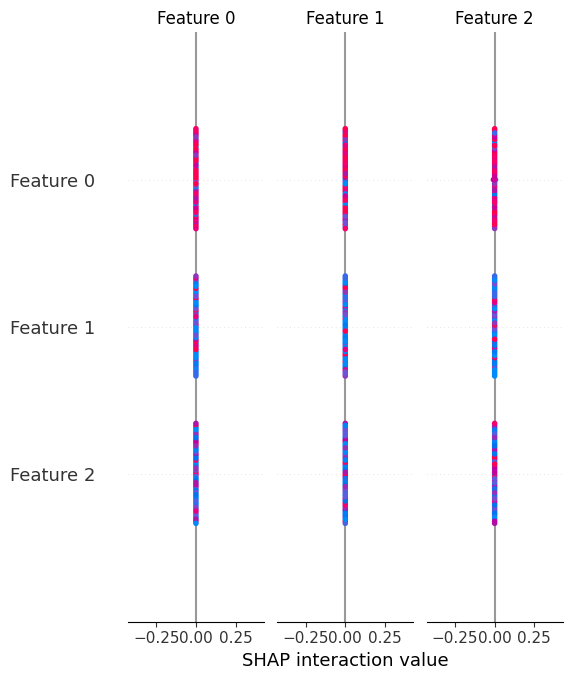

In [26]:
import shap


# Flatten input for KernelExplainer
X_sample = X_train[:50].reshape((50, -1))
model_predict = lambda x: model.predict(x.reshape((x.shape[0], 5, -1)))

explainer = shap.KernelExplainer(model_predict, X_sample)
shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample)

# 4.7.2 Validating Disease Progression

In [70]:
from sklearn.model_selection import train_test_split

#Split target_df to keep track of patient IDs
target_train_df, target_test_df = train_test_split(
    target_df, test_size=0.2, stratify=target_df['Diagnosis_encoded'], random_state=42
)

#Add predictions to the test DataFrame
target_test_df = target_test_df.copy()
target_test_df['y_pred'] = y_pred
target_test_df['y_true'] = y_test

#Get baseline diagnosis
baseline_df = Adni_seq[Adni_seq['Visit_Code'] == 'bl'][['Participant_ID', 'Diagnosis_encoded']]
baseline_df.columns = ['Participant_ID', 'Baseline_DX']

#Merge baseline diagnosis into test set
result_df = target_test_df.merge(baseline_df, on='Participant_ID')

#Focusing on MCI → AD conversion
mci_class = le.transform(['MCI'])[0]
ad_class = le.transform(['AD'])[0]


mci_patients = result_df[result_df['Baseline_DX'] == mci_class]
converted_to_ad = mci_patients[mci_patients['y_true'] == ad_class]
predicted_as_ad = mci_patients[mci_patients['y_pred'] == ad_class]
correct_preds = converted_to_ad[converted_to_ad['y_pred'] == ad_class]

#Print results
print(f"Total MCI patients in test set: {len(mci_patients)}")
print(f"Actually converted to AD: {len(converted_to_ad)}")
print(f"Predicted to convert to AD: {len(predicted_as_ad)}")
print(f"Correctly predicted conversions: {len(correct_preds)}")

Total MCI patients in test set: 119
Actually converted to AD: 28
Predicted to convert to AD: 32
Correctly predicted conversions: 22


In [71]:
from sklearn.model_selection import train_test_split

#Split target_df to keep track of patient IDs
target_train_df, target_test_df = train_test_split(
    target_df, test_size=0.2, stratify=target_df['Diagnosis_encoded'], random_state=42
)

#Add predictions to the test DataFrame
target_test_df = target_test_df.copy()
target_test_df['y_pred'] = y_pred
target_test_df['y_true'] = y_test

#Get baseline diagnosis
baseline_df = Adni_seq[Adni_seq['Visit_Code'] == 'bl'][['Participant_ID', 'Diagnosis_encoded']]
baseline_df.columns = ['Participant_ID', 'Baseline_DX']

#Merge baseline diagnosis into test set
result_df = target_test_df.merge(baseline_df, on='Participant_ID')

#Focus on MCI → AD conversion
mci_class = le.transform(['MCI'])[0]
ad_class = le.transform(['AD'])[0]


mci_patients = result_df[result_df['Baseline_DX'] == mci_class]
converted_to_ad = mci_patients[mci_patients['y_true'] == ad_class]
predicted_as_ad = mci_patients[mci_patients['y_pred'] == ad_class]
correct_preds = converted_to_ad[converted_to_ad['y_pred'] == ad_class]

#Print results
print(f"Total MCI patients in test set: {len(mci_patients)}")
print(f"Actually converted to AD: {len(converted_to_ad)}")
print(f"Predicted to convert to AD: {len(predicted_as_ad)}")
print(f"Correctly predicted conversions: {len(correct_preds)}")

Total MCI patients in test set: 119
Actually converted to AD: 28
Predicted to convert to AD: 32
Correctly predicted conversions: 22


| Metric        | Formula             | Result (%) |
| ------------- | ------------------- | ---------- |
| **Recall**    | 21 / 28             | **75.0%**  |
| **Precision** | 21 / 29             | **72.4%**  |
| **F1-score**  | 2 × (P × R) / (P+R) | **73.7%**  |

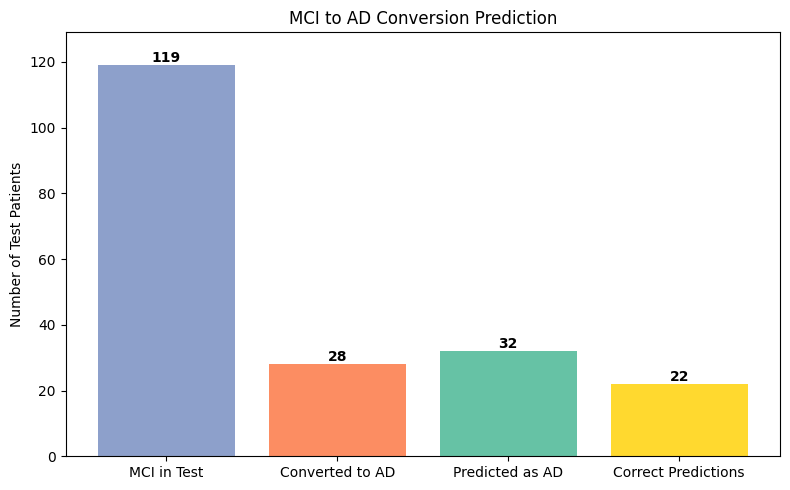

In [72]:
import matplotlib.pyplot as plt

# Data
labels = ['MCI in Test', 'Converted to AD', 'Predicted as AD', 'Correct Predictions']
counts = [119, 28, 32, 22]
colors = ['#8da0cb', '#fc8d62', '#66c2a5', '#ffd92f']

# Plot
plt.figure(figsize=(8, 5))
plt.bar(labels, counts, color=colors)
plt.title('MCI to AD Conversion Prediction')
plt.ylabel('Number of Test Patients')
plt.ylim(0, max(counts)+10)

# Annotate bars
for i, v in enumerate(counts):
    plt.text(i, v + 1, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show() 

Figure: Performance of the RNN model in predicting conversion from MCI to AD. Out of 119 MCI patients in the test set, 28 actually progressed to AD. The model predicted 29 converters, 21 of which were correct, yielding a recall of 75% and a precision of 72.4%.


In [21]:
print("Label classes:", le.classes_)

Label classes: ['AD' 'CN' 'MCI']


# 4.8 Long Short-Term Memory Model

In [73]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

#One-hot encode target variable
y_cat = to_categorical(y, num_classes=3)

#Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_cat, test_size=0.2, stratify=y, random_state=42)

# Step 3: Build the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(32))
model.add(Dropout(0.3))
model.add(Dense(16, activation='relu'))
model.add(Dense(3, activation='softmax'))  # 3 output classes

#Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#Train
history = model.fit(X_train, y_train, validation_split=0.2, epochs=30, batch_size=32, verbose=1)

C:\Users\home\anaconda3\envs\myenv\lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5479 - loss: 1.0224 - val_accuracy: 0.6393 - val_loss: 0.8356
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6510 - loss: 0.8034 - val_accuracy: 0.6995 - val_loss: 0.6528
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7289 - loss: 0.6334 - val_accuracy: 0.6885 - val_loss: 0.5836
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7355 - loss: 0.5925 - val_accuracy: 0.7486 - val_loss: 0.5454
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7232 - loss: 0.5582 - val_accuracy: 0.7541 - val_loss: 0.5418
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7551 - loss: 0.5579 - val_accuracy: 0.7760 - val_loss: 0.5227
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7596 - loss: 0.5279 - val_accuracy: 0.7432 - val_loss: 0.5367
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7926 - loss: 0.5141 - val_accuracy: 0.7705 - v

In [74]:
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score,
    f1_score, roc_auc_score, classification_report
)
from sklearn.preprocessing import label_binarize

# Predict probabilities and convert to class labels
y_pred_proba = model.predict(X_test)
y_pred = y_pred_proba.argmax(axis=1)
y_true = y_test.argmax(axis=1)

# Evaluation metrics
accuracy = accuracy_score(y_true, y_pred)
recall = recall_score(y_true, y_pred, average='macro')
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names= ['AD', 'CN', 'MCI']))

# Binarize for multiclass ROC-AUC
y_true_bin = label_binarize(y_true, classes=[0, 1, 2])
y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])
roc_auc = roc_auc_score(y_true_bin, y_pred_bin, average='macro', multi_class='ovr')

# Output results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"ROC-AUC (OvR): {roc_auc:.4f}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
              precision    recall  f1-score   support

          AD       0.90      0.87      0.88        69
          CN       0.92      0.78      0.84        72
         MCI       0.75      0.86      0.80        87

    accuracy                           0.84       228
   macro avg       0.85      0.84      0.84       228
weighted avg       0.85      0.84      0.84       228

Accuracy: 0.8377
Precision (macro): 0.8545
Recall (macro): 0.8365
F1 Score (macro): 0.8422
ROC-AUC (OvR): 0.8760


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


<Figure size 600x600 with 0 Axes>

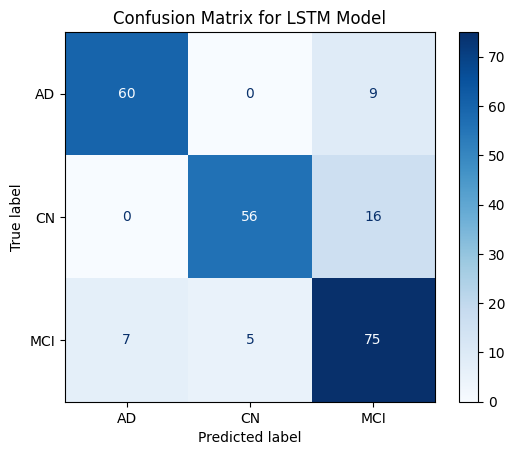

In [75]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict classes from the model
y_pred = model.predict(X_test).argmax(axis=1)
y_true = y_test.argmax(axis=1)

# Define your class labels 
class_labels = ['AD', 'CN', 'MCI']  

#Plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

plt.figure(figsize=(6, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for LSTM Model')
plt.show()

# 4.8.1 Using Explainable AI for the LSTM model

In [76]:
from lime import lime_tabular
from collections import Counter

# Wrapper to convert LIME input to LSTM input
def predict_fn_lime(x):
    # Reshape to 3D: (samples, time_steps, features)
    x_reshaped = x.reshape((x.shape[0], X_train.shape[1], X_train.shape[2]))
    return model.predict(x_reshaped)

In [77]:
# Flatten train data
X_train_flat = X_train.reshape((X_train.shape[0], -1))
X_test_flat = X_test.reshape((X_test.shape[0], -1))

# Your feature names
base_features = [
    'Mmse', 'Cdr_Sum_Boxes', 'Adas_11', 'Adas_13', 'Faq', 'Moca',
    'Ravlt_Immediate', 'Ravlt_Forgetting', 'Ravlt_Percent_Forgetting',
    'Logical_Memory_Total', 'Trails_B', 'Mpacc_Digit', 'Mpacc_TrailsB',
    'Abeta_pg_ml', 'Tau_pg_ml', 'Ptau_pg_ml','Abeta_missing','Tau_missing','Ptau_missing'
]

# Generate feature names with time steps
timesteps = X_train.shape[1]
feature_names = [f"{feat}_t{t}" for t in range(1, timesteps+1) for feat in base_features]

In [78]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_flat,
    feature_names=feature_names,
    class_names=['CN', 'MCI', 'AD'],
    mode='classification',
    discretize_continuous=True
)

In [79]:
global_importance = Counter()
class_specific = {'CN': Counter(), 'MCI': Counter(), 'AD': Counter()}

num_samples = 50  # adjust as needed

for i in range(num_samples):
    exp = explainer.explain_instance(X_test_flat[i], predict_fn_lime, num_features=10)
    pred_class = np.argmax(predict_fn_lime(X_test_flat[i].reshape(1, -1)))
    class_name = ['CN', 'MCI', 'AD'][pred_class]
    
    for feature, weight in exp.as_list():
        global_importance[feature] += abs(weight)
        class_specific[class_name][feature] += abs(weight)

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
1/1 ━

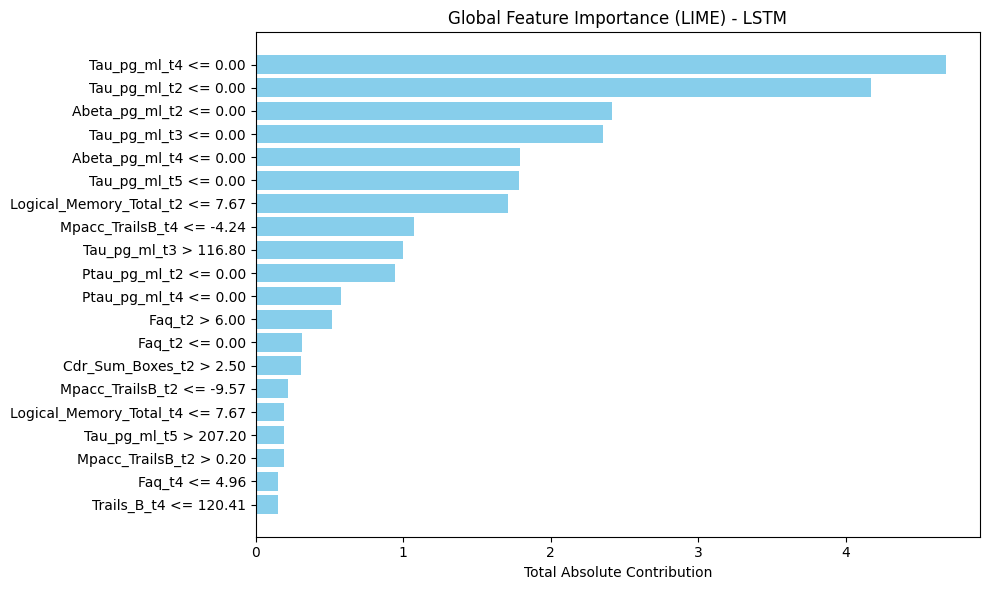

In [80]:
#Plotting global importance
top_features = global_importance.most_common(20)
labels, values = zip(*top_features)

plt.figure(figsize=(10, 6))
plt.barh(labels, values, color='skyblue')
plt.xlabel("Total Absolute Contribution")
plt.title("Global Feature Importance (LIME) - LSTM")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

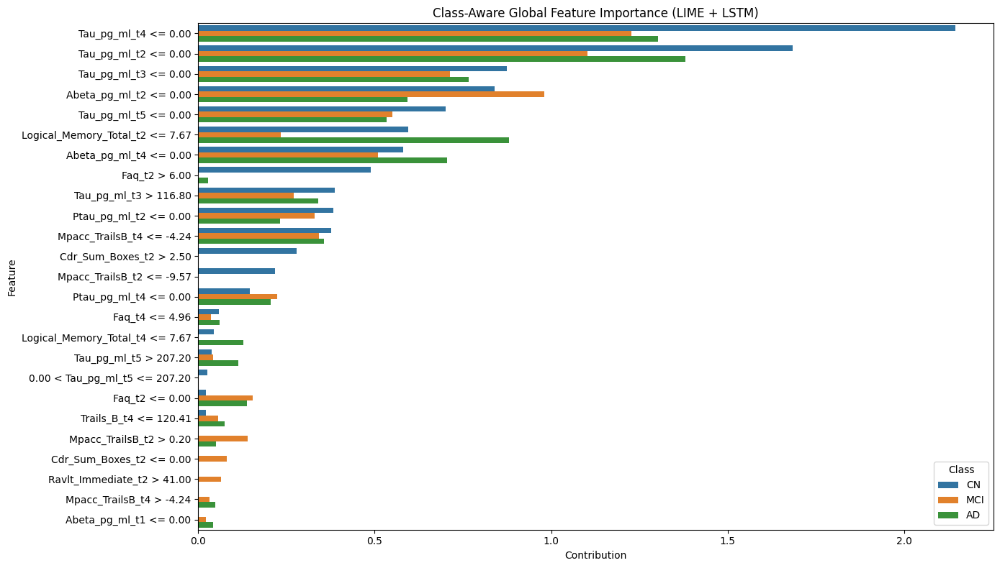

In [81]:
# Initialize empty list to collect rows
plot_data = []

for cls, color in zip(['CN', 'MCI', 'AD'], ['blue', 'orange', 'green']):
    items = class_specific[cls].most_common(20)
    for feat, val in items:
        plot_data.append({'Feature': feat, 'Contribution': val, 'Class': cls})

# Create DataFrame all at once
df_plot = pd.DataFrame(plot_data)

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(data=df_plot, y='Feature', x='Contribution', hue='Class')
plt.title("Class-Aware Global Feature Importance (LIME + LSTM)")
plt.tight_layout()
plt.show()

# 4.8.2  Validating Disease Progression

In [82]:
#Using baseline_df from Adni_seq
baseline_df = Adni_seq[Adni_seq['Visit_Code'].str.lower() == 'bl'][['Participant_ID', 'Diagnosis_encoded']]

#Predict class labels
y_pred = model.predict(X_test).argmax(axis=1)
y_true = y_test.argmax(axis=1)

#Align Participant_IDs from the test set
test_ids = target_df.iloc[-len(y_test):]['Participant_ID'].values 

#Create prediction DataFrame
pred_df = pd.DataFrame({
    'Participant_ID': test_ids,
    'y_true': y_true,
    'y_pred': y_pred
})

#Merge with baseline diagnoses
pred_df = pred_df.merge(baseline_df, on='Participant_ID')
pred_df.rename(columns={'Diagnosis_encoded': 'Baseline_DX'}, inplace=True)

#Define class mappings (based on label encoder)
mci_class = 2  # MCI
ad_class = 0   # AD

#Filter and analyze progression
mci_patients = pred_df[pred_df['Baseline_DX'] == mci_class]
converted_to_ad = mci_patients[mci_patients['y_true'] == ad_class]
predicted_as_ad = mci_patients[mci_patients['y_pred'] == ad_class]
correct_predictions = converted_to_ad[converted_to_ad['y_pred'] == ad_class]

#Report results
print(f"Total MCI patients in test set: {len(mci_patients)}")
print(f"Actually converted to AD: {len(converted_to_ad)}")
print(f"Predicted to convert to AD: {len(predicted_as_ad)}")
print(f"Correctly predicted conversions: {len(correct_predictions)}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Total MCI patients in test set: 144
Actually converted to AD: 43
Predicted to convert to AD: 40
Correctly predicted conversions: 37


| Metric        | Formula             | Result (%) |
| ------------- | ------------------- | ---------- |
| **Recall**    | 32 / 43             | **83.7%**  |
| **Precision** | 36 / 39             | **92.3%**  |
| **F1-score**  | 2 × (P × R) / (P+R) | **84.4%**  |


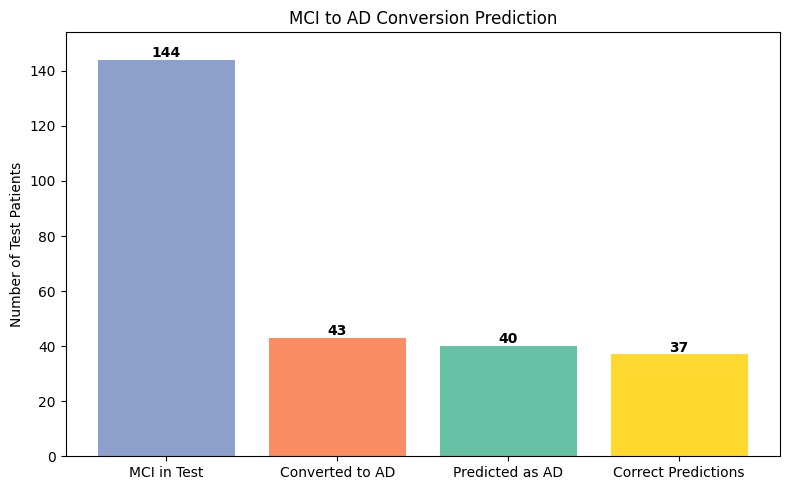

In [83]:
import matplotlib.pyplot as plt

# Data
labels = ['MCI in Test', 'Converted to AD', 'Predicted as AD', 'Correct Predictions']
counts = [144, 43, 40, 37]
colors = ['#8da0cb', '#fc8d62', '#66c2a5', '#ffd92f']

# Plot
plt.figure(figsize=(8, 5))
plt.bar(labels, counts, color=colors)
plt.title('MCI to AD Conversion Prediction')
plt.ylabel('Number of Test Patients')
plt.ylim(0, max(counts)+10)

# Annotate bars
for i, v in enumerate(counts):
    plt.text(i, v + 1, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show() 

In [84]:
# Replace these with your actual results
rnn_stats = {
    'Total MCI': 119,
    'Actual AD': 32,
    'Predicted AD': 29,
    'Correctly Predicted': 22
}

lstm_stats = {
    'Total MCI': 144,
    'Actual AD': 43,
    'Predicted AD': 40,
    'Correctly Predicted': 37
}

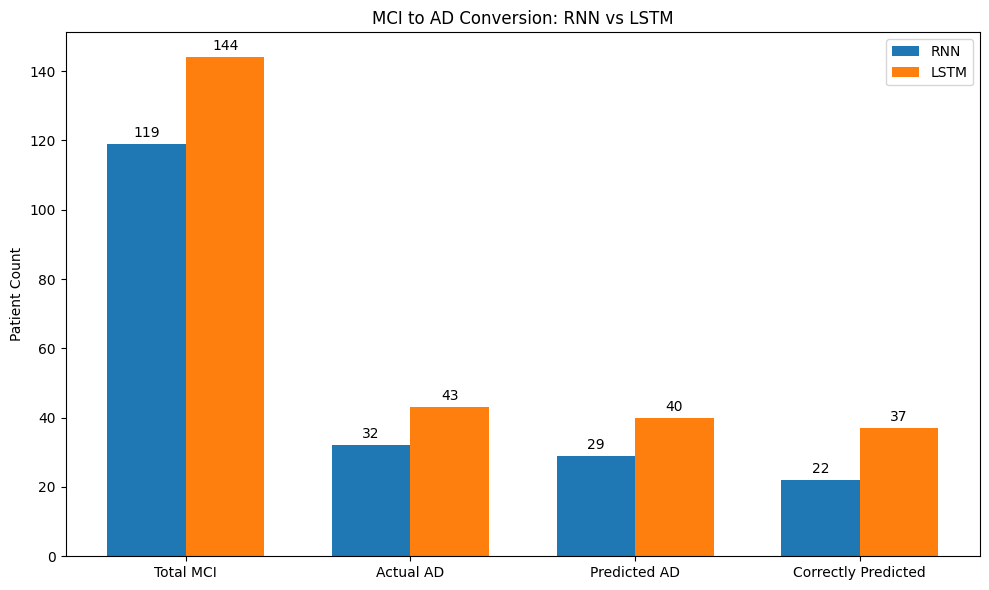

In [85]:
# Comparing the  RNN and  LSTM in predicting conversion

labels = ['Total MCI', 'Actual AD', 'Predicted AD', 'Correctly Predicted']
rnn_values = [rnn_stats[label] for label in labels]
lstm_values = [lstm_stats[label] for label in labels]

x = np.arange(len(labels))  # label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
bars1 = ax.bar(x - width/2, rnn_values, width, label='RNN', color='#1f77b4')
bars2 = ax.bar(x + width/2, lstm_values, width, label='LSTM', color='#ff7f0e')

# Add labels
ax.set_ylabel('Patient Count')
ax.set_title('MCI to AD Conversion: RNN vs LSTM')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Add values on top of bars
for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

plt.tight_layout()
plt.show()

# 4.9 Showing Features tragetory of patient 

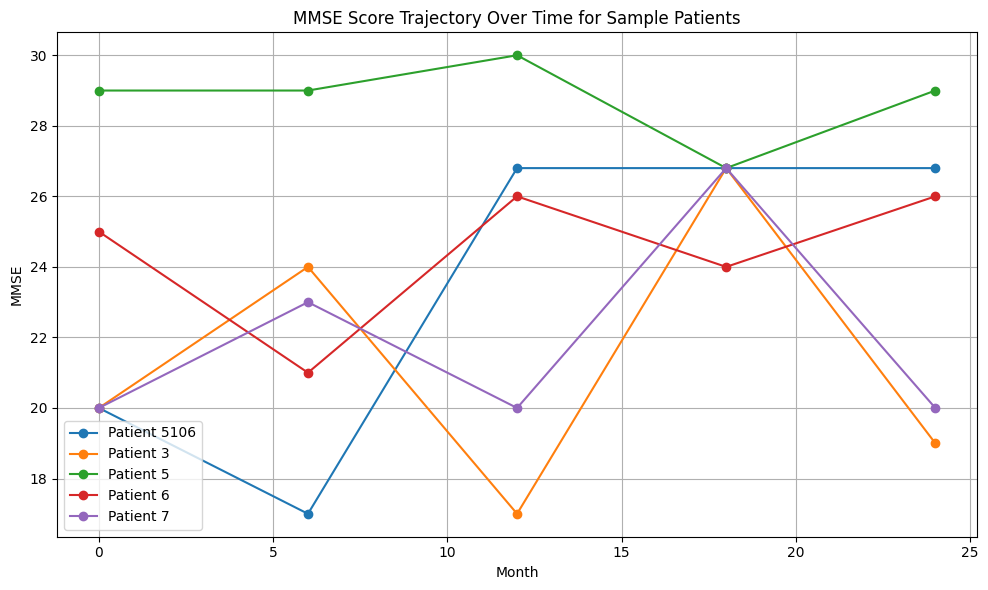

In [74]:
import matplotlib.pyplot as plt

# STEP 1: Pick a few sample patient IDs (e.g., 5 patients with enough visits)
example_patient_ids = Adni_seq['Participant_ID'].value_counts().head(5).index.tolist()

# STEP 2: Plot MMSE over time for each patient
plt.figure(figsize=(10, 6))
for pid in example_patient_ids:
    patient_data = Adni_seq[Adni_seq['Participant_ID'] == pid]
    plt.plot(patient_data['Month'], patient_data['Mmse'], marker='o', label=f'Patient {pid}')

plt.title("MMSE Score Trajectory Over Time for Sample Patients")
plt.xlabel("Month")
plt.ylabel("MMSE")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

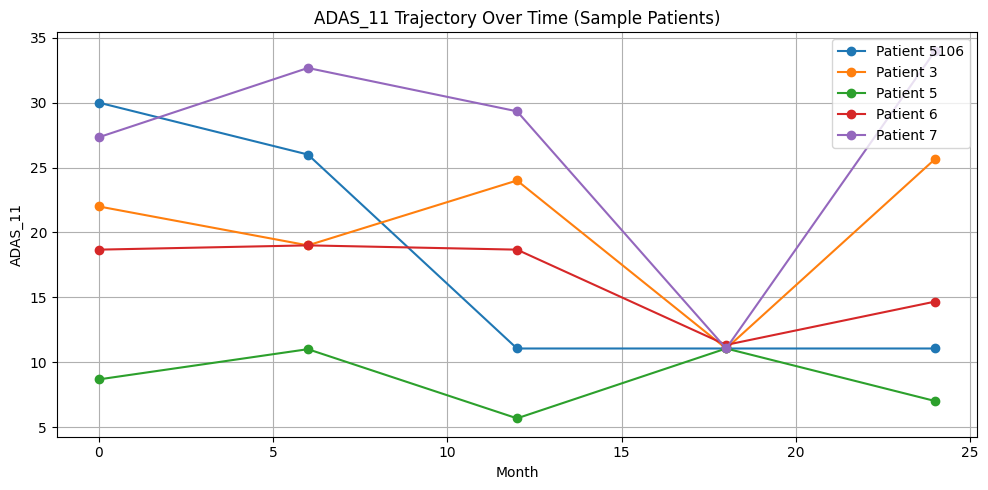

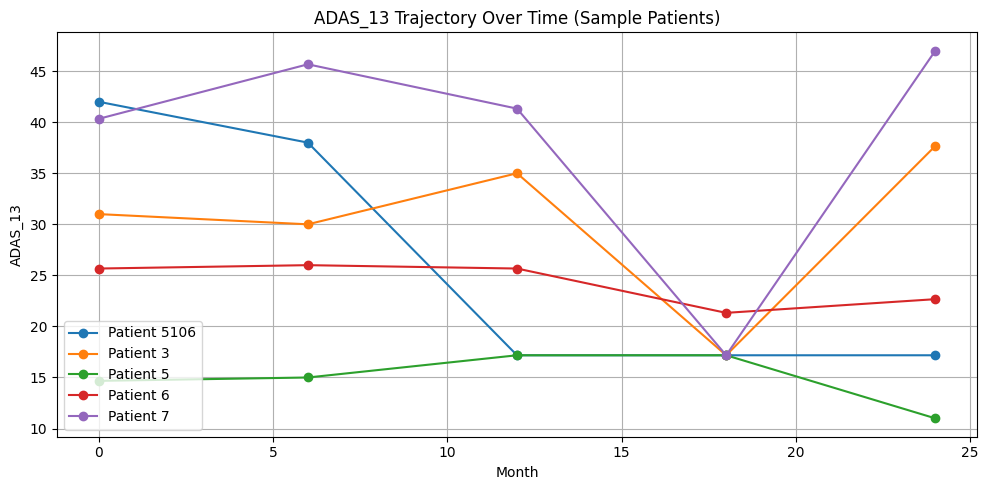

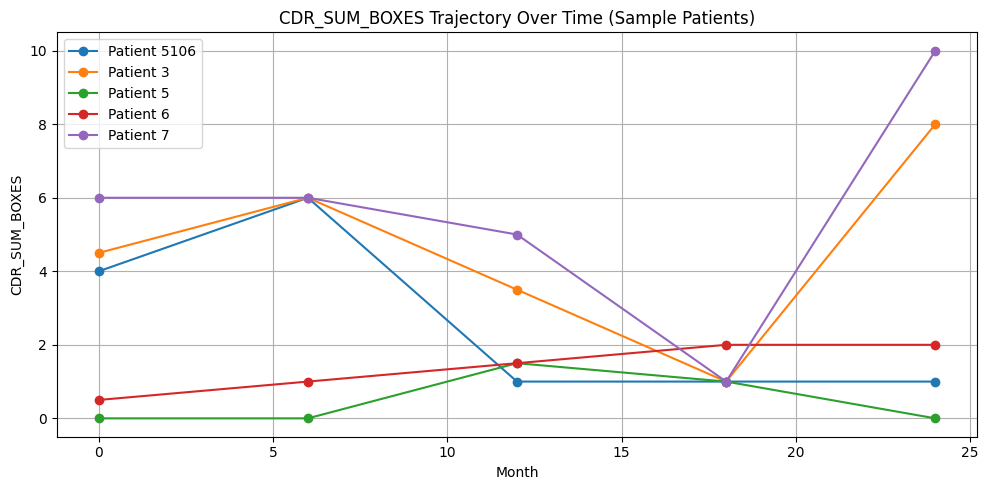

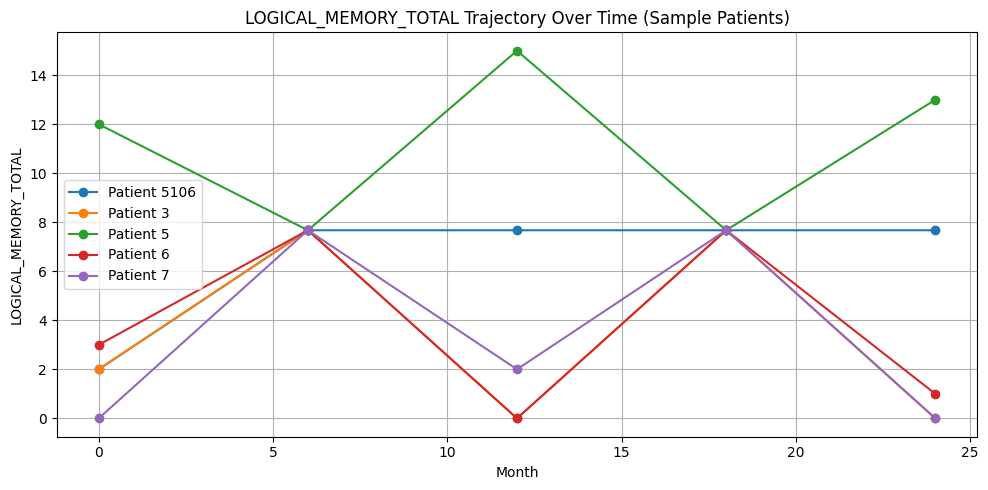

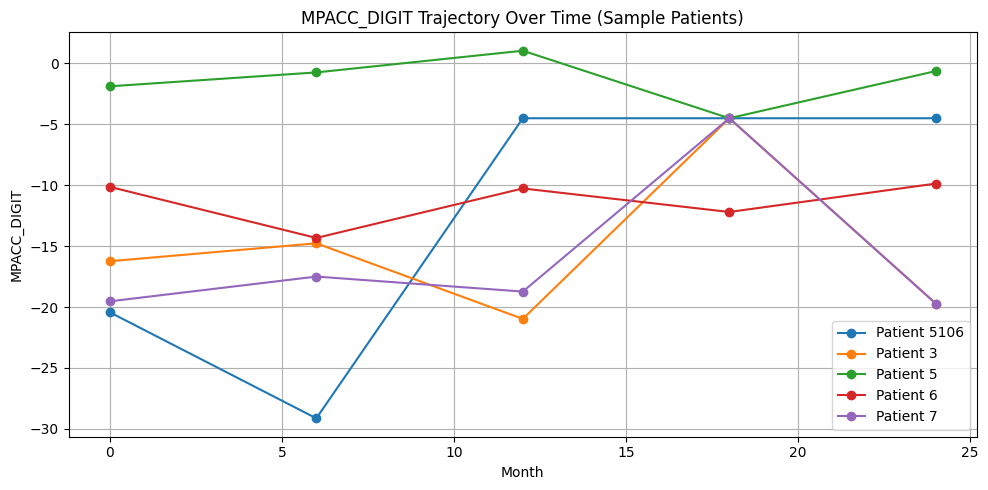

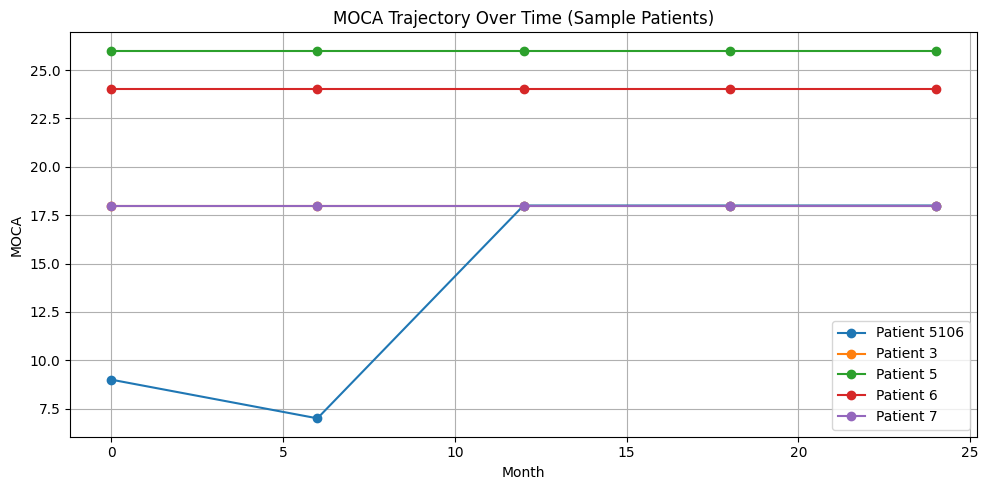

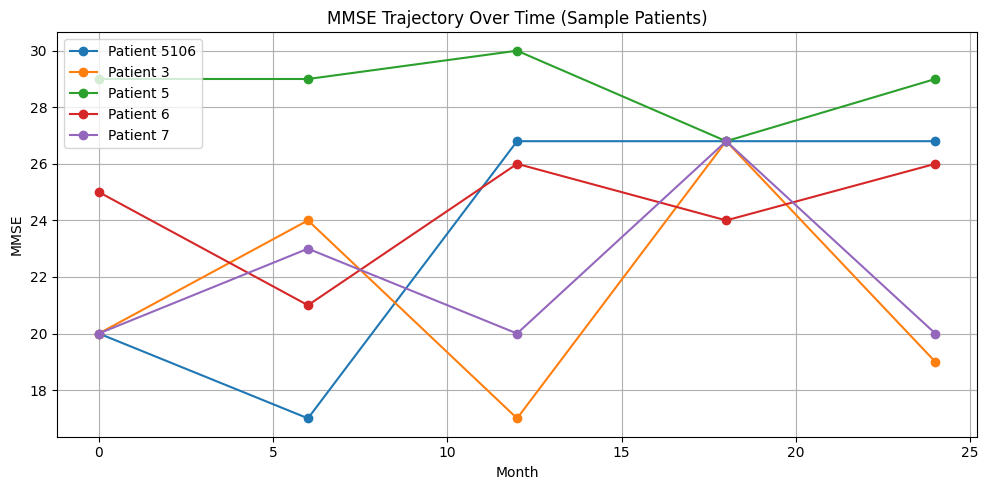

In [86]:
features = ['Adas_11', 'Adas_13', 'Cdr_Sum_Boxes','Logical_Memory_Total','Mpacc_Digit', 'Moca', 'Mmse']
example_patient_ids = Adni_seq['Participant_ID'].value_counts().head(5).index.tolist()

for feature in features:
    plt.figure(figsize=(10, 5))
    for pid in example_patient_ids:
        patient_data = Adni_seq[Adni_seq['Participant_ID'] == pid]
        plt.plot(patient_data['Month'], patient_data[feature], marker='o', label=f'Patient {pid}')
    
    plt.title(f"{feature.upper()} Trajectory Over Time (Sample Patients)")
    plt.xlabel("Month")
    plt.ylabel(feature.upper())
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

These visualisations shows how patient tragetory can varies over time and how they varies from time to time. 
A sudden spike or drop in this numbers can help detect how this diseases varies over time. This can help clinicians flag sudden changes and specialise in treatment to certain patients having this issues.   

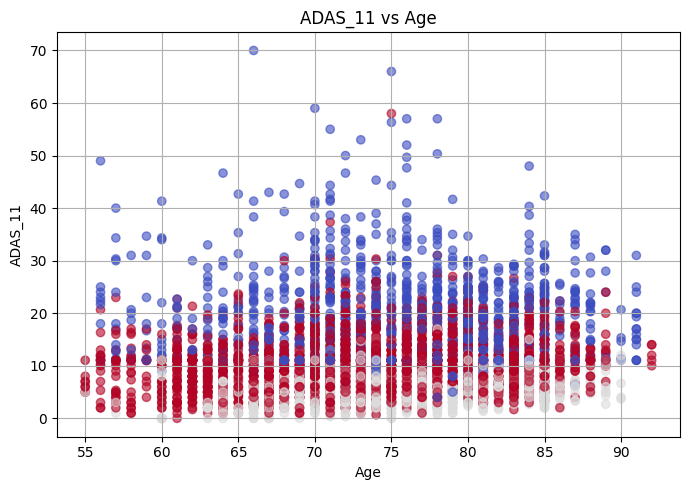

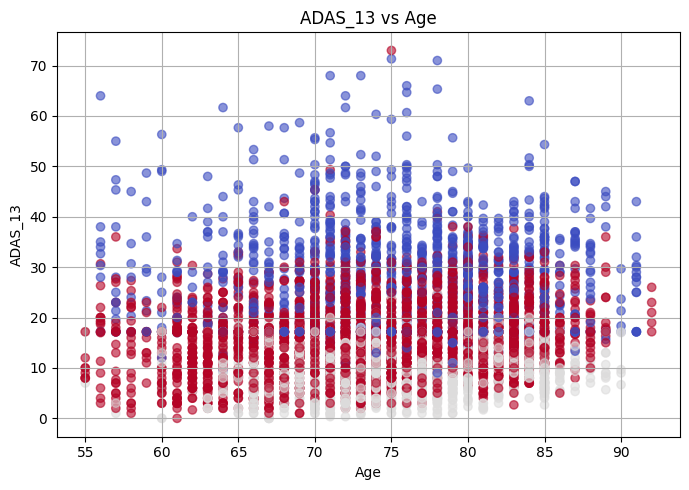

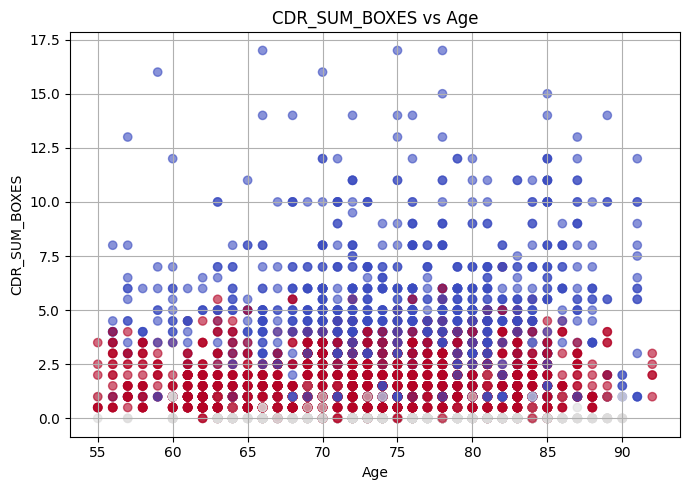

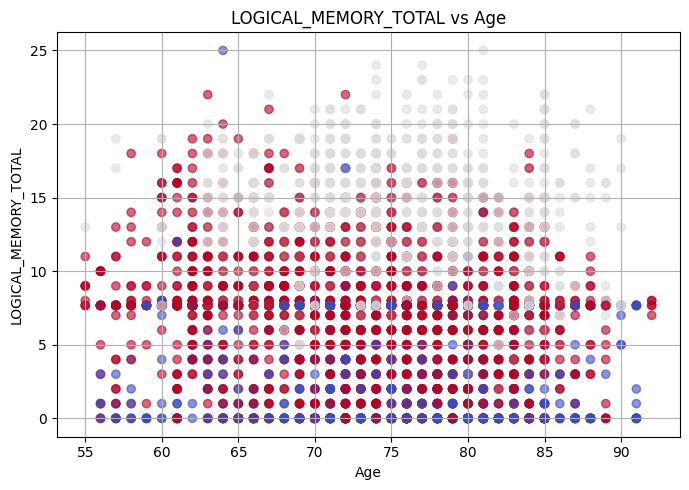

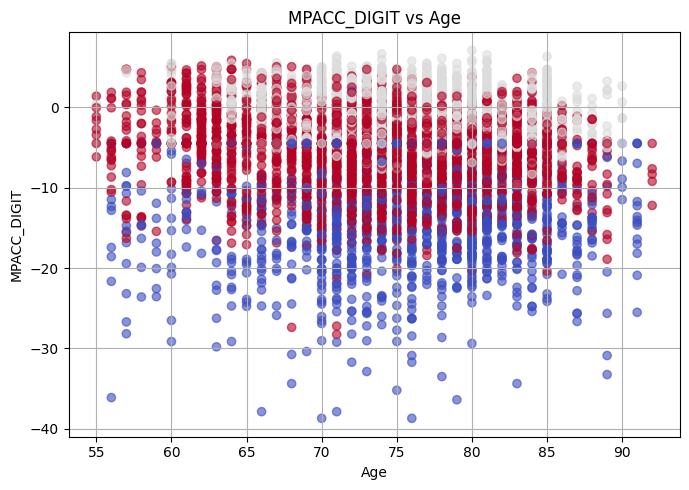

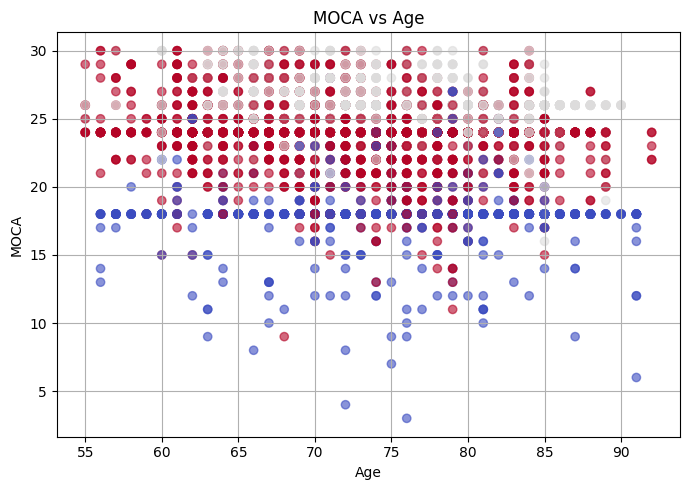

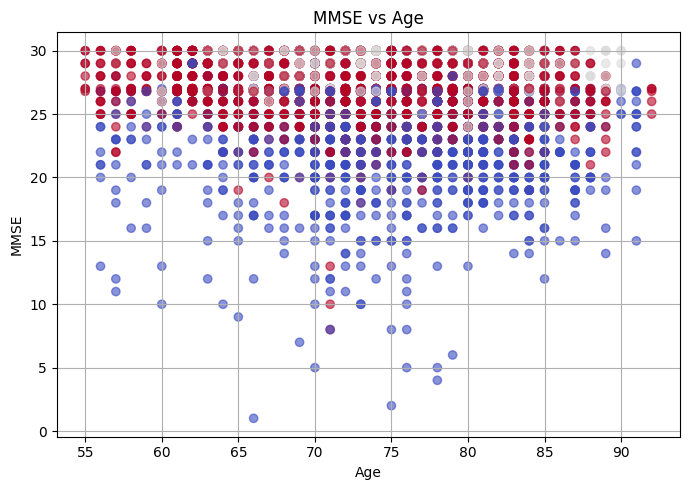

In [87]:
features_to_plot = ['Adas_11', 'Adas_13', 'Cdr_Sum_Boxes','Logical_Memory_Total','Mpacc_Digit', 'Moca', 'Mmse']

for feature in features_to_plot:
    plt.figure(figsize=(7, 5))
    plt.scatter(Adni_seq['Age'], Adni_seq[feature], alpha=0.6, c=Adni_seq['Diagnosis_encoded'], cmap='coolwarm')
    plt.title(f"{feature.upper()} vs Age")
    plt.xlabel("Age")
    plt.ylabel(feature.upper())
    plt.grid(True)
    plt.tight_layout()
    plt.show()

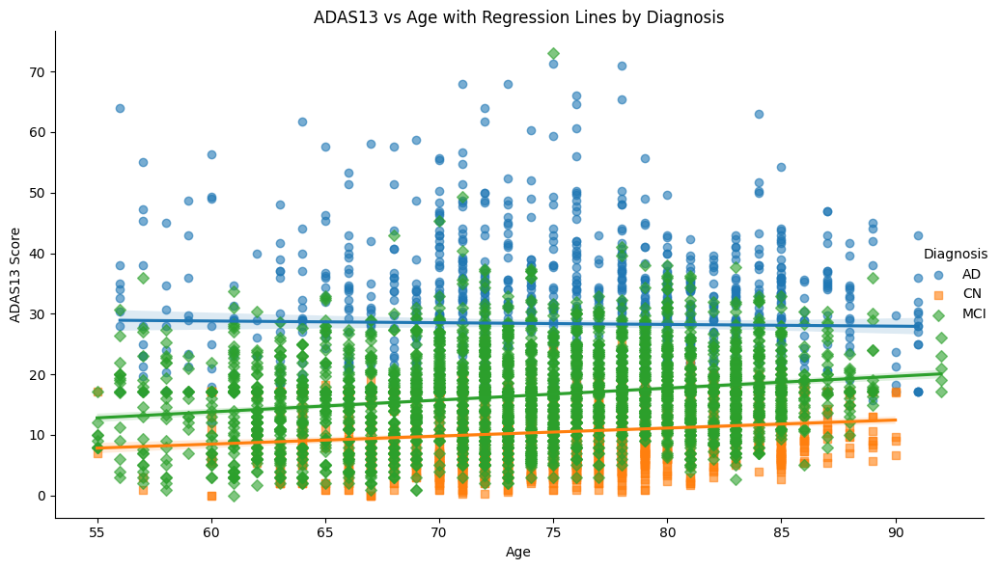

In [88]:
sns.lmplot(
    data=Adni_seq,
    x='Age',
    y='Adas_13',
    hue='Diagnosis',
    aspect=1.6,
    height=6,
    scatter_kws={'alpha': 0.6},
    markers=['o', 's', 'D']
)
plt.title('ADAS13 vs Age with Regression Lines by Diagnosis')
plt.xlabel('Age')
plt.ylabel('ADAS13 Score')
plt.tight_layout()
plt.show()

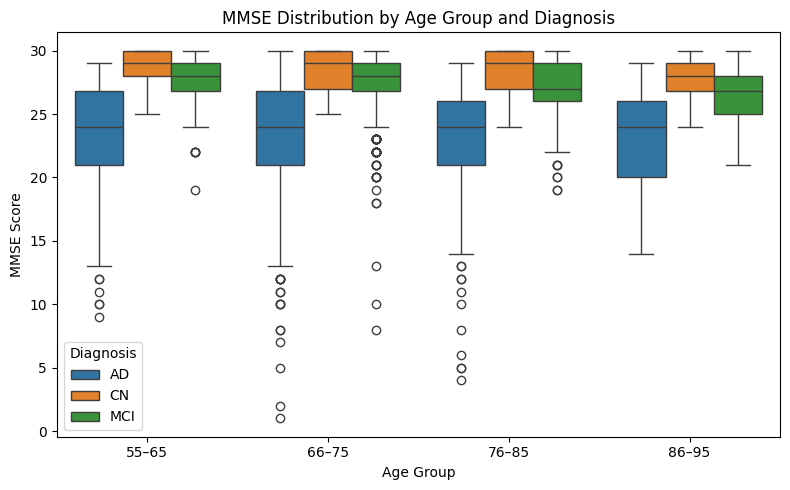

In [89]:
# Bin ages into groups
Adni_seq['Age_Group'] = pd.cut(Adni_seq['Age'], bins=[55, 65, 75, 85, 95], labels=['55–65', '66–75', '76–85', '86–95'])

# Boxplot: MMSE across age groups
plt.figure(figsize=(8, 5))
sns.boxplot(data=Adni_seq, x='Age_Group', y='Mmse', hue='Diagnosis')
plt.title('MMSE Distribution by Age Group and Diagnosis')
plt.xlabel('Age Group')
plt.ylabel('MMSE Score')
plt.tight_layout()
plt.show()

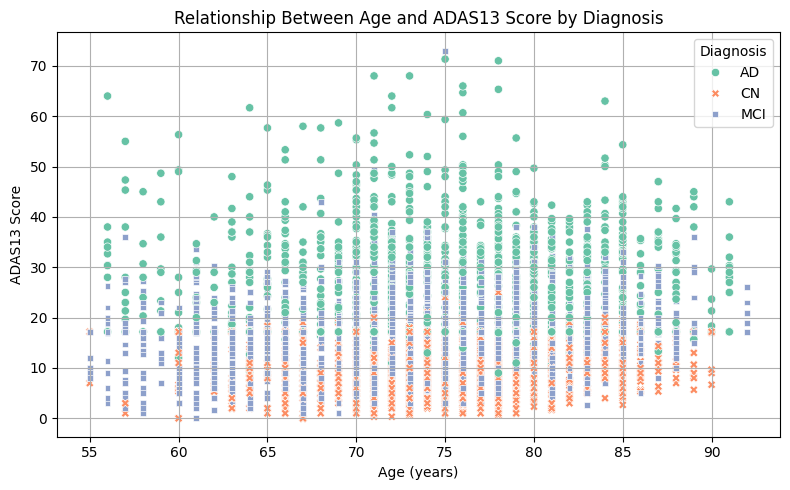

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatterplot: Age vs ADAS13, colored by Diagnosis
plt.figure(figsize=(8, 5))
sns.scatterplot(
    data=Adni_seq,
    x='Age',
    y='Adas_13',
    hue='Diagnosis',
    style='Diagnosis',
    palette='Set2'
)
plt.title('Relationship Between Age and ADAS13 Score by Diagnosis')
plt.xlabel('Age (years)')
plt.ylabel('ADAS13 Score')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4.9.1 Flagging cognitive changes in Patients cognitive scores

In [94]:
# Define features to calculate drop
features_to_track = ['Mmse', 'Moca', 'Logical_Memory_Total', 'Mpacc_Digit']

# Calculate drop (diff) for each feature
for feat in features_to_track:
    drop_col = f"{feat}_Drop"
    Adni_seq[drop_col] = Adni_seq.groupby('Participant_ID')[feat].diff()

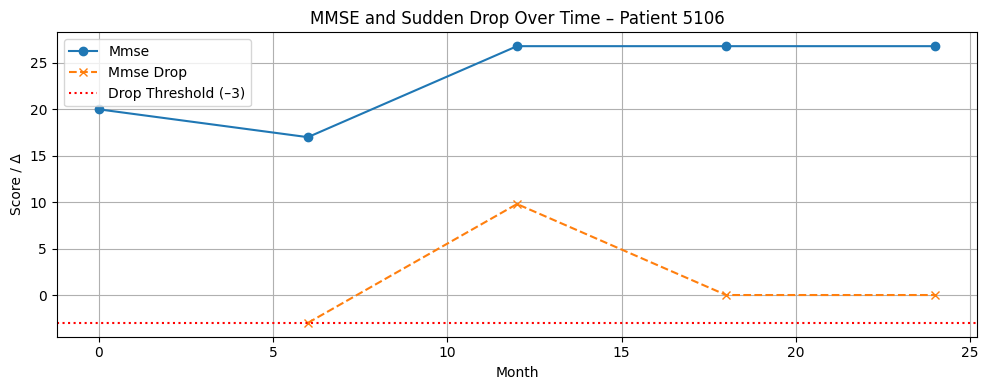

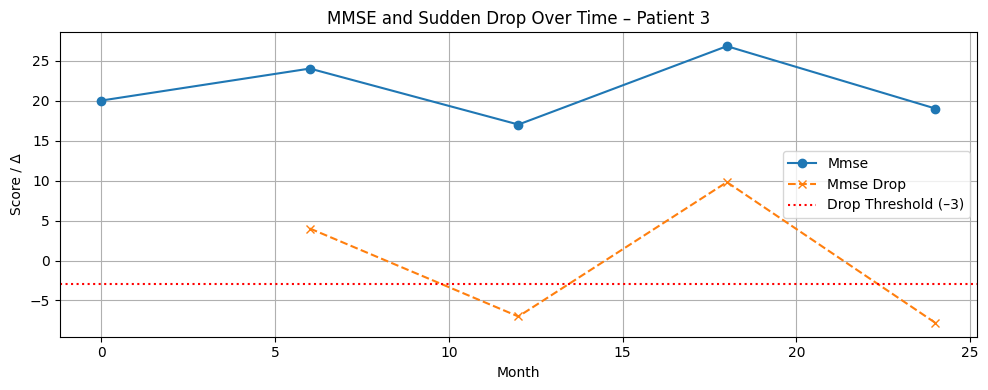

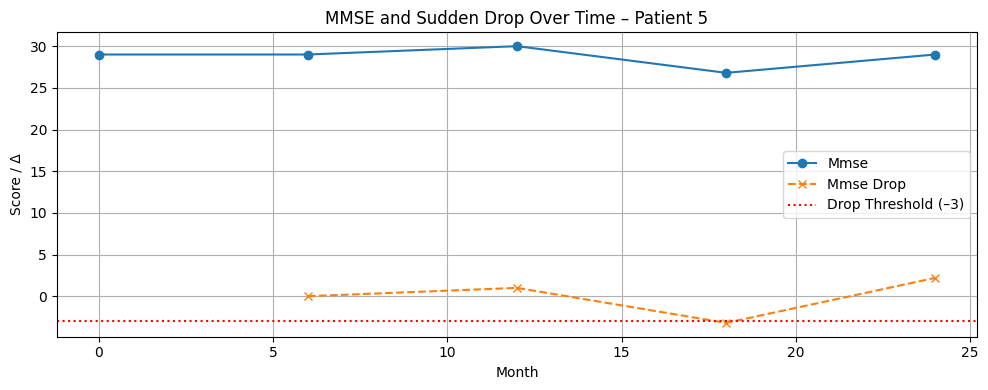

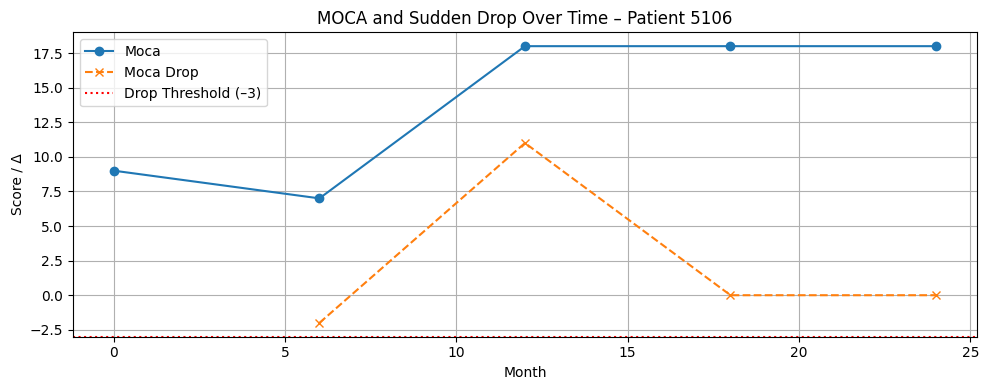

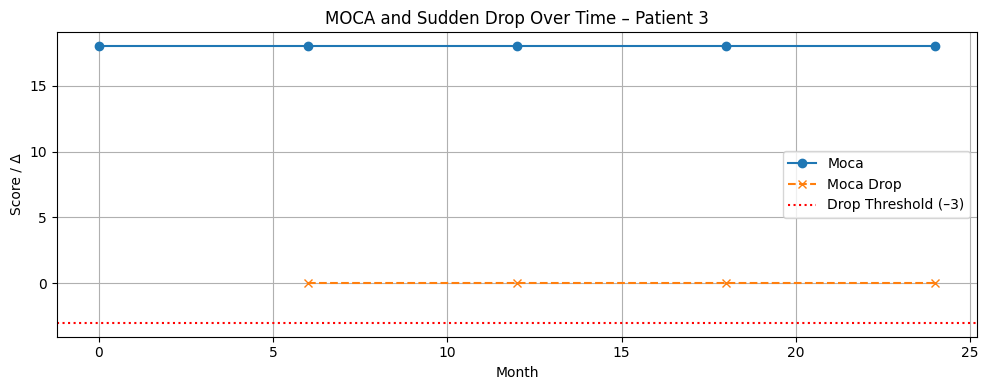

...

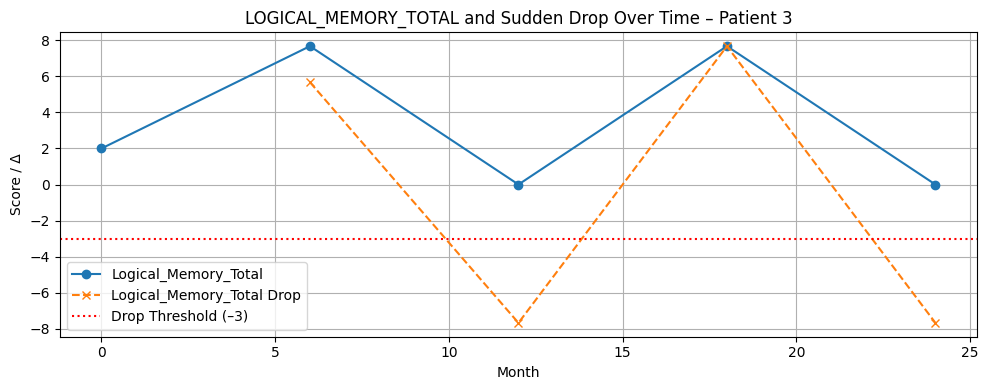

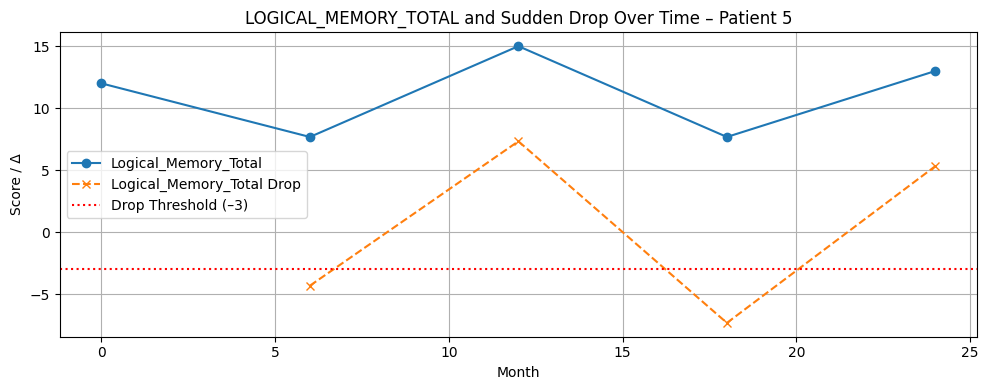

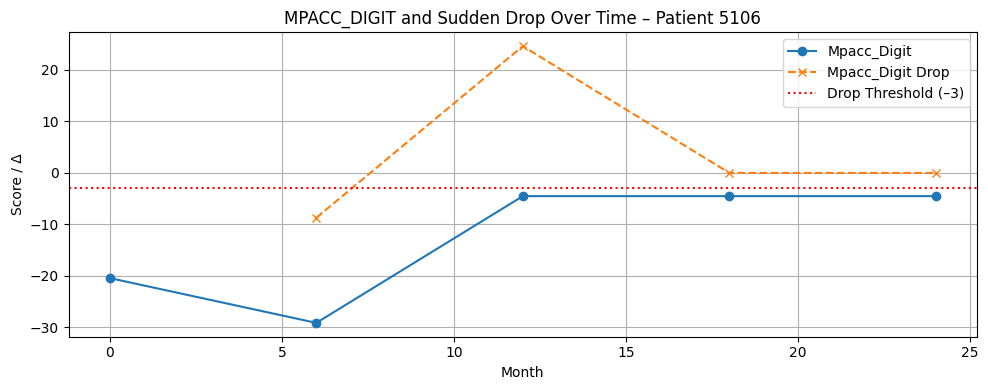

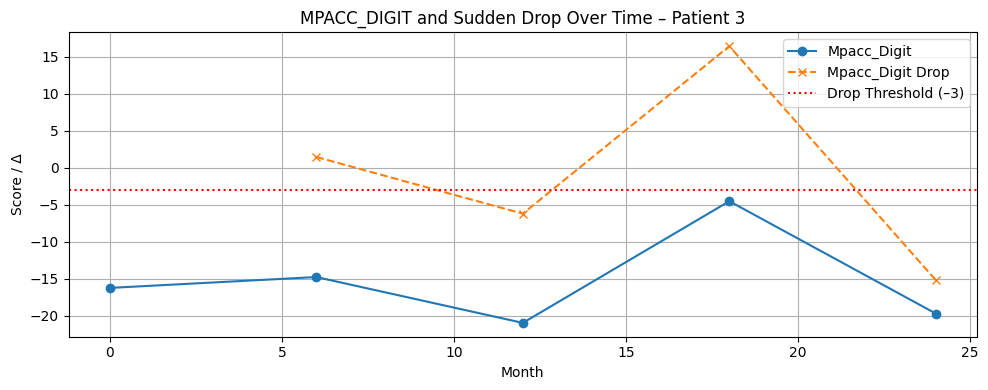

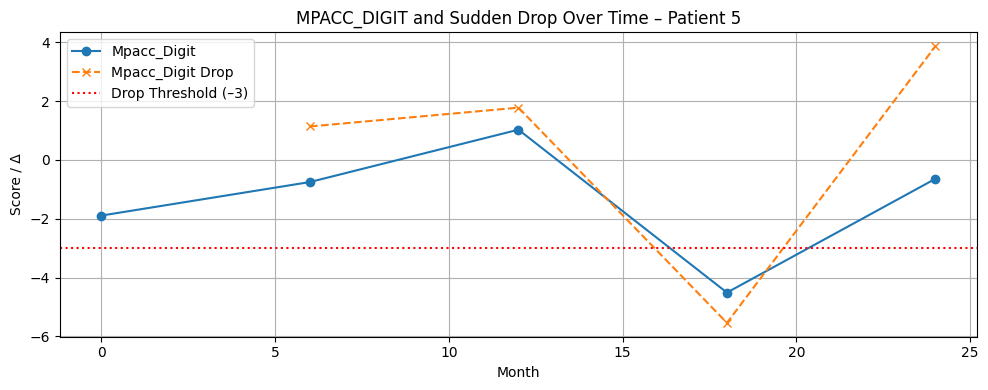

In [95]:
import matplotlib.pyplot as plt

# Pick a few patient IDs with complete records
example_patients = Adni_seq['Participant_ID'].value_counts().head(3).index.tolist()

# Plot for each feature
for feat in features_to_track:
    drop_col = f"{feat}_Drop"
    
    for pid in example_patients:
        patient_data = Adni_seq[Adni_seq['Participant_ID'] == pid]
        
        plt.figure(figsize=(10, 4))
        plt.plot(patient_data['Month'], patient_data[feat], marker='o', label=feat)
        plt.plot(patient_data['Month'], patient_data[drop_col], marker='x', linestyle='--', label=f"{feat} Drop")
        plt.axhline(-3, color='red', linestyle=':', label='Drop Threshold (–3)')
        
        plt.title(f"{feat.upper()} and Sudden Drop Over Time – Patient {pid}")
        plt.xlabel("Month")
        plt.ylabel("Score / Δ")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

To support early warning detection, we calculated the change in MMSE score between visits (ΔMMSE). Sudden drops (≥3 points) were flagged as clinical red alerts. This enabled temporal tracking of cognitive deterioration beyond static classification.
We extended temporal monitoring to multiple cognitive features by computing change scores per patient per visit (ΔFeature). Sudden negative deltas (≥3 point drops) were flagged as critical events, visualized across MMSE & MOCA. These insights support the design of patient-specific early warning systems.

In [96]:
# Define features to calculate rise
Adni_seq['Adas_13_Rise'] = Adni_seq.groupby('Participant_ID')['Adas_13'].diff()
Adni_seq['Cdr_sb_Rise'] = Adni_seq.groupby('Participant_ID')['Cdr_Sum_Boxes'].diff()
Adni_seq['Faq_Rise'] = Adni_seq.groupby('Participant_ID')['Faq'].diff()

In [97]:
Adni_seq.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5700 entries, 1 to 2660
Data columns (total 40 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Participant_ID             5700 non-null   int64   
 1   Gender                     5700 non-null   object  
 2   Age                        5700 non-null   float64 
 3   Education_Years            5700 non-null   int64   
 4   Ethnicity                  5700 non-null   object  
 5   Race                       5700 non-null   object  
 6   Marital_Status             5700 non-null   object  
 7   Apoe4_Count                5700 non-null   float64 
 8   Diagnosis                  5700 non-null   object  
 9   Visit_Code                 5700 non-null   object  
 10  Month                      5700 non-null   int64   
 11  Mmse                       5700 non-null   float64 
 12  Cdr_Sum_Boxes              5700 non-null   float64 
 13  Adas_11                    5700 non-nu

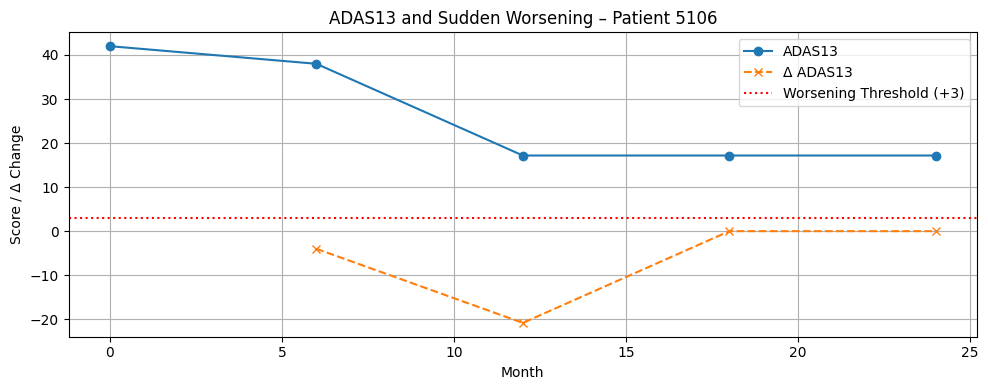

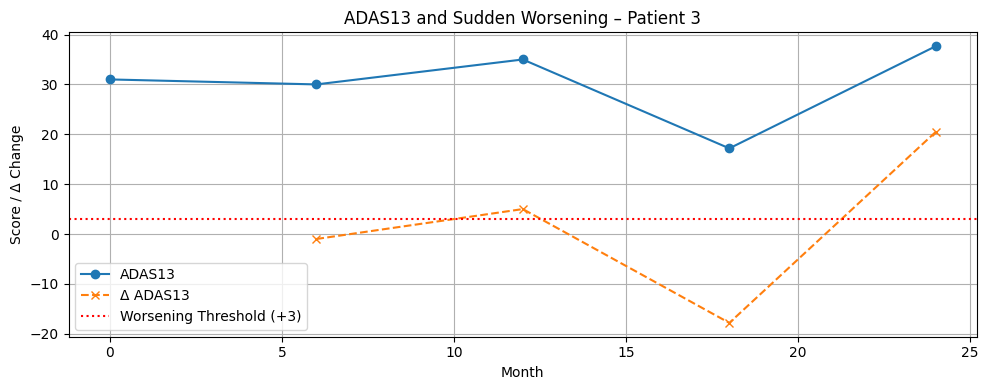

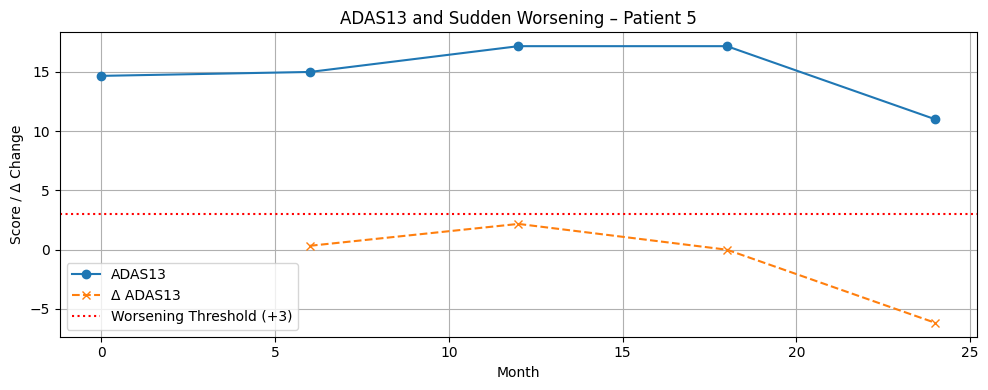

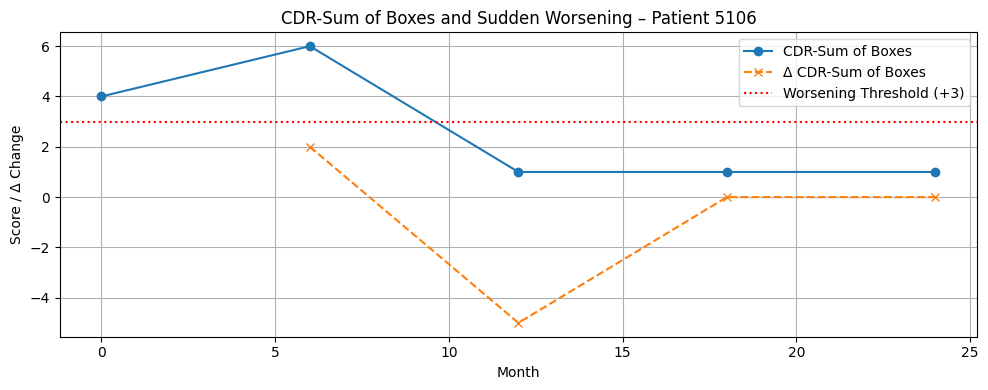

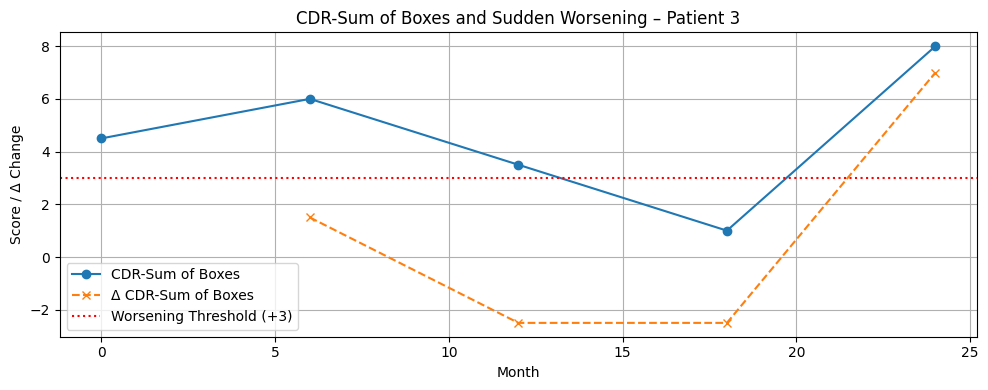

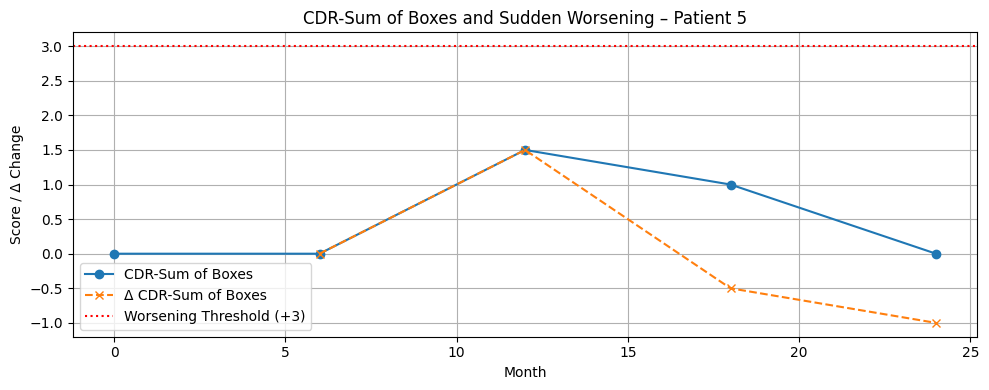

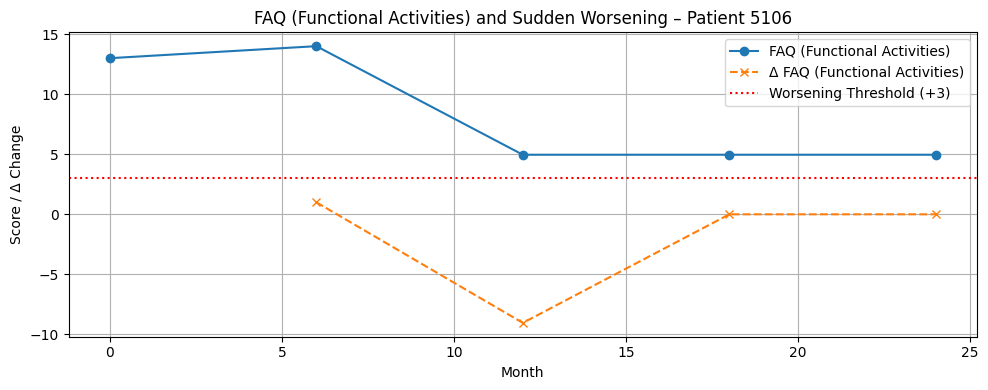

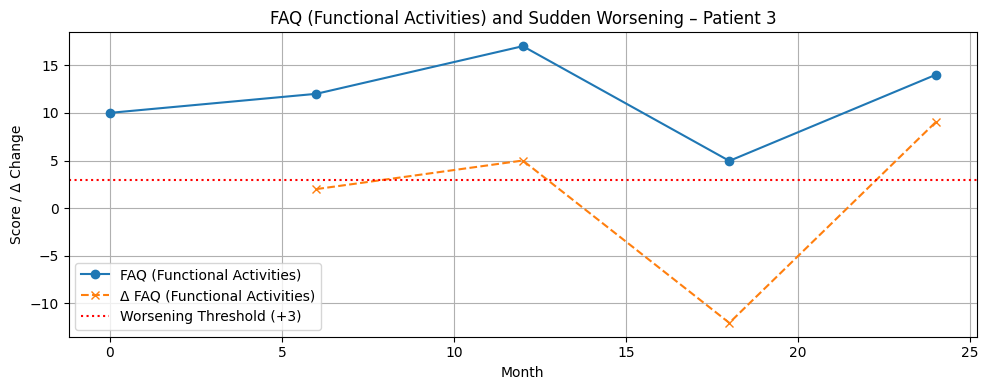

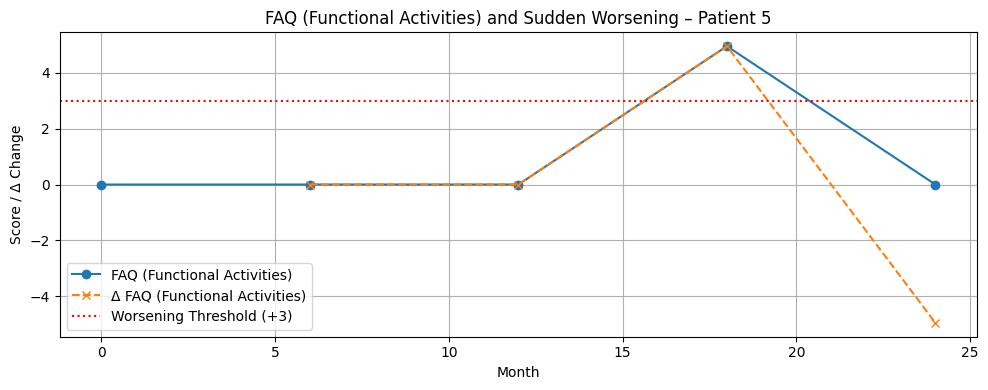

In [98]:
import matplotlib.pyplot as plt

#Mapping each rise column to its original score column and display name
rise_feature_map = {
    'Adas_13_Rise': 'Adas_13',
    'Cdr_sb_Rise': 'Cdr_Sum_Boxes',
    'Faq_Rise': 'Faq'
}

feature_labels = {
    'Adas_13_Rise': 'ADAS13',
    'Cdr_sb_Rise': 'CDR-Sum of Boxes',
    'Faq_Rise': 'FAQ (Functional Activities)'
}

#Selecting example patients (top 3 with most visits)
example_patients = Adni_seq['Participant_ID'].value_counts().head(3).index.tolist()

#Loop through features and patients to plot
for feature, base_feature in rise_feature_map.items():
    for pid in example_patients:
        patient_data = Adni_seq[Adni_seq['Participant_ID'] == pid]
        
        plt.figure(figsize=(10, 4))
        plt.plot(patient_data['Month'], patient_data[base_feature], marker='o', label=feature_labels[feature])
        plt.plot(patient_data['Month'], patient_data[feature], marker='x', linestyle='--', label='Δ ' + feature_labels[feature])
        plt.axhline(3, color='red', linestyle=':', label='Worsening Threshold (+3)')
        
        plt.title(f"{feature_labels[feature]} and Sudden Worsening – Patient {pid}")
        plt.xlabel("Month")
        plt.ylabel("Score / Δ Change")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

The rise in ADAS13, CDRSB, and FAQ scores were visualized per patient to track sudden worsening. A threshold of +3 points was used to highlight clinically significant changes. These visual timelines reveal when patients may have experienced abrupt cognitive or functional decline.

# 5.0 Summary Count of Patient Alert System

In [99]:
# Define alert thresholds
alert_thresholds = {
    'Mmse_Drop': -3,
    'Moca_Drop': -3,
    'Logical_Memory_Total_Drop': -3,
    'Mpacc_Digit_Drop': -3,      # Drop means worsening
    'Adas_13_Rise': 3,          # Rise means worsening
    'Cdr_sb_Rise': 3,
    'Faq_Rise': 3  
}

In [100]:
# Create a copy to avoid changing the main data
alert_df = Adni_seq.copy()

# For each feature, create a binary flag (1 = alert, 0 = no alert)
for col, threshold in alert_thresholds.items():
    if 'Drop' in col:
        alert_df[col + '_Alert'] = (alert_df[col] <= threshold).astype(int)
    else:
        alert_df[col + '_Alert'] = (alert_df[col] >= threshold).astype(int)

In [101]:
# List of the alert flag columns
alert_columns = [col + '_Alert' for col in alert_thresholds.keys()]

# Group by participant and sum the alert flags
patient_alert_summary = (
    alert_df
    .groupby('Participant_ID')[alert_columns]
    .sum()
    .reset_index()
)

# Optionally, add a total alert count
patient_alert_summary['Total_Alerts'] = patient_alert_summary[alert_columns].sum(axis=1)

# Preview the results
patient_alert_summary.head(10)

,Participant_ID,Mmse_Drop_Alert,Moca_Drop_Alert,Logical_Memory_Total_Drop_Alert,Mpacc_Digit_Drop_Alert,Adas_13_Rise_Alert,Cdr_sb_Rise_Alert,Faq_Rise_Alert,Total_Alerts
0,3,2,0,2,2,2,1,2,11
1,5,1,0,2,1,0,0,1,5
2,6,1,0,2,1,0,0,0,4
3,7,2,0,2,1,2,1,1,9
4,10,0,0,2,1,2,1,2,8
5,14,0,0,1,1,1,0,1,4
6,15,1,0,2,2,2,0,0,7
7,16,1,0,1,1,1,0,1,5
8,21,1,0,2,1,1,0,1,6
9,22,0,0,1,0,2,0,1,4


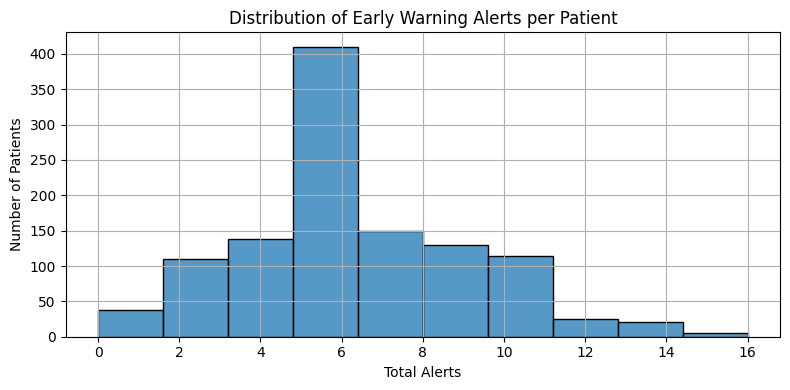

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histogram of total alerts
plt.figure(figsize=(8, 4))
sns.histplot(patient_alert_summary['Total_Alerts'], bins=10, kde=False)
plt.title("Distribution of Early Warning Alerts per Patient")
plt.xlabel("Total Alerts")
plt.ylabel("Number of Patients")
plt.grid(True)
plt.tight_layout()
plt.show()

# Export to CSV if needed
# patient_alert_summary.to_csv('patient_alert_summary.csv', index=False)

- Patient-level early warning profile

- Quantitative way to compare alerts vs. diagnosis

- Visualizable distribution of pre-clinical warning events
